# Imports 

In [13]:

%reload_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt

from qick import *
from qick.helpers import gauss
from tqdm import tqdm_notebook as tqdm

import time
import os
import sys
sys.path.append('/home/xilinx/jupyter_notebooks/')
sys.path.append('C:\\_Lib\\python\\rfsoc\\rfsoc_multimode\\example_expts')
import scipy as sp
import json
from scipy.fft import fft, fftfreq

from slab.instruments import *
from slab.experiment import Experiment
from slab.datamanagement import SlabFile
from slab import get_next_filename, AttrDict
from slab import Experiment, dsfit, AttrDict

# Figure params
plt.rcParams['figure.figsize'] = [10,6]
plt.rcParams.update({'font.size': 14})

In [14]:
from slab.dsfit import *
import os
from scipy.interpolate import griddata
from numpy import mgrid, array, zeros,abs,pi,cos,transpose, linspace
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from tempfile import TemporaryFile
font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : 15}
import json
from h5py import File
from datetime import datetime
import time
from slab.datamanagement import SlabFile
import matplotlib.pyplot as plt
import numpy as np
import os
import json
from slab.dsfit import *
from scipy.optimize import curve_fit
# import experiments.fitting as fitter
from matplotlib.colors import Normalize

## Import modules from parent and multimode expts

In [15]:
import json
import os

# Get the current working directory
path = os.getcwd()
print("Current Path:", path)

# Isolate the parent directory
parent_path = os.path.dirname(path)
print("Parent Path:", parent_path)

# Add the parent path to the sys.path
sys.path.append(parent_path)

Current Path: c:\_Lib\python\multimode_expts\analysis_notebooks
Parent Path: c:\_Lib\python\multimode_expts


In [16]:
import sys

# Path to add
expts_path = 'C:\\_Lib\\python\\multimode_expts'

# Add the path to the system path at the highest priority
if expts_path not in sys.path:
    sys.path.insert(0, expts_path)
    print('Path added at highest priority')

# Verify the path is added
print(sys.path)


['C:\\_Lib\\python\\multimode_expts', 'c:\\_Lib\\python\\multimode_expts\\analysis_notebooks', 'C:\\_Lib\\python', 'C:\\_Lib\\python\\slab', 'C:\\_Lib\\python\\qick\\qick_lib', 'C:\\_Lib\\python\\rfsoc\\rfsoc_multimode\\example_expts', 'c:\\_Lib\\python\\multimode_expts\\analysis_notebooks', 'c:\\Users\\26049\\.conda\\envs\\slab\\python38.zip', 'c:\\Users\\26049\\.conda\\envs\\slab\\DLLs', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib', 'c:\\Users\\26049\\.conda\\envs\\slab', '', 'C:\\Users\\26049\\AppData\\Roaming\\Python\\Python38\\site-packages', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\site-packages', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\site-packages\\easy_lmfit-1.0-py3.8.egg', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\site-packages\\attrdict-2.0.1-py3.8.egg', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\site-packages\\win32', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\site-packages\\win32\\lib', 'c:\\Users\\26049\\.conda\\envs\\slab\\lib\\site-packages\\Pythonwin', '/hom

In [17]:
from fitting.fit_display import *

In [18]:
import experiments.fitting as fitter
from numpy.linalg import inv

# Exp path

In [19]:

# print("path: ", path)

"""Reopen saved data"""
def prev_data(expt_path, filename):
    temp_data_file = expt_path+'\\'+filename
    with SlabFile(temp_data_file) as a:
        attrs = dict()
        for key in list(a.attrs):
            attrs.update({key:json.loads(a.attrs[key])})
        keys = list(a)
        temp_data = dict()
        for key in keys:
            temp_data.update({key:np.array(a[key])})
        # print(f'Extracted data and attrs {list(a.attrs)}')
    return temp_data, attrs

data_parent =  r'H:\Shared drives\SLab\Multimode\experiment\240911'
expt_path=data_parent+'\\data1'
expt_path_old = data_parent+'\\data'
print('Data are extracted from', expt_path)

Data are extracted from H:\Shared drives\SLab\Multimode\experiment\240911\data1


# Yaml Cfg

In [ ]:
config_file = parent_path+'\\configs\\config_rfsoc_ziqian.yml'
config_path = config_file
print('Config will be', config_path)

exp_param_file = parent_path+'\\configs\\experiment_config.yml'
exp_param_path = exp_param_file
print('Exp Param will be', exp_param_path)
qubit_i = 0
import yaml
with open(config_file, 'r') as cfg_file:
    yaml_cfg = yaml.safe_load(cfg_file)
yaml_cfg = AttrDict(yaml_cfg)

Config will be c:\_Lib\python\multimode_expts\config_rfsoc_ziqian.yml
Exp Param will be c:\_Lib\python\multimode_expts\experiment_config.yml


# Actual experiment data

## Single shot

### M1 f0g1

#### M1 f0g1 phase overhead  

[4.81226078e-01 2.78123333e-03 3.37144636e+01 4.98133631e-01]
Frequency from fit [MHz]: 0.002781233329487182 +/- 3.494162663961301e-06
Pi length from avgi data: 235.99196273434134
	Pi/2 length from avgi data: 117.99598136717067


235.99196273434134

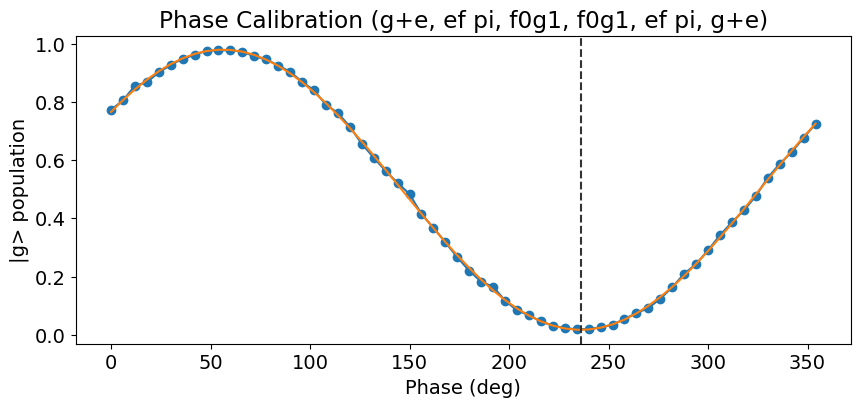

In [8]:
file_list = np.arange(2035, 2096)
vary_pts = np.arange(0, 361,6)
y_list = []
active_reset = True
threshold = -22.829534213631177
name = '_single_shot_phase_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration (g+e, ef pi, f0g1, f0g1, ef pi, g+e)')



#### M1 f0g1 phase frequency

[ 0.47047317  2.61153659 44.78166877  0.49469713]
Frequency from fit [MHz]: 2.611536591625188 +/- 0.001169318123711041
Pi length from avgi data: 0.2395549339183591
	Pi/2 length from avgi data: 0.11977746695917955


0.2395549339183591

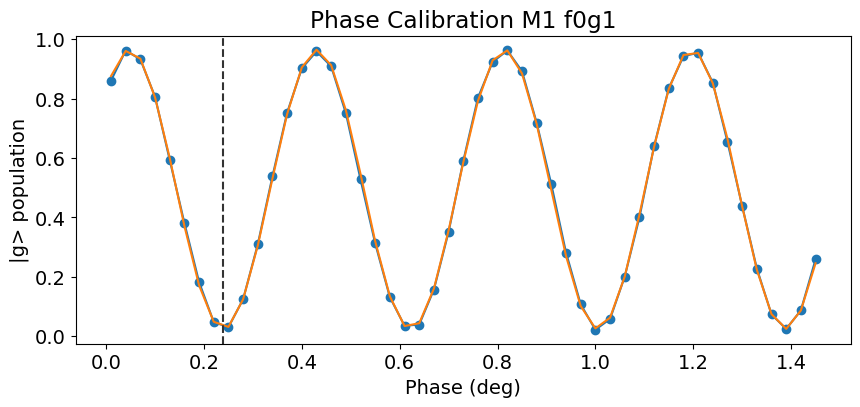

In [1362]:
file_list = np.arange(154,204)
# vary_pts = np.arange(0, 361,12)
vary_pts = np.arange(0.01, 1.5, 0.03)
y_list = []
active_reset = True
threshold =  -22.829534213631177 #-40.69974573466379
name = '_single_shot_parity_time_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration M1 f0g1')

### M1-S1 phase

#### M1-S1 phase overhead

[4.71460838e-01 2.77355510e-03 1.57263506e+01 4.99910966e-01]
Frequency from fit [MHz]: 0.0027735551022537662 +/- 3.451514483033627e-06
Pi length from avgi data: 254.66077533364646
	Pi/2 length from avgi data: 127.33038766682323


0.9698989898989899

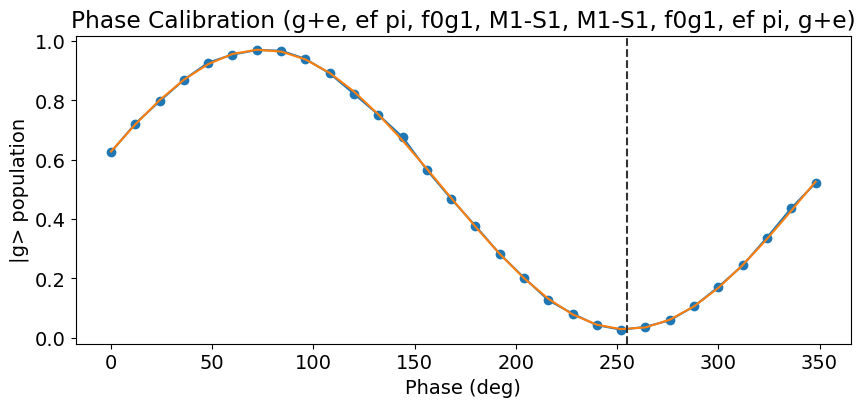

In [1363]:
# file_list = np.arange(2227, 2257) # without gate based
# file_list = np.arange(2134, 2165) # with gate based
file_list = np.arange(2515, 2546) # with gate based
# file_list = np.arange(2546, 2577) # with gate based for flat top ge 
# file_list = np.arange(2577, 2608) # with gate based 
file_list = np.arange(2608, 2639) # with gate based  for ef gaussian

vary_pts = np.arange(0, 361,12)
y_list = []
active_reset = True
threshold = -22.829534213631177
name = '_single_shot_phase_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration (g+e, ef pi, f0g1, M1-S1, M1-S1, f0g1, ef pi, g+e)')

max(y_list)

In [1364]:
(360 -254.66077533364646)/2

52.66961233317677

In [1365]:
125.73872996725267/2

62.86936498362633

#### M1-S1 cross phase due to M1-S2

[4.33613372e-01 2.77213462e-03 1.43320301e+02 4.87519665e-01]
Frequency from fit [MHz]: 0.002772134618265379 +/- 7.173509083881689e-06
Pi length from avgi data: 126.93757707910734
	Pi/2 length from avgi data: 63.46878853955367


0.9197817740957769

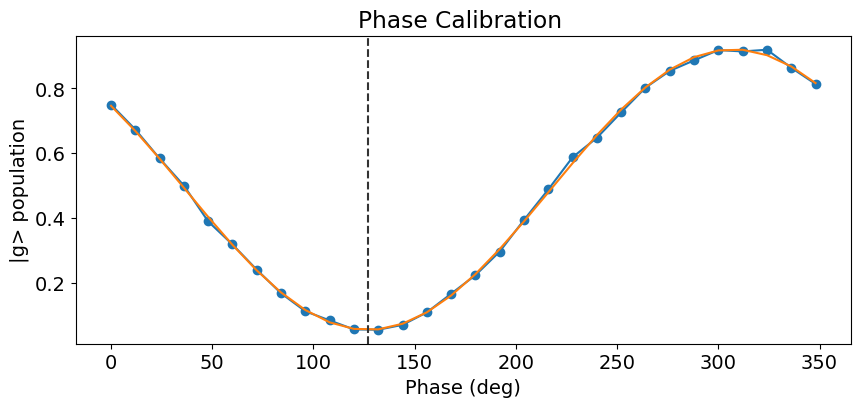

In [1366]:
# file_list = np.arange(2320, 2351) # without correcting bare S1 overhead
# file_list = np.arange(2483, 2514) # with correcting bare S1 overhead
# file_list = np.arange(2715, 2746) # with gate based
# file_list = np.arange(2746, 2777) # with gate based for flat top ge
file_list = np.arange(2777, 2808) # with gate based
vary_pts = np.arange(0, 361,12)
y_list = []
active_reset = True
threshold = -50 #-22.829534213631177
name = '_single_shot_phase_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')
max(y_list)



In [1367]:
# calculate the cross-phase overhead
from_fitting = 126.93757707910734 #122.71934489248268 #117.66519382708827
self_overhead = attrs['config']['device']['storage']['idling_phase'][0][0]
idling_frequency = attrs['config']['device']['storage']['idling_freq'][0]
# cycles2us = 0.0023251488095238095
gate_length = 9.653673472006306 #5.852204083203784 #2.0507346944012617
cross_phase_overhead = (from_fitting-gate_length*idling_frequency*180*2 -self_overhead*2 ) % -360
print(cross_phase_overhead)

-113.54401205031172


In [1368]:
-113.54401205031172/5#attrs['config']['device']['storage']['idling_phase'][0][1]

-22.708802410062344

In [1369]:
from_fitting-gate_length*idling_frequency*180*2

9141.116763283335

In [1370]:
from_fitting-gate_length*idling_frequency*180*2 -self_overhead*2 

9246.455987949688

In [1371]:
idling_frequency

-2.5937677197135596

In [1372]:
0.035*4+0.01+0.035*4+0.01+6*0.005+0.615287+0.01+0.005*6+1.055448+0.01

2.050735

#### M1-S1 cross phase due to M1-S3

[4.32810560e-01 2.76608652e-03 1.37213160e+02 4.85841429e-01]
Frequency from fit [MHz]: 0.002766086522052046 +/- 2.0978330615702233e-05
Pi length from avgi data: 133.34808274937404
	Pi/2 length from avgi data: 66.67404137468702


133.34808274937404

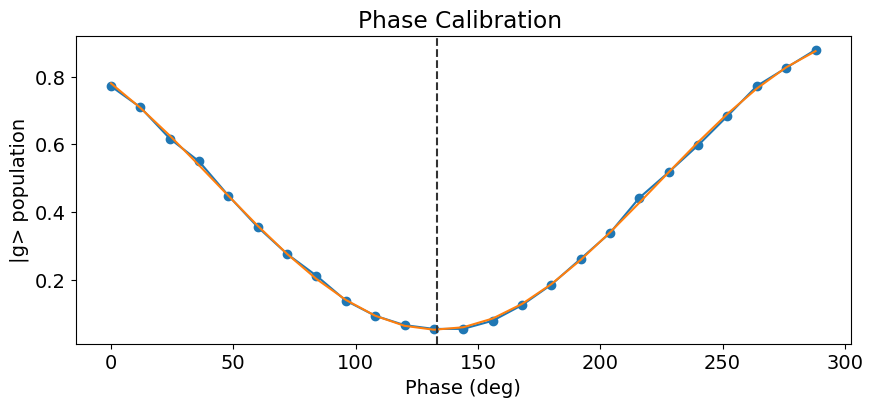

In [1373]:
# file_list = np.arange(2808, 2839) # without correcting bare S1 overhead
file_list = np.arange(4074, 4100, 1)
# file_list = np.arange(2932, 2962, 1)
vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -22, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')



In [1374]:
spectator_mode_no = 5
phase = cross_storage_phase_analysis(attrs, gate_length= get_spec_idling_time(s, spectator_mode_no, yaml_cfg), from_fitting=133.34808274937404,
                                      target_mode_no=1, add = True)
print(phase)


NameError: name 's' is not defined

In [640]:
phase/5

3.5274636614649353

#### M1-S1 cross phase due to M1-S7

[4.45050609e-01 2.78051481e-03 8.08052855e+01 4.88066024e-01]
Frequency from fit [MHz]: 0.0027805148141045507 +/- 1.1453777224549497e-05
Pi length from avgi data: 189.00847820578036
phase at max: 12
Pi length from avgi data: 189.00847820578036
	Pi/2 length from avgi data: 94.50423910289018
189.00847820578036


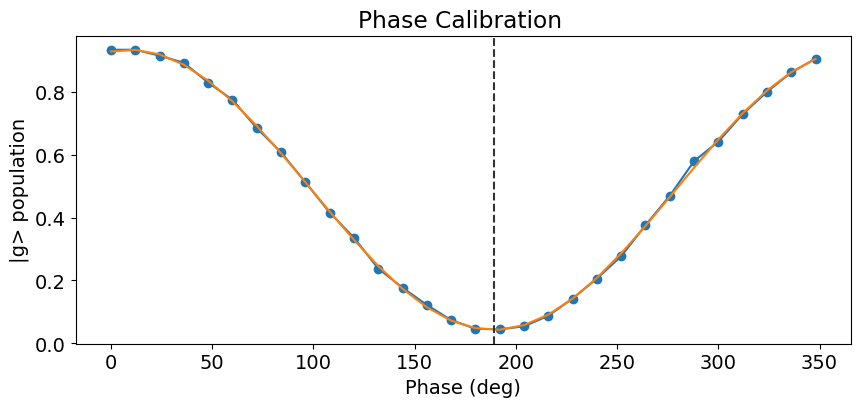

In [1176]:
# file_list = np.arange(2808, 2839) # without correcting bare S1 overhead
file_list = np.arange(6926, 6957, 1)
# file_list = np.arange(6957, 6988, 1)
# file_list = np.arange(2932, 2962, 1)
vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -20, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
pi_length = phase_calibration(xpts_ns, y_list, fitparams=None, min_pi= True, title='Phase Calibration ')
print(pi_length)



In [1178]:
from_fitting = pi_length #+180 
phase = cross_storage_phase_analysis(attrs, gate_length= get_spec_idling_time(1, 7, yaml_cfg), #filtered_row['gate_length'].values[0], 
                                     from_fitting=from_fitting ,
                                       target_mode_no=1,
                                         add = False, cfg = yaml_cfg)
phase = phase/(1)
print(phase)


using values from cfg
-52.66961233 -2.5937677197135596
-90.34878087129891


In [ ]:
phase/5

3.5274636614649353

##### Check 1
with corrected phase

[ 4.47665927e-01  2.77101142e-03 -8.93369637e+01  4.85502383e-01]
Frequency from fit [MHz]: 0.002771011417577025 +/- 9.723182543025661e-06
Pi length from avgi data: 179.77487542023144
	Pi/2 length from avgi data: 89.88743771011572


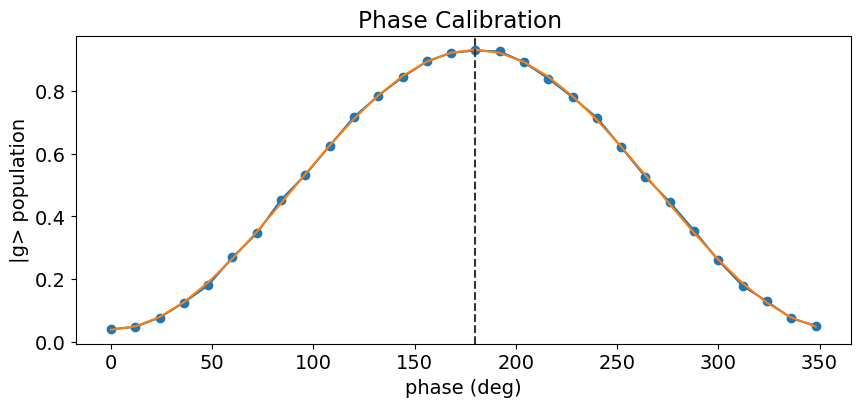

In [79]:
file_list = np.arange(2359, 2390) # without correcting bare S1 overhead
vary_pts = np.arange(0, 361,12)
y_list = []
active_reset = True
threshold = -22.829534213631177
name = '_single_shot_phase_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')

##### Check 2
with 1 prepared in spectator instead of 0 + 1 

[ 4.31743889e-01  2.77444737e-03 -8.97719714e+01  4.82421110e-01]
Frequency from fit [MHz]: 0.0027744473733482193 +/- 1.595599955387679e-05
Pi length from avgi data: 179.98776690857588
	Pi/2 length from avgi data: 89.99388345428794


0.9143317879459786

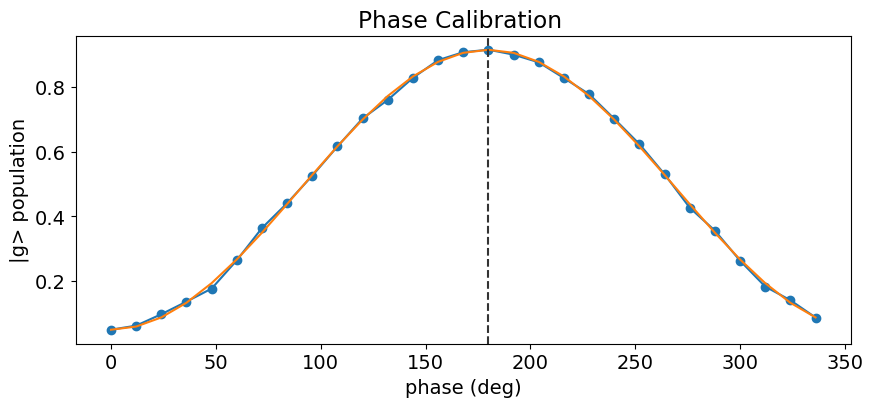

In [85]:
file_list = np.arange(2390, 2420) # without correcting bare S1 overhead
vary_pts = np.arange(0, 361,12)
y_list = []
active_reset = True
threshold = -22.829534213631177
name = '_single_shot_phase_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')
# max(y_list)

##### Check 3
with 1 prepared in spectator and doing a total of 3 spectator operations

[ 4.27827456e-01  2.78524470e-03 -2.91172171e+01  4.85765335e-01]
Frequency from fit [MHz]: 0.002785244695579806 +/- 5.204415295174442e-06
Pi length from avgi data: 118.79787770160023
	Pi/2 length from avgi data: 59.398938850800114


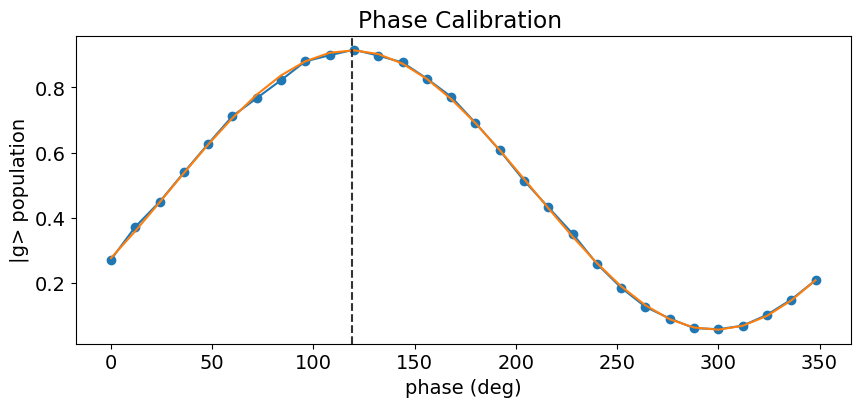

In [89]:
file_list = np.arange(2421, 2452) # without correcting bare S1 overhead
vary_pts = np.arange(0, 361,12)
y_list = []
active_reset = True
threshold = -22.829534213631177
name = '_single_shot_phase_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')

#### M1 - S1 phase frequency

[ 0.46413196  2.59376772 25.3671484   0.4867601 ]
Frequency from fit [MHz]: 2.5937677197135596 +/- 0.0008090456456844426
Pi length from avgi data: 0.26198787722165207
	Pi/2 length from avgi data: 0.13099393861082603


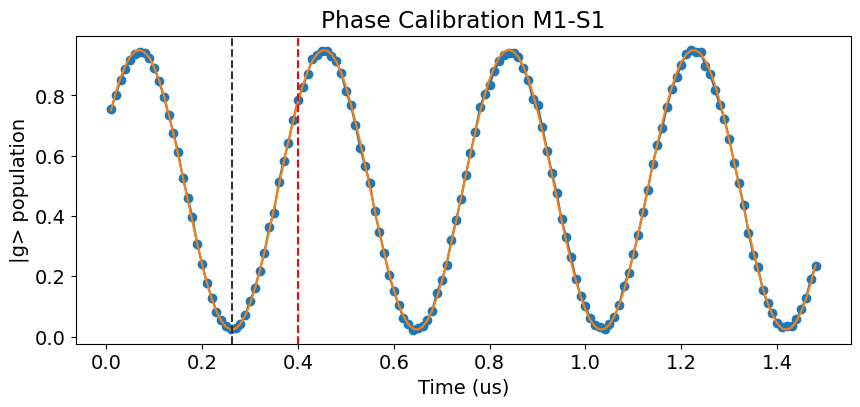

In [260]:
file_list = np.arange(50,100)
file_list = np.arange(100,249)
# vary_pts = np.arange(0, 361,12)
vary_pts = np.arange(0.01, 1.5, 0.01)
y_list = []
active_reset = True
threshold =  -49.82055670476302 #-40.69974573466379
# name = '_single_shot_parity_time_sweep.h5'
name = '_single_shot_time_sweep.h5'

for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, vlines=[0.4], title='Phase Calibration M1-S1', xlabel='Time (us)')

[  0.4708298    2.59704017 231.01244534   0.502012  ]
Frequency from fit [MHz]: 2.5970401709295188 +/- 0.0011105644129158518
Pi length from avgi data: 0.2342277065086251
	Pi/2 length from avgi data: 0.11711385325431255


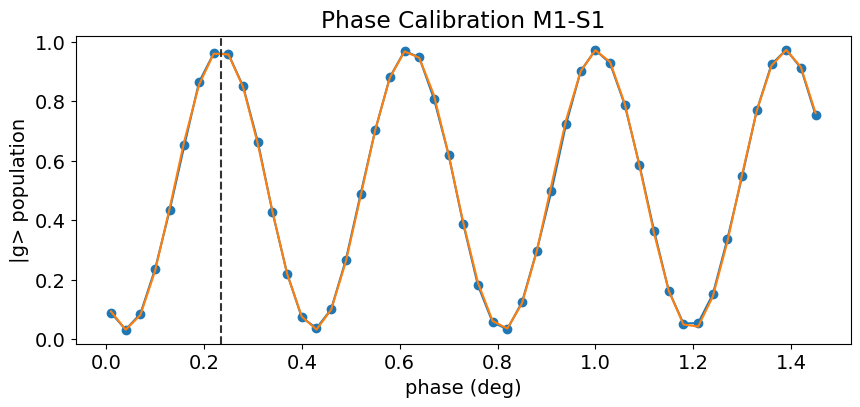

In [40]:
file_list = np.arange(204,254)
# vary_pts = np.arange(0, 361,12)
vary_pts = np.arange(0.01, 1.5, 0.03)
y_list = []
active_reset = True
threshold =  -22.829534213631177 #-40.69974573466379
# name = '_single_shot_parity_time_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration M1-S1')

#### M1 - S6 idling phase frequency

[   0.4504        3.21213255 -161.34074274    0.50771073]
Frequency from fit [MHz]: 3.212132546428414 +/- 0.009610995413306482
Pi length from avgi data: 0.21735364893896358
	Pi/2 length from avgi data: 0.10867682446948179


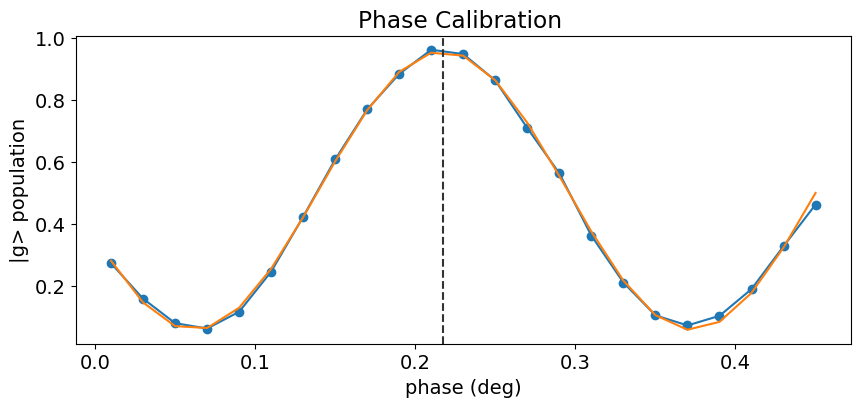

In [33]:
# file_list = np.arange(25,43)
file_list = np.arange(117,141)
# vary_pts = np.arange(0, 361,12)
vary_pts = np.arange(0.01, 1, 0.02)
y_list = []
active_reset = False
threshold =  -50 #-40.69974573466379
name = '_single_shot_parity_time_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')

### M1-S2 phase

#### M1-S2 phase overhead

[4.43812678e-01 2.78252405e-03 1.41868302e+02 4.98324994e-01]
Frequency from fit [MHz]: 0.0027825240465909934 +/- 6.006627284009192e-06
Pi length from avgi data: 127.91313821895228
	Pi/2 length from avgi data: 63.95656910947614


0.05509249847529986

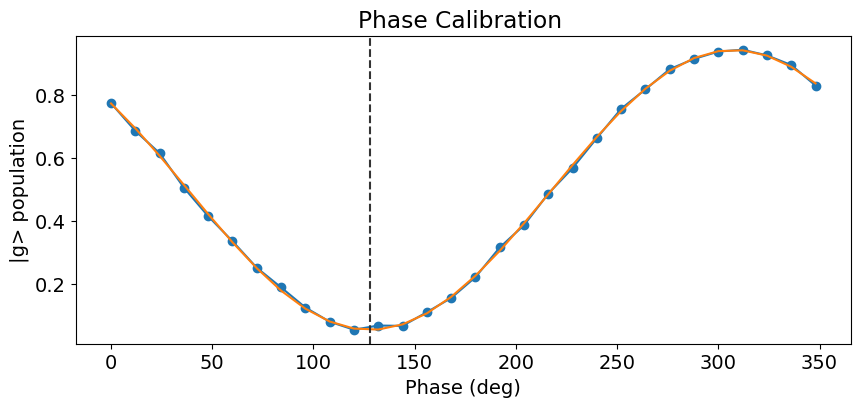

In [427]:
# file_list = np.arange(2227, 2257) # without gate based
# file_list = np.arange(2452, 2482) # with gate based
file_list = np.arange(2639, 2670) # with gate based
vary_pts = np.arange(0, 361,12)
y_list = []
active_reset = True
threshold = -50 #22.829534213631177
name = '_single_shot_phase_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')

min(y_list)

In [429]:
(360 - 127.91313821895228)/2

116.04343089052387

#### M1-S2 cross phase due to M1-S1

[4.02181876e-01 2.76601545e-03 4.98520313e+00 4.82597252e-01]
Frequency from fit [MHz]: 0.002766015450603777 +/- 5.656778975006637e-06
Pi length from avgi data: 266.14175757940455
	Pi/2 length from avgi data: 133.07087878970228


0.8820554319239329

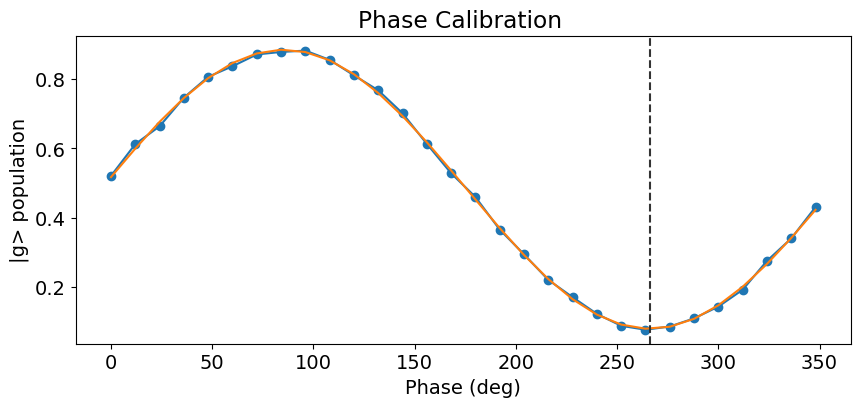

In [491]:
# file_list = np.arange(2808, 2839) # without correcting bare S1 overhead
file_list = np.arange(2839, 2870, 1)
vary_pts = np.arange(0, 361,12)
y_list = []
active_reset = True
threshold = -22.829534213631177
name = '_single_shot_phase_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')
max(y_list)



In [493]:
# calculate the cross-phase overhead
from_fitting = 266.14175757940455 #142.17879719613117 + 180 #122.71934489248268 #117.66519382708827
self_overhead = attrs['config']['device']['storage']['idling_phase'][1][1]
idling_frequency = attrs['config']['device']['storage']['idling_freq'][1]
# cycles2us = 0.0023251488095238095
gate_length = 8.9738740951692 #1.9147748190338403 #5.852204083203784 #2.0507346944012617
cross_phase_overhead = (from_fitting-gate_length*idling_frequency*180*2 -self_overhead*2 ) % -360
print(cross_phase_overhead)

-2.563109698538028


In [486]:
55*5%360

275

In [494]:
-2.563109698538028 /3

-0.8543698995126761

In [ ]:
1.3879588241456986

#### M1-S2 cross phase due to M1-S3

[ 4.40162139e-01  2.79551308e-03 -8.31909819e+01  4.87080703e-01]
Frequency from fit [MHz]: 0.0027955130769549705 +/- 1.007358602447262e-05
Pi length from avgi data: 172.0922233191053
	Pi/2 length from avgi data: 86.04611165955265


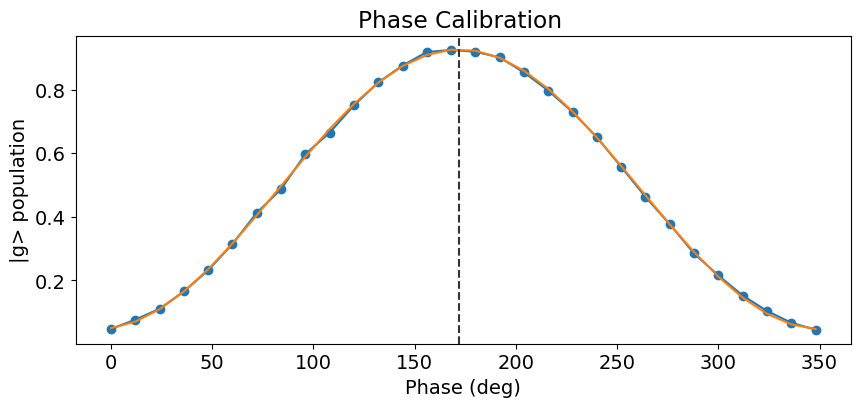

In [742]:
file_list = np.arange(3056, 3087, 1)
# file_list = np.arange(3149, 3180, 1)
file_list = np.arange(3180, 3211, 1)
vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -50, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')

In [743]:
phase = cross_storage_phase_analysis(attrs, gate_length=6.442776360943899, # 2.2475921203146334 , #10.637960601573166, 
                                     from_fitting=172.0922233191053+ 180,
                                       target_mode_no=2, add = True)
print(phase)

3.0926652017333254


In [738]:
phase / 5

2.2897035119760405

#### M1 - S2 phase frequency

[  0.46183044   2.85524008 150.08764422   0.4881364 ]
Frequency from fit [MHz]: 2.8552400829167235 +/- 0.0018392968814628591
Pi length from avgi data: 0.11665914861730092
	Pi/2 length from avgi data: 0.05832957430865046


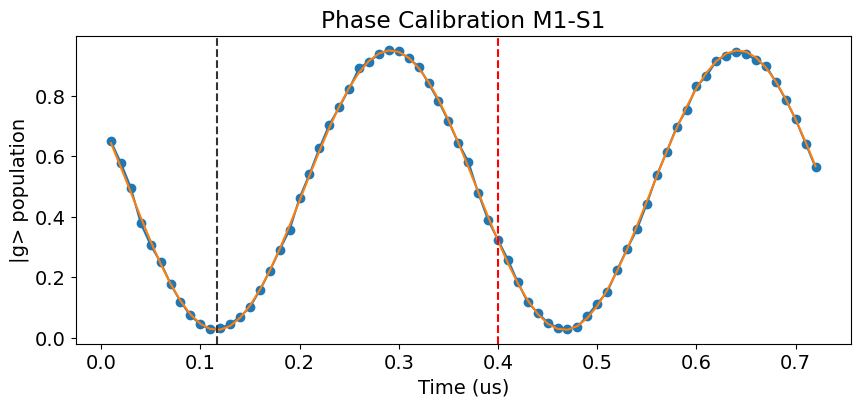

In [436]:
file_list = np.arange(50,100)
file_list = np.arange(249,322)
# vary_pts = np.arange(0, 361,12)
vary_pts = np.arange(0.01, 1.5, 0.01)
y_list = []
active_reset = True
threshold =  -49.82055670476302 #-40.69974573466379
# name = '_single_shot_parity_time_sweep.h5'
name = '_single_shot_time_sweep.h5'

for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, vlines=[0.4], title='Phase Calibration M1-S1', xlabel='Time (us)')

### M1-S3 phase

#### M1-S2 phase overhead

[4.52532382e-01 2.77841339e-03 1.48253922e+02 5.00764281e-01]
Frequency from fit [MHz]: 0.002778413392426686 +/- 6.894362030862956e-06
Pi length from avgi data: 121.71822591132165
	Pi/2 length from avgi data: 60.85911295566083


0.049959546925566346

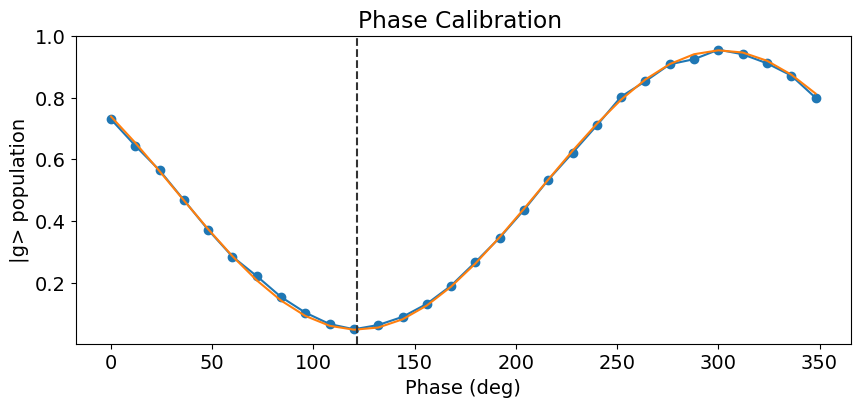

In [572]:
# file_list = np.arange(2227, 2257) # without gate based
# file_list = np.arange(2452, 2482) # with gate based
file_list = np.arange(2870, 2901) # with gate based
vary_pts = np.arange(0, 361,12)
y_list = []
active_reset = True
threshold = -22 #22.829534213631177
name = '_single_shot_phase_sweep.h5'
for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')

min(y_list)

In [573]:
(360 - 121.71822591132165)/2

119.14088704433917

#### M1-S3 cross phase due to M1-S1

[4.45242356e-01 2.77345021e-03 2.61429202e+02 4.85654143e-01]
Frequency from fit [MHz]: 0.0027734502145513344 +/- 1.2907338087831777e-05
Pi length from avgi data: 188.8650355658507
	Pi/2 length from avgi data: 94.43251778292534


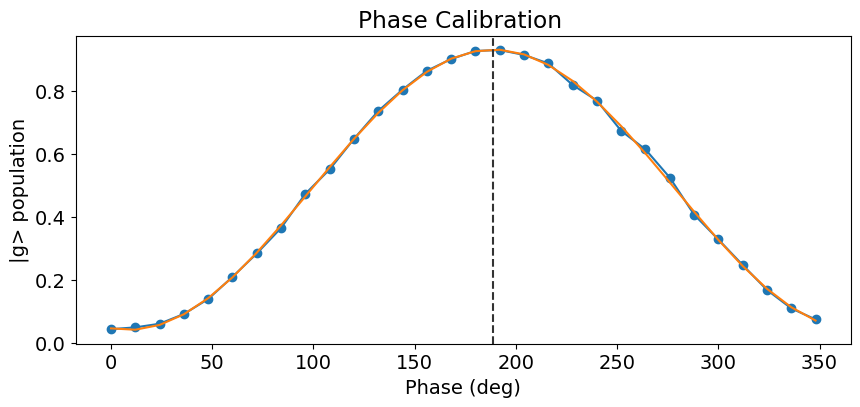

In [643]:
# file_list = np.arange(2808, 2839) # without correcting bare S1 overhead
file_list = np.arange(2901, 2931, 1)
file_list = np.arange(2994, 3025, 1)
# file_list = np.arange(2932, 2962, 1)
vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -22, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')



In [645]:

phase = cross_storage_phase_analysis(attrs, gate_length=6.442776360943899, from_fitting=188.8650355658507 + 180, target_mode_no=1, add = True)
print(phase)


10.187786358162157


In [642]:
cross_phase_overhead/5

0.7155464117833616

In [611]:
10.637960601573166

0.6668123153949637

In [646]:
phase /3

3.395928786054052

In [ ]:
1.3879588241456986

#### M1 - S3 phase frequency

[  0.4643891    2.446015   156.58730665   0.49306307]
Frequency from fit [MHz]: 2.446015004544113 +/- 0.0010981037304334008
Pi length from avgi data: 0.12879530939524322
	Pi/2 length from avgi data: 0.06439765469762161


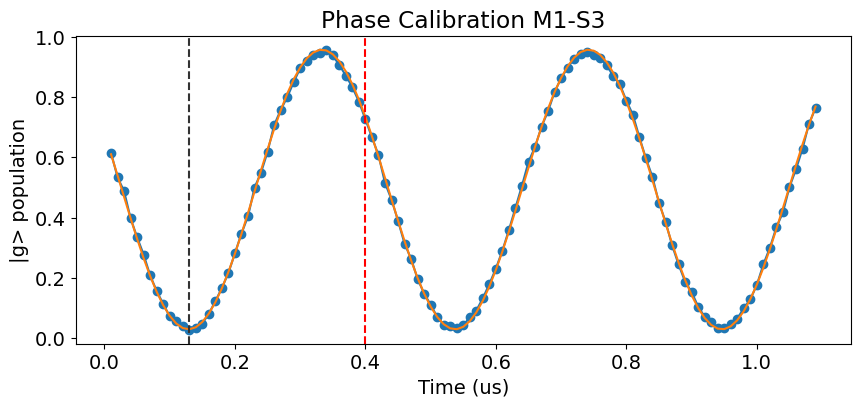

In [577]:
# file_list = np.arange(50,100)
# file_list = np.arange(249,322)
file_list = np.arange(322, 432)
# vary_pts = np.arange(0, 361,12)
vary_pts = np.arange(0.01, 1.5, 0.01)
y_list = []
active_reset = True
threshold =  -49.82055670476302 #-40.69974573466379
# name = '_single_shot_parity_time_sweep.h5'
name = '_single_shot_time_sweep.h5'

for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, vlines=[0.4], title='Phase Calibration M1-S3', xlabel='Time (us)')

#### M1-S3 cross phase due to M1-S2

[4.43381006e-01 2.77516531e-03 1.58143857e+02 4.89822582e-01]
Frequency from fit [MHz]: 0.0027751653102539636 +/- 4.897045121564182e-06
Pi length from avgi data: 111.96144129561287
	Pi/2 length from avgi data: 55.980720647806436


111.96144129561287

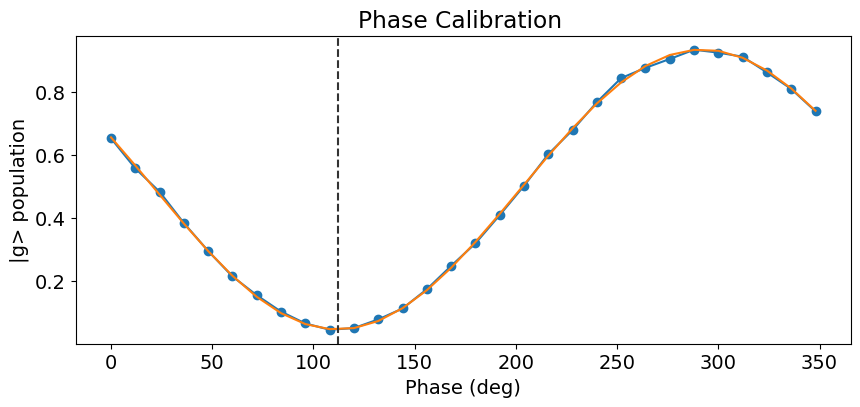

In [1100]:
file_list = np.arange(3118, 3149, 1)
vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -50, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')

In [1081]:
temp_data, attrs = prev_data(expt_path, '03118_single_shot_phase_sweep.h5')
attrs['config']['expt']

{'reps': 5000,
 'qubits': [0],
 'prepulse': True,
 'active_reset': True,
 'man_reset': True,
 'storage_reset': True,
 'pre_sweep_pulse': [['qubit', 'ge', 'hpi', 0],
  ['qubit', 'ef', 'pi', 0],
  ['man', 'M1', 'pi', 0],
  ['storage', 'M1-S3', 'pi', 0],
  ['qubit', 'ge', 'hpi', 0],
  ['qubit', 'ef', 'pi', 0],
  ['man', 'M1', 'pi', 0],
  ['storage', 'M1-S2', 'pi', 0],
  ['storage', 'M1-S3', 'pi', 180],
  ['man', 'M1', 'pi', 180],
  ['qubit', 'ef', 'pi', 180],
  ['qubit', 'ge', 'hpi', 0]],
 'gate_based': True,
 'preloaded_pulses': False,
 'use_arb_waveform': False}

In [1101]:
phase = cross_storage_phase_analysis(attrs, gate_length=2.0507346944012617, from_fitting=111.96144129561287, target_mode_no=3, add = False)
print(phase)

using values from attrs
-119.14088704433917 -2.446015004544113
-3.950764791626625


In [ ]:
file_list_cross_phase = np.

## Cross Phase Huge Matrix Calibration

### Create a datframe with all the file_lists (Don't run this every time)

In [881]:
import pandas as pd
import numpy as np

# Define the column names with empty lists
data = {
    'target_mode_no': [],
    'spectator_mode_no': [],
    'file_list': [],
    'spec_reps': [],
    'from_fit_phase': [],
    'gate_length': []
}

# Create the DataFrame
df = pd.DataFrame(data)

# Initialize variables and lists
start_file_no = 4136
skip_mode_no = 2
spectator_mode_no_list = [1, 2, 3, 4, 5, 6, 7]
target_mode_no_list = [1, 2, 3, 4, 5, 6, 7]
spec_reps_list = [2, 3]  # Example spec_reps_list 2 * n -1
from_fit_phase = 0  # Example from_fit_phase
curr_idx = 0
file_step_size = len(np.arange(0, 361, 12))

# Iterate over target_mode_no_list and spectator_mode_no_list
for targ_idx, target_mode_no in enumerate(target_mode_no_list):
    for spec_idx, spectator_mode_no in enumerate(spectator_mode_no_list):
        
        # Iterate over spec_reps_list
        for spec_reps_idx, spec_reps in enumerate(spec_reps_list):
            gate_length = get_spec_idling_time(spec_reps, spectator_mode_no, yaml_cfg)

            if (spectator_mode_no <= skip_mode_no) and (target_mode_no <= skip_mode_no):
                file_list = None
            else:
                file_list = np.arange(start_file_no + curr_idx * file_step_size, start_file_no + (curr_idx + 1) * file_step_size)
                curr_idx += 1

            # Create a new entry
            new_entry = {
                'target_mode_no': target_mode_no,
                'spectator_mode_no': spectator_mode_no,
                'file_list': file_list,
                'spec_reps': spec_reps, 
                'from_fit_phase': from_fit_phase,
                'gate_length': gate_length
            }

            # Use loc to add the new entry to the DataFrame
            df.loc[len(df)] = new_entry

# Print the DataFrame
# print(df)

### Access the dataframe for manual calibration

In [846]:
# Return the 5th row of the DataFrame
fifth_row = df.iloc[6]

# Print the 5th row
print(fifth_row)

target_mode_no                                                       1
spectator_mode_no                                                    4
file_list            [3229, 3230, 3231, 3232, 3233, 3234, 3235, 323...
spec_reps                                                            2
from_fit_phase                                                       0
gate_length                                                   6.241357
Name: 6, dtype: object


In [1218]:
target_mode_no = 2
spectator_mode_no = 5
spec_reps = 2

# Find the row with the specified values
filtered_row = df[(df['target_mode_no'] == target_mode_no) & 
                  (df['spectator_mode_no'] == spectator_mode_no) & 
                  (df['spec_reps'] == spec_reps)]

# Print the filtered row
print(filtered_row)

    target_mode_no  spectator_mode_no  \
22               2                  5   

                                            file_list  spec_reps  \
22  [4570, 4571, 4572, 4573, 4574, 4575, 4576, 457...          2   

    from_fit_phase  gate_length  
22       -0.540462     8.235929  


In [1219]:
temp_data, attrs = prev_data(expt_path, '04384_single_shot_phase_sweep.h5')
attrs['config']['expt']

{'reps': 5000,
 'qubits': [0],
 'prepulse': True,
 'active_reset': True,
 'man_reset': True,
 'storage_reset': True,
 'pre_sweep_pulse': [['qubit', 'ge', 'hpi', 0],
  ['qubit', 'ef', 'pi', 0],
  ['man', 'M1', 'pi', 0],
  ['storage', 'M1-S1', 'pi', 0],
  ['qubit', 'ge', 'hpi', 0],
  ['qubit', 'ef', 'pi', 0],
  ['man', 'M1', 'pi', 0],
  ['storage', 'M1-S7', 'pi', 0],
  ['storage', 'M1-S7', 'pi', 180],
  ['man', 'M1', 'pi', 180],
  ['qubit', 'ef', 'pi', 180],
  ['qubit', 'ef', 'pi', 0],
  ['man', 'M1', 'pi', 0],
  ['storage', 'M1-S7', 'pi', 0],
  ['storage', 'M1-S1', 'pi', 180],
  ['man', 'M1', 'pi', 180],
  ['qubit', 'ef', 'pi', 180],
  ['qubit', 'ge', 'hpi', 0]],
 'gate_based': True,
 'preloaded_pulses': False,
 'use_arb_waveform': False}

[ 4.52672991e-01  2.77404612e-03 -3.50344870e+01  4.90454385e-01]
Frequency from fit [MHz]: 0.002774046123305313 +/- 5.657896345461344e-06
Pi length from avgi data: 305.20268368641837
phase at max: 120
Pi length from avgi data: 305.20268368641837
	Pi/2 length from avgi data: 152.60134184320918
305.20268368641837


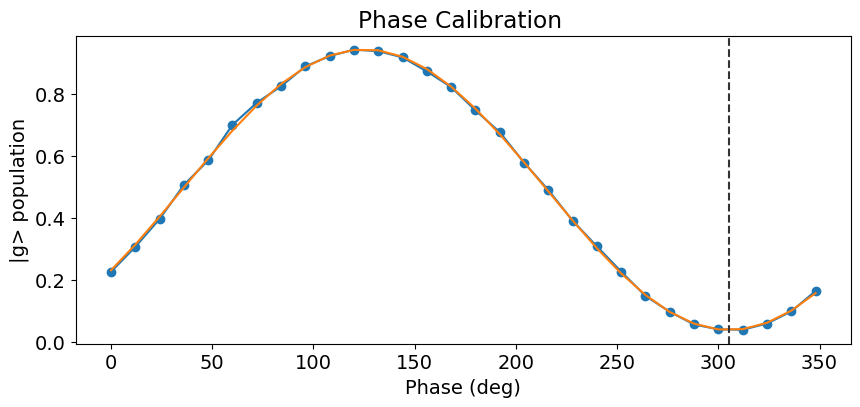

In [1220]:
file_list = filtered_row['file_list'].values[0]
vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -20, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
pi_length = phase_calibration(xpts_ns, y_list, fitparams=None, min_pi= True, title='Phase Calibration ')
print(pi_length)


In [1197]:
# phase = (360 - (pi_length))/2 * -1
# phase

In [1222]:
from_fitting = pi_length #+180 
phase = cross_storage_phase_analysis(attrs, gate_length=filtered_row['gate_length'].values[0], 
                                     from_fitting=from_fitting ,
                                       target_mode_no=int(filtered_row['target_mode_no']),
                                         add = False, cfg = yaml_cfg)
phase = phase/(2 * filtered_row['spec_reps'].values[0] -1)
print(phase)

using values from cfg
-116.04343089 -2.85371864950844
-0.5404615250135976


In [1097]:
2 * filtered_row['spec_reps'].values[0] -1

5

In [1062]:
# Update the from_fit_phase column in the filtered row
# phase = -22.470830128218353 #37.39689648277965 #154.12227295862465

df.loc[(df['target_mode_no'] == target_mode_no) & 
       (df['spectator_mode_no'] == spectator_mode_no) & 
       (df['spec_reps'] == spec_reps), 'from_fit_phase'] = phase

### Manual Calibration for certain cross phases

Target: 1 , Spec: 5

In [16]:
temp_data, attrs = prev_data(expt_path_old, '07019_single_shot_phase_sweep.h5')
attrs['config']['expt']

{'reps': 5000,
 'qubits': [0],
 'prepulse': True,
 'active_reset': True,
 'man_reset': True,
 'storage_reset': True,
 'pre_sweep_pulse': [['qubit', 'ge', 'hpi', 0],
  ['qubit', 'ef', 'pi', 0],
  ['man', 'M1', 'pi', 0],
  ['storage', 'M1-S1', 'pi', 0],
  ['qubit', 'ge', 'hpi', 0],
  ['qubit', 'ef', 'pi', 0],
  ['man', 'M1', 'pi', 0],
  ['storage', 'M1-S5', 'pi', 0],
  ['storage', 'M1-S1', 'pi', 180],
  ['man', 'M1', 'pi', 180],
  ['qubit', 'ef', 'pi', 180],
  ['qubit', 'ge', 'hpi', 0]],
 'gate_based': True,
 'preloaded_pulses': False,
 'use_arb_waveform': False}

[4.38438701e-01 2.76546523e-03 1.52404714e+02 4.88272354e-01]
Frequency from fit [MHz]: 0.002765465234843672 +/- 4.9431276978280875e-06
Pi length from avgi data: 118.11884927381938
phase at max: 300
Pi length from avgi data: 118.11884927381938
	Pi/2 length from avgi data: 59.05942463690969
118.11884927381938


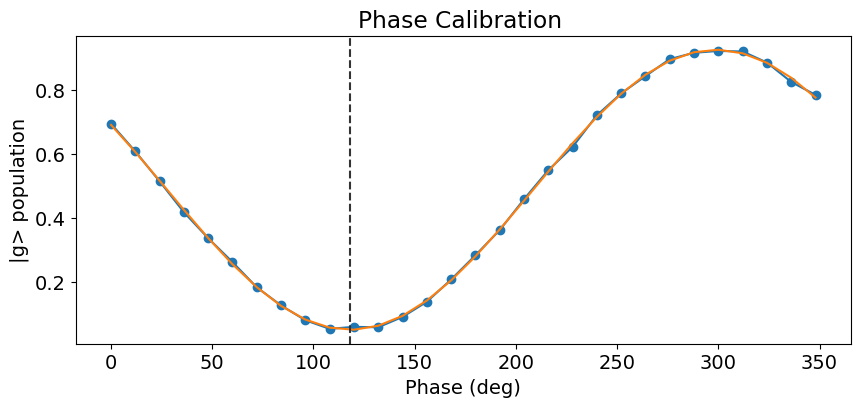

In [1250]:

file_list = np.arange(7019, 7050, 1) # 0.28423595876483887
# file_list = np.arange(7050, 7081, 1) # 2.2090821736489183

vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -20, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
pi_length = phase_calibration(xpts_ns, y_list, fitparams=None, min_pi= True, title='Phase Calibration ')
print(pi_length)



In [1251]:
from_fitting = pi_length #+180 
phase = cross_storage_phase_analysis(attrs, gate_length= get_spec_idling_time(1, 5, yaml_cfg), #filtered_row['gate_length'].values[0], 
                                     from_fitting=from_fitting ,
                                       target_mode_no=1,
                                         add = True, cfg = yaml_cfg)
phase = phase/(1)
print(phase)


using values from cfg
-52.66961233 -2.5937677197135596
0.28423595876483887


In [ ]:
phase

-90.34878087129891

Target: 1 , Spec: 6

[4.51281755e-01 2.77304843e-03 5.59819420e+01 4.86022625e-01]
Frequency from fit [MHz]: 0.0027730484265966675 +/- 6.067177435892278e-06
Pi length from avgi data: 214.3830593863025
phase at max: 36
Pi length from avgi data: 214.3830593863025
	Pi/2 length from avgi data: 107.19152969315125
214.3830593863025


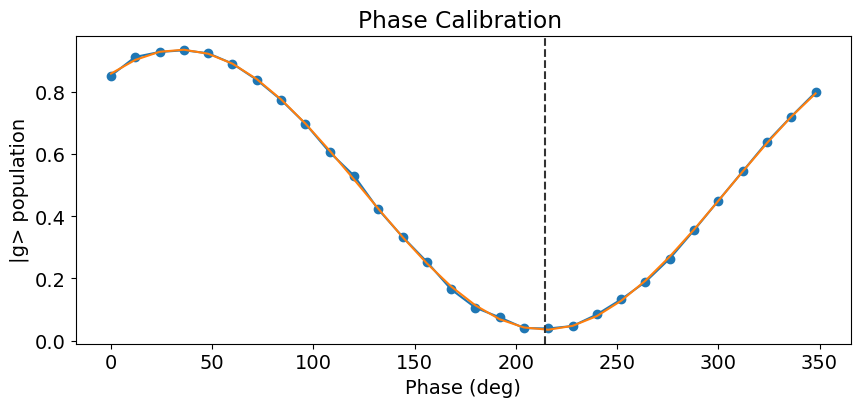

In [1248]:
file_list = np.arange(7081, 7112, 1) # 131.15854816947694
# file_list = np.arange(7112, 7143, 1) # 11.065831427726758

vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -20, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
pi_length = phase_calibration(xpts_ns, y_list, fitparams=None, min_pi= True, title='Phase Calibration ')
print(pi_length)



In [1249]:
from_fitting = pi_length - 360  #+180 
spec_reps = 1
phase = cross_storage_phase_analysis(attrs, gate_length= get_spec_idling_time(spec_reps, 6, yaml_cfg), #filtered_row['gate_length'].values[0], 
                                     from_fitting=from_fitting ,
                                       target_mode_no=1,
                                         add = True, cfg = yaml_cfg)
phase = phase/(2* spec_reps -1)
print(phase)


using values from cfg
-52.66961233 -2.5937677197135596
131.15854816947694


In [1212]:
# Possible phase: 131.15854816947694

Target: 1 , Spec: 7

[4.45050609e-01 2.78051481e-03 8.08052855e+01 4.88066024e-01]
Frequency from fit [MHz]: 0.0027805148141045507 +/- 1.1453777224549497e-05
Pi length from avgi data: 189.00847820578036
phase at max: 12
Pi length from avgi data: 189.00847820578036
	Pi/2 length from avgi data: 94.50423910289018
189.00847820578036


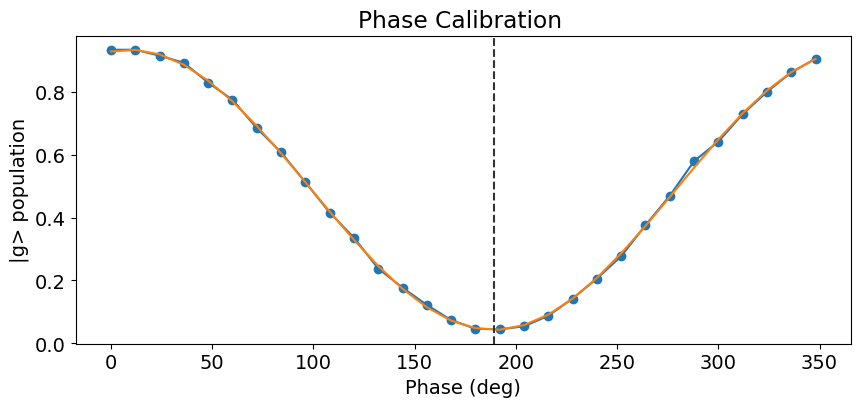

In [1184]:
# file_list = np.arange(2808, 2839) # without correcting bare S1 overhead
file_list = np.arange(6926, 6957, 1)
# file_list = np.arange(6957, 6988, 1)
# file_list = np.arange(2932, 2962, 1)
vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -20, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
pi_length = phase_calibration(xpts_ns, y_list, fitparams=None, min_pi= True, title='Phase Calibration ')
print(pi_length)



In [1185]:
from_fitting = pi_length #+180 
phase = cross_storage_phase_analysis(attrs, gate_length= get_spec_idling_time(1, 7, yaml_cfg), #filtered_row['gate_length'].values[0], 
                                     from_fitting=from_fitting ,
                                       target_mode_no=1,
                                         add = False, cfg = yaml_cfg)
phase = phase/(1)
print(phase)


using values from cfg
-52.66961233 -2.5937677197135596
-90.34878087129891


In [1187]:
phase

-90.34878087129891

Target: 2 , Spec: 5

[ 4.45263945e-01  2.77370170e-03 -3.05379460e+01  4.86745997e-01]
Frequency from fit [MHz]: 0.0027737016967132166 +/- 5.713890803811229e-06
Pi length from avgi data: 300.71508204605993
phase at max: 120
Pi length from avgi data: 300.71508204605993
	Pi/2 length from avgi data: 150.35754102302997
300.71508204605993


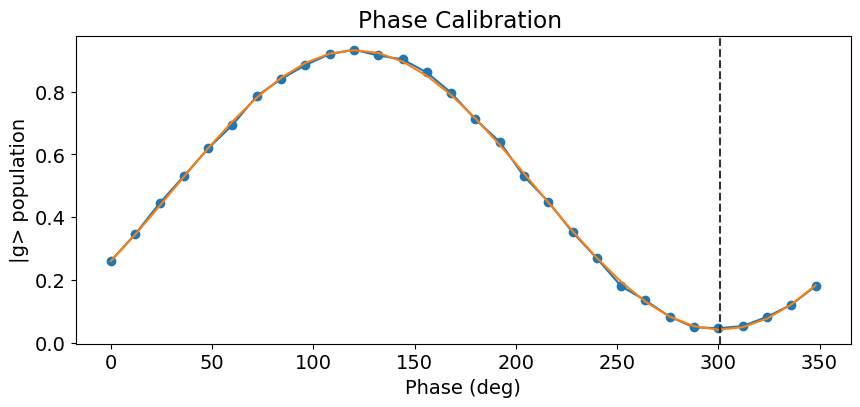

In [1216]:
file_list = np.arange(7205, 7236) # without correcting bare S1 overhead : -3.67
file_list = np.arange(7236, 7267)# -2.036
vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -20, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
pi_length = phase_calibration(xpts_ns, y_list, fitparams=None, min_pi= True, title='Phase Calibration ')
print(pi_length)



In [1217]:
from_fitting = pi_length #-360  #+180 
phase = cross_storage_phase_analysis(attrs, gate_length= get_spec_idling_time(2, 5, yaml_cfg), #filtered_row['gate_length'].values[0], 
                                     from_fitting=from_fitting ,
                                       target_mode_no=2,
                                         add = False, cfg = yaml_cfg)
phase = phase/(3)
print(phase)


using values from cfg
-116.04343089 -2.85371864950844
-2.036328738466788


Target: 2 , Spec: 6

In [ ]:
generate_mode_combinations([1, 2, 3, 4, 5, 6, 7], 2)

[4.36791617e-01 2.76979926e-03 1.76002697e+02 4.87925567e-01]
Frequency from fit [MHz]: 0.0027697992632203165 +/- 5.133546499051086e-06
Pi length from avgi data: 94.2680658503226
phase at max: 276
Pi length from avgi data: 94.2680658503226
	Pi/2 length from avgi data: 47.1340329251613
94.2680658503226


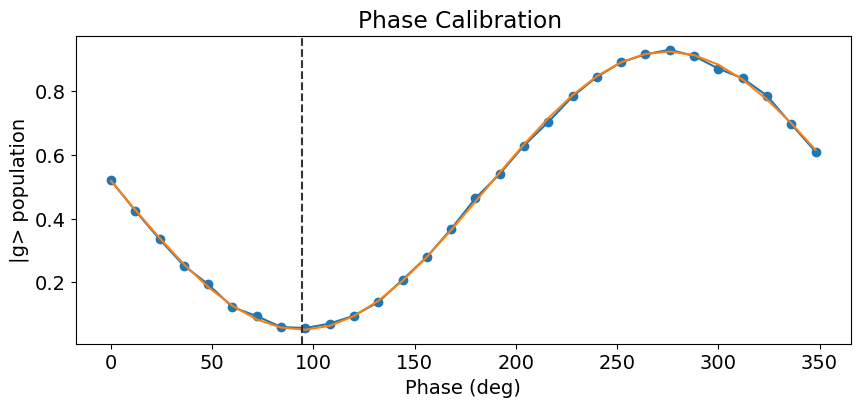

In [1229]:

# file_list = np.arange(7019, 7050, 1)
file_list = np.arange(7267,7298, 1) # 9.45
# file_list = np.arange(7298, 7329, 1) # 9.45 DON't CHANGE

vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -20, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
pi_length = phase_calibration(xpts_ns, y_list, fitparams=None, min_pi= True, title='Phase Calibration ')
print(pi_length)



In [1230]:
from_fitting = pi_length #+180 
phase = cross_storage_phase_analysis(attrs, gate_length= get_spec_idling_time(1, 6, yaml_cfg), #filtered_row['gate_length'].values[0], 
                                     from_fitting=from_fitting ,
                                       target_mode_no=2,
                                         add = True, cfg = yaml_cfg)
phase = phase/(1)
print(phase)


using values from cfg
-116.04343089 -2.85371864950844
11.450906156625024


Target: 2 , Spec: 7

[4.19283634e-01 2.78280579e-03 1.07072051e+02 4.82372854e-01]
Frequency from fit [MHz]: 0.002782805790261503 +/- 1.1822094087772598e-05
Pi length from avgi data: 162.63356840916813
phase at max: 348
Pi length from avgi data: 162.63356840916813
	Pi/2 length from avgi data: 81.31678420458407
162.63356840916813


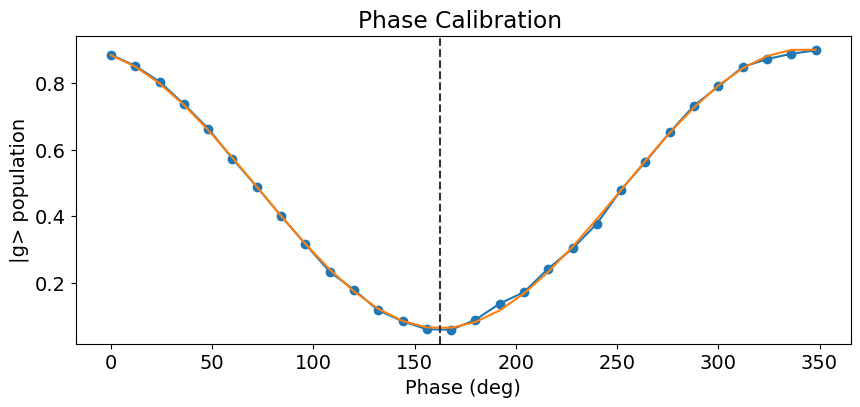

In [1237]:

file_list = np.arange(7329, 7360, 1) # 95.59156092221656
file_list = np.arange(7360, 7391, 1) # -21.853854823571055

vary_pts = np.arange(0, 361,12)

y_list = filter_data_single_shot(prev_data, file_list, threshold = -20, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
xpts_ns = vary_pts[:len(y_list)]
pi_length = phase_calibration(xpts_ns, y_list, fitparams=None, min_pi= True, title='Phase Calibration ')
print(pi_length)



In [1240]:
from_fitting = pi_length #-360 #+180 
phase = cross_storage_phase_analysis(attrs, gate_length= get_spec_idling_time(2, 7, yaml_cfg), #filtered_row['gate_length'].values[0], 
                                     from_fitting=from_fitting ,
                                       target_mode_no=2,
                                         add = False, cfg = yaml_cfg)
phase = phase/(3)
print(phase)


using values from cfg
-116.04343089 -2.85371864950844
-21.853854823571055


### Automatic Calibration analysis

-----------------------------------
1 3 2
[4.45759737e-01 2.78358629e-03 2.57438770e+02 4.92224731e-01]
Frequency from fit [MHz]: 0.002783586290737312 +/- 1.134801930523742e-05
Pi length from avgi data: 372.1594123884177
phase at max: 192
Pi length from avgi data: 372.1594123884177
	Pi/2 length from avgi data: 186.07970619420885
using values from cfg
-52.66961233 -2.5937677197135596
using values from cfg
-52.66961233 -2.5937677197135596
-----------------------------------
1 3 3
[4.33571909e-01 2.76582015e-03 2.08028683e+02 4.89200022e-01]
Frequency from fit [MHz]: 0.0027658201503217516 +/- 5.41733597301071e-06
Pi length from avgi data: 423.01744498956737
phase at max: 240
Pi length from avgi data: 423.01744498956737
	Pi/2 length from avgi data: 211.50872249478368
using values from cfg
-52.66961233 -2.5937677197135596
using values from cfg
-52.66961233 -2.5937677197135596
-----------------------------------
1 4 2
[4.45739817e-01 2.76362438e-03 7.53847746e+01 4.95653059e-01]
Frequency fr

h:\Shared drives\SLab\Multimode\experiment\240911\fit_display.py:1293: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 4))


[4.25124772e-01 2.78807966e-03 1.21901419e+02 4.78573469e-01]
Frequency from fit [MHz]: 0.0027880796569899795 +/- 6.914208195608859e-06
Pi length from avgi data: 147.55136084914218
phase at max: 324
Pi length from avgi data: 147.55136084914218
	Pi/2 length from avgi data: 73.77568042457109
using values from cfg
-117.78381369 -2.446015004544113
using values from cfg
-117.78381369 -2.446015004544113
-----------------------------------
3 2 2
[ 4.24127529e-01  2.76894436e-03 -8.99143283e+01  4.88181323e-01]
Frequency from fit [MHz]: 0.0027689443620835977 +/- 1.5055000610661875e-05
Pi length from avgi data: 360.4882863664018
phase at max: 180
Pi length from avgi data: 360.4882863664018
	Pi/2 length from avgi data: 180.2441431832009
using values from cfg
-117.78381369 -2.446015004544113
using values from cfg
-117.78381369 -2.446015004544113
-----------------------------------
3 2 3
[4.18575382e-01 2.79034156e-03 2.38965432e+01 4.90708393e-01]
Frequency from fit [MHz]: 0.0027903415551029723 +

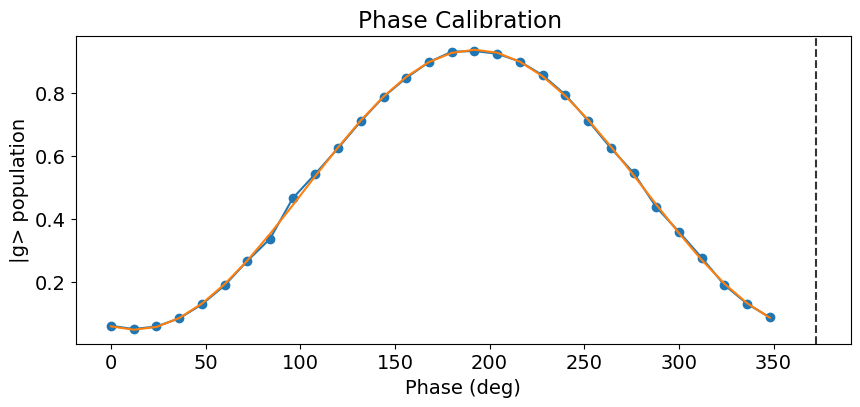

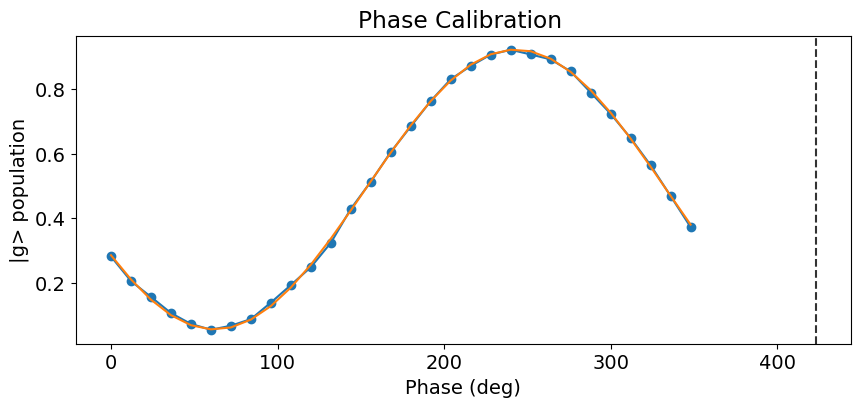

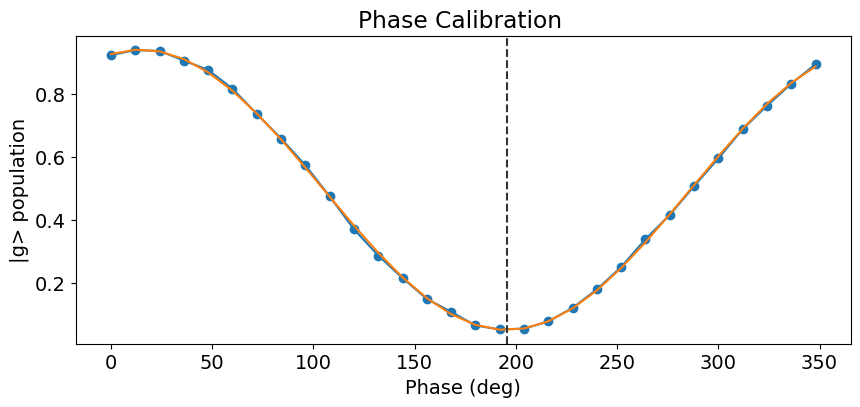

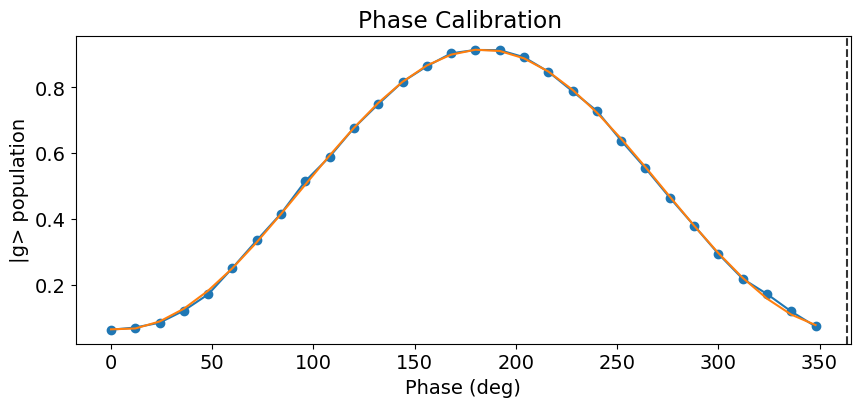

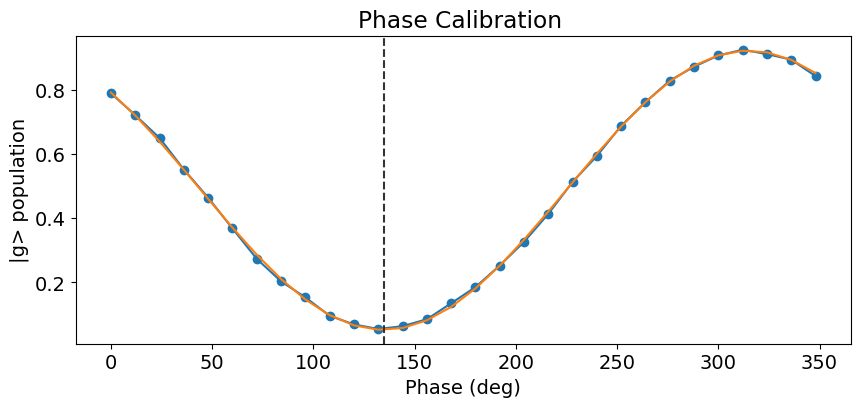

...

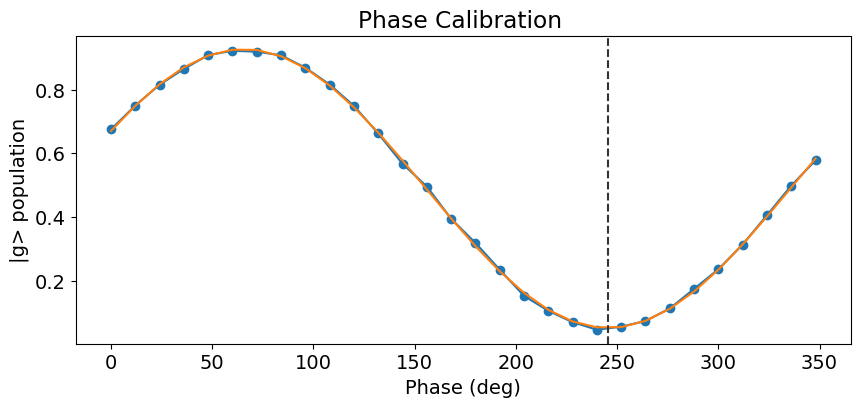

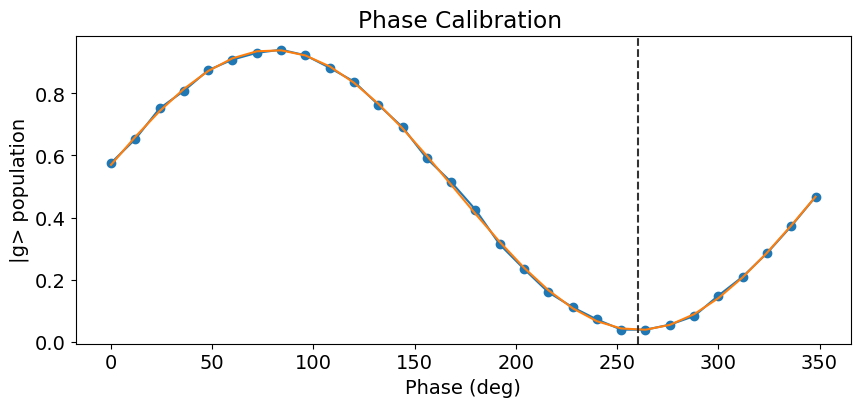

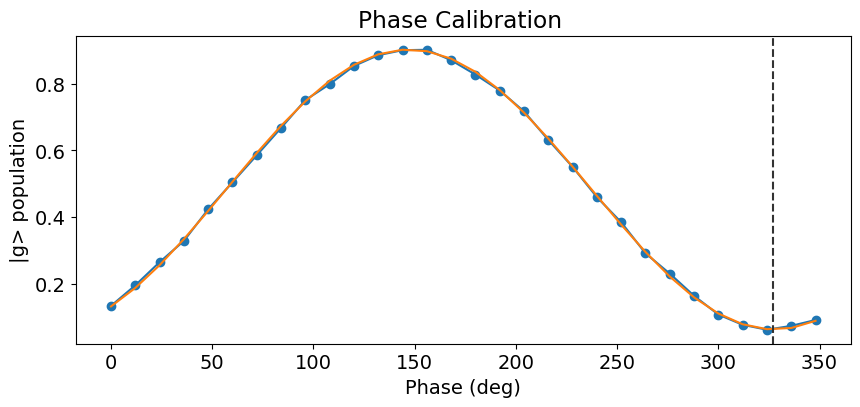

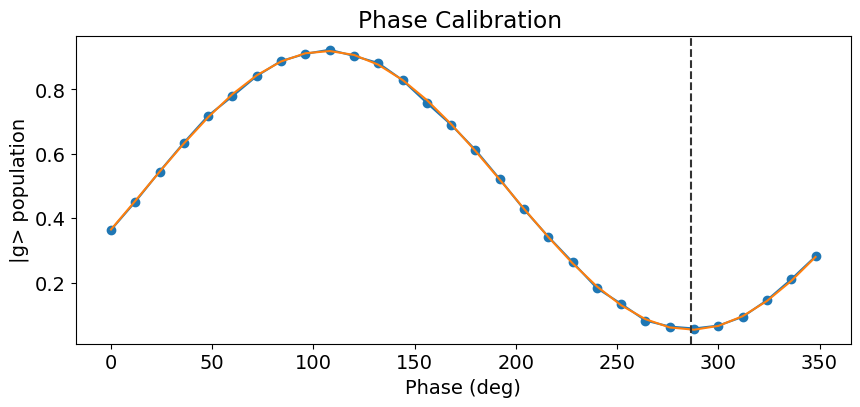

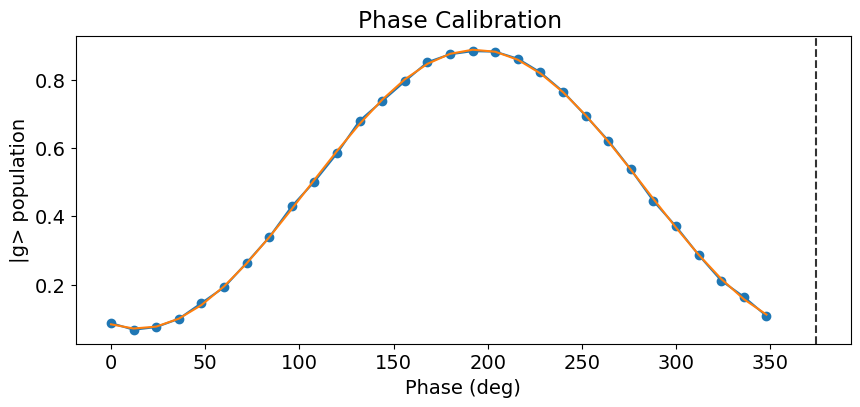

In [1104]:
target_mode_no_list = [1, 2, 3, 4, 5, 6, 7]
spectator_mode_no_list = [1, 2, 3, 4, 5, 6, 7]
spec_reps_list = [2, 3]  # Example spec_reps_list 2 * n -1
skip_mode_no = 2
for target_mode_no in target_mode_no_list: 
    for spectator_mode_no in spectator_mode_no_list: 
        for spec_reps in spec_reps_list:
            if (spectator_mode_no <= skip_mode_no) and (target_mode_no <= skip_mode_no):
                continue  
            if (spectator_mode_no == target_mode_no): # don't do diagonals
                continue

            print('-----------------------------------')
            print(target_mode_no, spectator_mode_no, spec_reps)
            

            # Find the row with the specified values
            filtered_row = df[(df['target_mode_no'] == target_mode_no) & 
                            (df['spectator_mode_no'] == spectator_mode_no) & 
                            (df['spec_reps'] == spec_reps)]
            
            # plot curve 
            file_list = filtered_row['file_list'].values[0]
            vary_pts = np.arange(0, 361,12)

            y_list = filter_data_single_shot(prev_data, file_list, threshold = -20, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
            xpts_ns = vary_pts[:len(y_list)]
            pi_length = phase_calibration(xpts_ns, y_list, fitparams=None, min_pi= True, title='Phase Calibration ')
            # print(pi_length)

            #compute cross phase 
            from_fitting = pi_length #+180 


            phase_add = cross_storage_phase_analysis(attrs, gate_length=filtered_row['gate_length'].values[0], 
                                                from_fitting=from_fitting ,
                                                target_mode_no=int(filtered_row['target_mode_no']),
                                                    add = True, cfg = yaml_cfg)
            phase_add = phase_add/(2 * filtered_row['spec_reps'].values[0] -1)

            phase_sub = cross_storage_phase_analysis(attrs, gate_length=filtered_row['gate_length'].values[0],
                                                from_fitting=from_fitting ,
                                                target_mode_no=int(filtered_row['target_mode_no']),
                                                    add = False, cfg = yaml_cfg)
            phase_sub = phase_sub/(2 * filtered_row['spec_reps'].values[0] -1)

            # choose the smaller magnitude phase 
            phase = phase_add 
            if abs(phase_sub) < abs(phase_add):
                phase = phase_sub
            # print(phase)

            # Update the from_fit_phase column in the filtered row
            # phase = -22.470830128218353 #37.39689648277965 #154.12227295862465
            df.loc[(df['target_mode_no'] == target_mode_no) & 
                (df['spectator_mode_no'] == spectator_mode_no) & 
                (df['spec_reps'] == spec_reps), 'from_fit_phase'] = phase
        

    

# Print the filtered row
print(filtered_row)

### Save the dataframe 

In [1105]:
# Assuming df is already defined and populated
file_name = path + '\cross_phase_overhead_rbam.csv'

# Save the DataFrame to a CSV file
df.to_csv( file_name, index=False)

print(f"DataFrame saved to {file_name}")


DataFrame saved to h:\Shared drives\SLab\Multimode\experiment\240911\cross_phase_overhead_rbam.csv


### Convert Dataframe to cross kerr matrix 

In [1295]:
import seaborn as sns
def plot_matrix(matrix, spec_reps): 
    # Define custom vmin and vmax values
    vmin = -10
    vmax = 10

    # Create the heatmap
    plt.figure(figsize=(10, 8))
    heatmap = sns.heatmap(matrix, annot=True, fmt=".2f", cmap="viridis", cbar=True, vmin=vmin, vmax=vmax)

    # Set labels and title
    plt.ylabel('Target')
    plt.xlabel('Spectator')
    plt.title('Cross Storage phase overhead avg over ' + str(2*spec_reps - 1) + ' spec swaps')

    # Label the colorbar in degrees
    cbar = heatmap.collections[0].colorbar
    cbar.set_label('Phase (degrees)')

    # Display the heatmap
    plt.show()

In [1291]:
spec_reps = 3

In [1296]:
cross_phase_overhead_mat = np.array([[ -52.66961233,  -22.70880241,    4.32404839,    1.74059096,
           3.07928552,   59.85703473,   54.36912959],
       [  -0.8543699 , -116.04343089,    3.45837055,    0.60833143,
          71.41077545,   13.2268045 ,   26.30150103],
       [   1.58323636,   68.79359697, -117.78381369,    0.8998216 ,
          70.08763425,    1.19079717,   13.38298573],
       [  12.01849273,    6.13296858,   13.64895529, -154.12227296,
           8.74817796,    9.16706928,   15.39540481],
       [  40.35827656,   35.74293536,   41.12454107,   43.21269654,
         -91.16735495,   36.8393591 ,   41.18727708],
       [   5.73517386,   61.21832925,   54.14562672,   58.07691773,
          11.75793664,  -37.39689648,    8.81220005],
       [  42.43615566,   38.51757589,   50.98282847,   49.11893869,
          65.42337545,    2.81445754,  -22.47083013]])
target_mode_no_list = [1, 2, 3, 4, 5, 6, 7]
spectator_mode_no_list = [1, 2, 3, 4, 5, 6, 7]
for target_mode_no in target_mode_no_list:
    for spectator_mode_no in spectator_mode_no_list:
        if target_mode_no <= 2 and spectator_mode_no <= 2:
            continue #cross_phase_overhead_mat[target_mode_no-1][spectator_mode_no-1] = 0
        if target_mode_no == spectator_mode_no:
            continue 
        else:
            filtered_row = df[(df['target_mode_no'] == target_mode_no) & 
                  (df['spectator_mode_no'] == spectator_mode_no) & 
                  (df['spec_reps'] == spec_reps)]
            cross_phase_overhead_mat[target_mode_no-1][spectator_mode_no-1] = filtered_row['from_fit_phase'].values[0]
cross_phase_overhead_mat

array([[-5.26696123e+01, -2.27088024e+01,  4.32404839e+00,
         1.74059096e+00,  3.07928552e+00, -1.21429653e+01,
        -1.76308704e+01],
       [-8.54369900e-01, -1.16043431e+02,  3.45837055e+00,
         6.08331428e-01, -5.89224554e-01,  1.32268045e+01,
         2.63015010e+01],
       [ 1.04040701e+00, -3.74923237e+00, -1.17783814e+02,
         3.56992259e-01, -2.45519509e+00,  6.47967825e-01,
         1.28401564e+01],
       [ 1.66740192e+00, -4.21812224e+00,  3.29786448e+00,
        -1.54122273e+02, -1.60291285e+00, -1.18402153e+00,
         5.04431400e+00],
       [ 4.82521854e+00,  2.09877344e-01,  5.59148305e+00,
         7.67963852e+00, -9.11673550e+01,  1.30630108e+00,
         5.65421906e+00],
       [ 3.70780701e+00,  7.68208841e-02,  4.16044796e+00,
         2.61829414e+00,  3.48690085e+00, -3.73968965e+01,
         4.05643677e+00],
       [ 3.84028579e+00, -4.18792628e-01,  4.05223790e+00,
         3.24634888e+00,  2.06016015e+00,  3.24251258e+00,
        -2.2470830

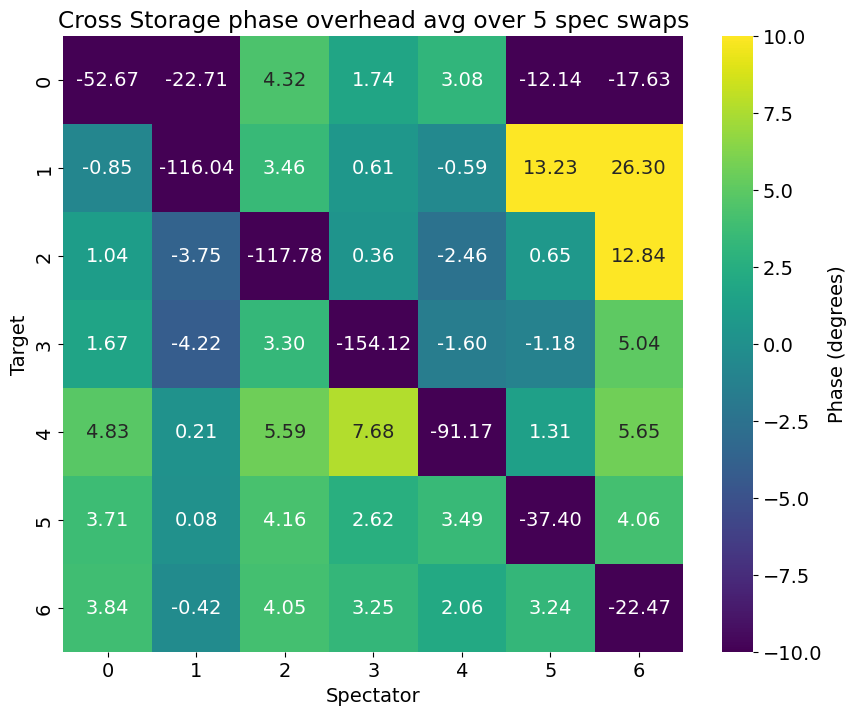

In [1297]:
plot_matrix(cross_phase_overhead_mat, spec_reps)

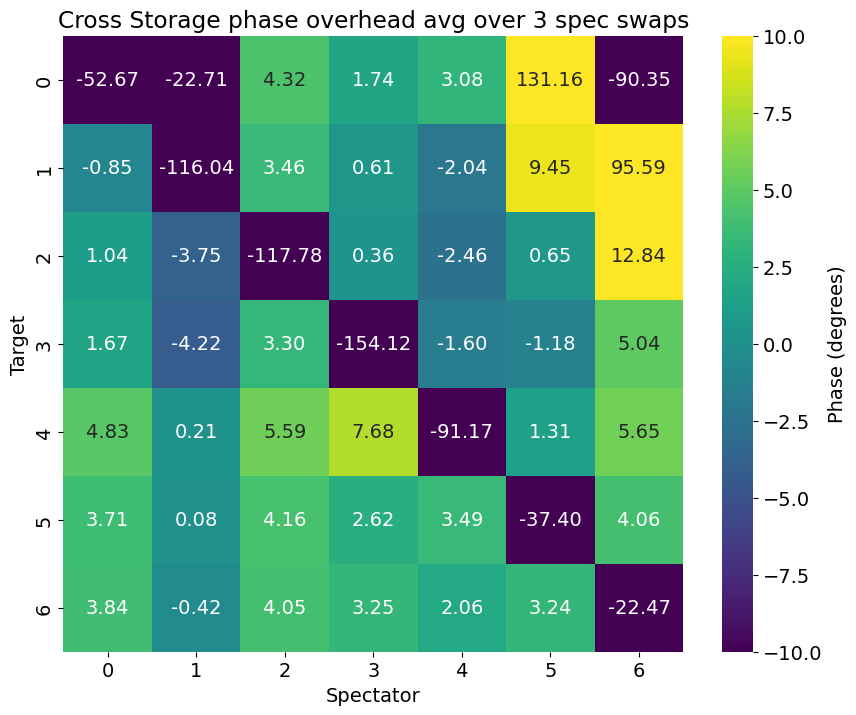

In [1298]:
matrix = [[-5.26696123e+01, -2.27088024e+01,  4.32404839e+00,
                     1.74059096e+00,  3.07928552e+00, 131.15854816947694, -90.34878087129891],
                    [-8.54369900e-01, -1.16043431e+02,  3.45837055e+00,
         6.08331428e-01, -2.036,  9.45,
         95.59156092221656],
                    [ 1.04040701e+00, -3.74923237e+00, -1.17783814e+02,
         3.56992259e-01, -2.45519509e+00,  6.47967825e-01,
         1.28401564e+01],
                    [ 1.66740192e+00, -4.21812224e+00,  3.29786448e+00,
            -1.54122273e+02, -1.60291285e+00, -1.18402153e+00,
         5.04431400e+00],
                    [ 4.82521854e+00,  2.09877344e-01,  5.59148305e+00,
         7.67963852e+00, -9.11673550e+01,  1.30630108e+00,
         5.65421906e+00],
                    [ 3.70780701e+00,  7.68208841e-02,  4.16044796e+00,
         2.61829414e+00,  3.48690085e+00, -3.73968965e+01,
         4.05643677e+00],
                    [ 3.84028579e+00, -4.18792628e-01,  4.05223790e+00,
         3.24634888e+00,  2.06016015e+00,  3.24251258e+00,
            -2.24708301e+01]]
plot_matrix(matrix, 2)

#### with 3swaps 

In [1120]:
spec_reps = 2

In [1121]:
cross_phase_overhead_mat = yaml_cfg.device.storage.idling_phase
target_mode_no_list = [1, 2, 3, 4, 5, 6, 7]
spectator_mode_no_list = [1, 2, 3, 4, 5, 6, 7]
for target_mode_no in target_mode_no_list:
    for spectator_mode_no in spectator_mode_no_list:
        if target_mode_no <= 2 and spectator_mode_no <= 2:
            continue #cross_phase_overhead_mat[target_mode_no-1][spectator_mode_no-1] = 0
        if target_mode_no == spectator_mode_no:
            continue 
        else:
            filtered_row = df[(df['target_mode_no'] == target_mode_no) & 
                  (df['spectator_mode_no'] == spectator_mode_no) & 
                  (df['spec_reps'] == spec_reps)]
            cross_phase_overhead_mat[target_mode_no-1][spectator_mode_no-1] = filtered_row['from_fit_phase'].values[0]
cross_phase_overhead_mat

[[-52.66961233,
  -22.70880241,
  4.494054391458424,
  2.9527021446386548,
  3.4338485795775946,
  12.4809044876262,
  30.707148347843333],
 [-0.8543699,
  -116.04343089,
  3.224262938021942,
  1.4271376784069314,
  -0.5404615250135976,
  13.811883439236226,
  -20.599787778663085],
 [0.7460722843206895,
  -3.5652157573725467,
  -117.78381369,
  0.14599998113711385,
  -2.3142551508217366,
  0.547314858044956,
  13.319399080518451],
 [1.740114503316363,
  -3.9581401922347745,
  3.841156835860602,
  -154.12227296,
  -1.6485667212979631,
  -0.5820038642629394,
  5.164004650134909],
 [4.450639434969768,
  0.5162275417681789,
  5.217410691007899,
  7.403294725976896,
  -91.16735495,
  1.3012879560731865,
  5.948765365541779],
 [4.155576123211176,
  0.0672412010659779,
  4.409450983718671,
  2.700612583847942,
  3.4172022610879744,
  -37.39689648,
  4.243662272946797],
 [3.624570159495003,
  -0.21474179526406564,
  3.9589323352781016,
  4.37445601828919,
  2.579060520933126,
  3.0096227977758

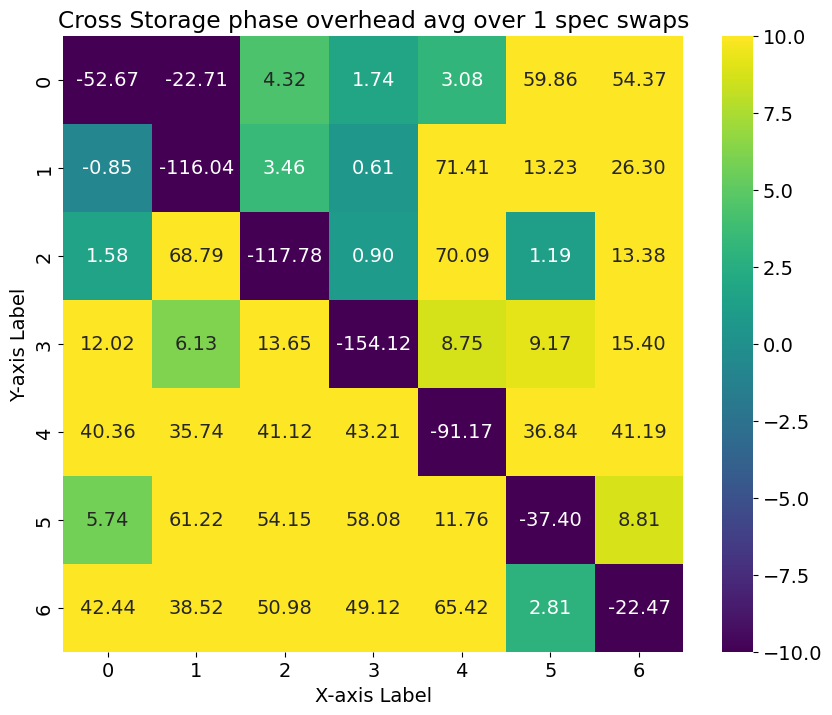

In [1288]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Create or load the matrix data
matrix = cross_phase_overhead_mat#np.random.rand(10, 10)  # Example matrix data

# Define custom vmin and vmax values
vmin = -10#80
vmax = 10 #100#80

# Create the heatmap
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(matrix, annot=True, fmt=".2f", cmap="viridis", cbar=True, vmin=vmin, vmax=vmax)

# Set labels and title
plt.xlabel('X-axis Label')
plt.ylabel('Y-axis Label')
plt.title('Cross Storage phase overhead avg over ' + str(2*spec_reps -1) + ' spec swaps')

# Display the heatmap
plt.show()

In [893]:
# # file_list = np.arange(2808, 2839) # without correcting bare S1 overhead
# file_list = np.arange(4105, 4136, 1)
# # file_list = np.arange(2932, 2962, 1)
# vary_pts = np.arange(0, 361,12)

# y_list = filter_data_single_shot(prev_data, file_list, threshold = -22, active_reset = True, expt_path = expt_path, name = '_single_shot_phase_sweep.h5')
# xpts_ns = vary_pts[:len(y_list)]
# phase_calibration(xpts_ns, y_list, fitparams=None, title='Phase Calibration ')



In [894]:
# spectator_mode_no = 5
# phase = cross_storage_phase_analysis(attrs, gate_length= 13.62654892379208, from_fitting=146.43604369136528,
#                                       target_mode_no=1, add = True)
# print(phase/5)


In [895]:
# 2*filtered_row['spec_reps'].values[0] -1

In [ ]:
df

In [757]:
import json
import os
path = os.getcwd()
print("path: ", path)

path:  h:\Shared drives\SLab\Multimode\experiment\240911


checking connection: True


### M1-S4 phase

#### M1-S4 phase frequency

In [18]:
temp_data, attrs = prev_data(expt_path_old, '00435_single_shot_phase_sweep.h5')
attrs['config']['expt']

{'reps': 5000,
 'qubits': [0],
 'prepulse': True,
 'active_reset': False,
 'man_reset': False,
 'pre_sweep_pulse': [[3568.1751638611518,
   3425.5537944060666,
   2006.72,
   2006.72,
   3425.5537944060666,
   3568.1751638611518],
  [4930, 7575, 15000, 15000, 7575, 4930],
  [0, 0, 0.6015035177548363, 0.6015035177548363, 0, 0],
  [0, 0, 0, 360, 180, 180],
  [2, 2, 5, 5, 2, 2],
  ['gaussian', 'gaussian', 'flat_top', 'flat_top', 'gaussian', 'gaussian'],
  [0.035, 0.035, 0.005, 0.005, 0.035, 0.035]]}

[   0.46042197    1.83932502 -133.27170171    0.49401681]
Frequency from fit [MHz]: 1.8393250164457633 +/- 0.0009579973106337685
Pi length from avgi data: 0.3371884609124905
	Pi/2 length from avgi data: 0.16859423045624525


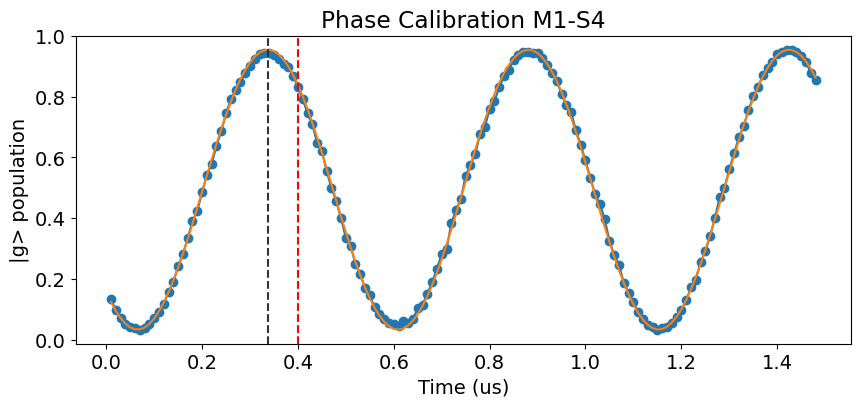

In [731]:
# file_list = np.arange(50,100)
# file_list = np.arange(249,322)
file_list = np.arange(435, 584)
# vary_pts = np.arange(0, 361,12)
vary_pts = np.arange(0.01, 1.5, 0.01)
y_list = []
active_reset = True
threshold =  -49.82055670476302 #-40.69974573466379
# name = '_single_shot_parity_time_sweep.h5'
name = '_single_shot_time_sweep.h5'

for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, vlines=[0.4], title='Phase Calibration M1-S4', xlabel='Time (us)')

### M1-S5 phase

#### M1-S5 phase frequency

[  0.45900323   3.23102583 109.1134805    0.49733911]
Frequency from fit [MHz]: 3.231025833205897 +/- 0.0008930298511913887
Pi length from avgi data: 0.13831737091648233
	Pi/2 length from avgi data: 0.06915868545824116


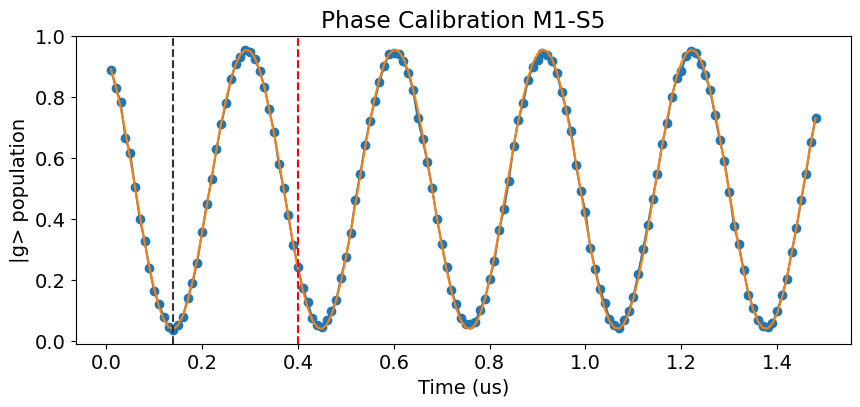

In [732]:
# file_list = np.arange(50,100)
# file_list = np.arange(249,322)
file_list = np.arange(584, 733)
# vary_pts = np.arange(0, 361,12)
vary_pts = np.arange(0.01, 1.5, 0.01)
y_list = []
active_reset = True
threshold =  -49.82055670476302 #-40.69974573466379
# name = '_single_shot_parity_time_sweep.h5'
name = '_single_shot_time_sweep.h5'

for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, vlines=[0.4], title='Phase Calibration M1-S5', xlabel='Time (us)')

### M1-S6 phase

#### M1-S6 phase frequency

[ 0.45863375  3.2053137  -2.95400351  0.50508615]
Frequency from fit [MHz]: 3.2053137013077597 +/- 0.0015135567729454825
Pi length from avgi data: 0.08055547424411467
	Pi/2 length from avgi data: 0.04027773712205734


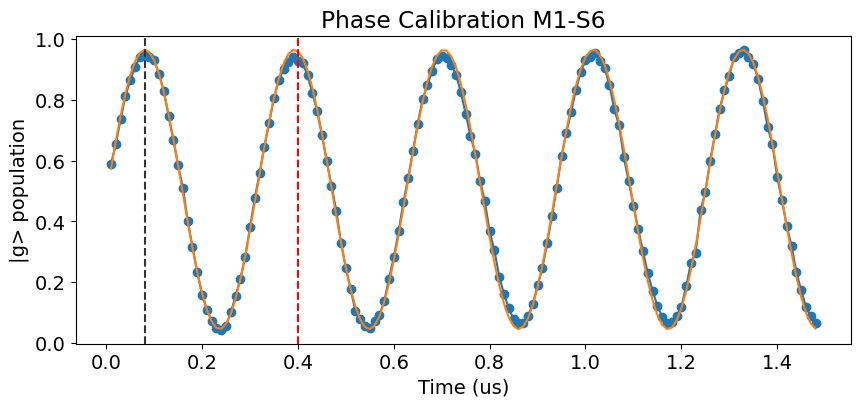

In [733]:
# file_list = np.arange(50,100)
# file_list = np.arange(249,322)
file_list = np.arange(733, 882)
# vary_pts = np.arange(0, 361,12)
vary_pts = np.arange(0.01, 1.5, 0.01)
y_list = []
active_reset = True
threshold =  -49.82055670476302 #-40.69974573466379
# name = '_single_shot_parity_time_sweep.h5'
name = '_single_shot_time_sweep.h5'

for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, vlines=[0.4], title='Phase Calibration M1-S6', xlabel='Time (us)')

### M1-S7 phase

#### M1-S7 phase frequency

[  0.45958315   2.93508779 326.04249439   0.49547099]
Frequency from fit [MHz]: 2.935087792327744 +/- 0.0011305405741392949
Pi length from avgi data: 0.11731383482396095
	Pi/2 length from avgi data: 0.05865691741198047


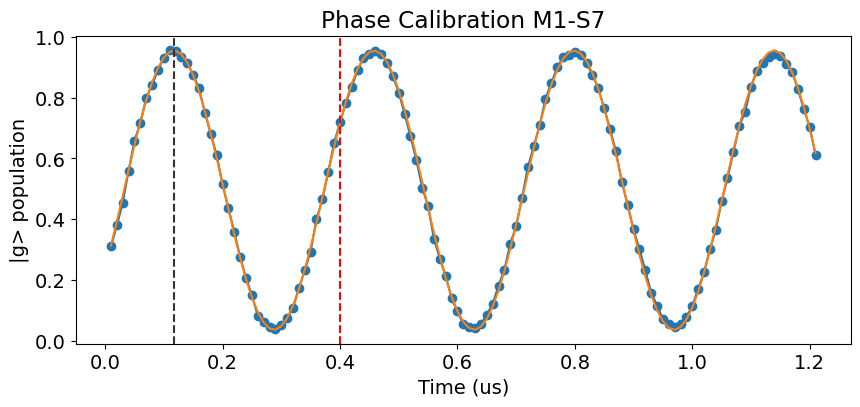

In [734]:
# file_list = np.arange(50,100)
# file_list = np.arange(249,322)
file_list = np.arange(882, 1004)
# vary_pts = np.arange(0, 361,12)
vary_pts = np.arange(0.01, 1.5, 0.01)
y_list = []
active_reset = True
threshold =  -49.82055670476302 #-40.69974573466379
# name = '_single_shot_parity_time_sweep.h5'
name = '_single_shot_time_sweep.h5'

for file_no in file_list:
    count = 0   # how many points possibly |f>
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef

    # active reset:
    if active_reset:
        Ig, Qg = filter_data_IQ(temp_data['I'], temp_data['Q'],threshold, readout_per_experiment=4)
        total_counts = len(Ig)
        # Ig = I_selected
    else:

        Ig = temp_data['I']
        Qg = temp_data['Q']
        total_counts = len(Ig)
    for i in range(len(Ig)):
        if Ig[i] < threshold :
            count += 1

    y_list.append(count/total_counts)
xpts_ns = vary_pts[:len(y_list)]
phase_calibration(xpts_ns, y_list, fitparams=None, vlines=[0.4], title='Phase Calibration M1-S7', xlabel='Time (us)')

# RB Calibration 

## Reference f0g1

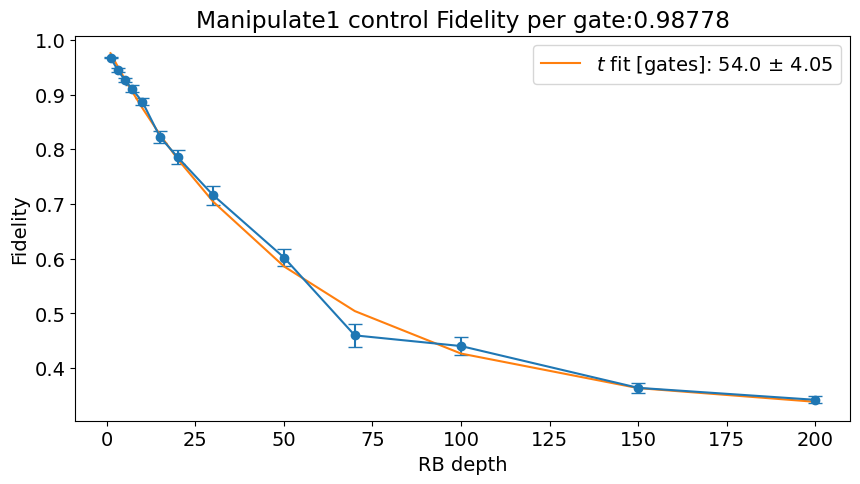

In [213]:
# prepulse_list_labels = ['ge subspace', 'gf subspace', 'man1 subspace']
file_list = np.arange(74,87,1)
# file_list = np.arange(51,64,1)
name = '_SingleRB_sweep_depth.h5'

plt.figure(figsize=(10,5))
plt.subplot(111,  ylabel="Fidelity")

#for idx, prepulse_label in enumerate(prepulse_list_labels):

fids_list = []
xlist = []
ebars_list = []
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  
    avg_readout = RB_extract(temp_data, conf=False)
    fids_list.append(np.average(avg_readout))
    ebars_list.append(np.std(avg_readout)/np.sqrt(len(avg_readout)))
    xlist.append(attrs['config']['expt']['rb_depth'])
plt.errorbar(xlist, fids_list, yerr= ebars_list,fmt = '-o', capsize=5)

# fitting 
xpts = xlist
ypts = fids_list
fit,err = fitter.fitexp(xpts, ypts, fitparams=None)

p = fit #data['fit_avgi']
pCov = err #data['fit_err_avgi']
captionStr = f'$t$ fit [gates]: {p[3]:.3} $\pm$ {np.sqrt(pCov[3][3]):.3}'
plt.plot(xpts, fitter.expfunc(xpts, *fit), label=captionStr)

alpha = np.exp(-1/fit[3])
r = 1-alpha-(1-alpha)/3
fidelity = 1-r

#plt.show()
plt.xlabel('RB depth')
plt.ylabel('Fidelity')
plt.title(f'Manipulate1 control Fidelity per gate:{fidelity:.5f}')
plt.legend()
plt.show()

## S1 RB 

In [117]:


temp_data, attrs = prev_data(expt_path, '00001_MultiRBAM.h5')
avg_readout = []
mode_idx = 0 
for i in range(len(temp_data['Idata'][mode_idx])):
    counting = 0
    for j in temp_data['Idata'][mode_idx][i][0]:
        if j<temp_data['thresholds']:
            counting += 1
    avg_readout.append(counting/len(temp_data['Idata'][mode_idx][i][0]))
#
# avg_readout = RB_extract(temp_data)
mean = np.average(avg_readout)
err = np.std(avg_readout)/np.sqrt(len(avg_readout))
print(mean, err)

0.98145 0.0008873415351486717


### With Active Reset

In [422]:
temp_data, attrs = prev_data(expt_path, '00120_MultiRBAM.h5')
# temp_data, attrs = prev_data(expt_path, '00017_MultiRBAM_sweep_depth.h5')

avg_readout = []
mode_idx = 0
for i in range(len(temp_data['Idata'][mode_idx])):
    counting = 0
    
    raw_data, _= filter_data_BS(temp_data['Idata'][mode_idx][i][2], temp_data['Idata'][mode_idx][i][3], None, temp_data['thresholds'])
    # print(len(raw_data))
    
    
    for j in raw_data:
        if j<temp_data['thresholds']:
            counting += 1
    avg_readout.append(counting/len(raw_data))
#
# avg_readout = RB_extract(temp_data)
mean = np.average(avg_readout)
err = np.std(avg_readout)/np.sqrt(len(avg_readout))
print(mean, err)

0.7173026118789168 0.01165354666635663


### Plot against reference

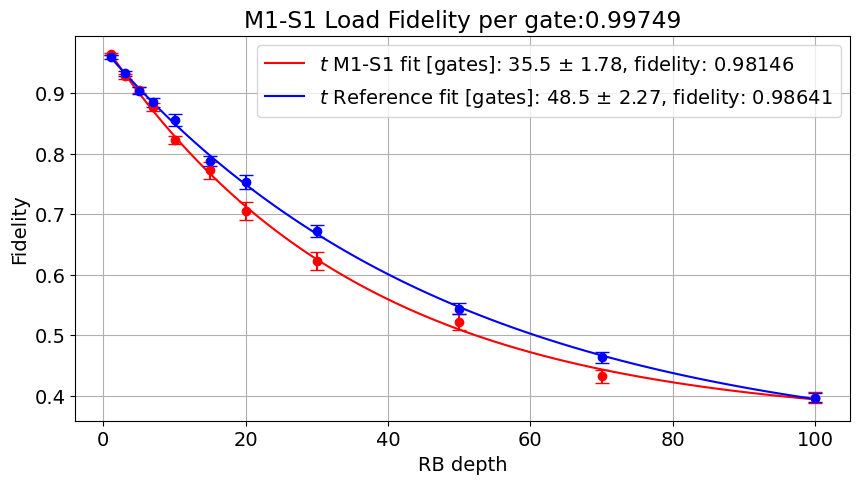

In [403]:

xx = np.linspace(1,100,100)
# file_list = np.arange(0,11,1)
file_list = np.arange(11,22,1)
name = '_MultiRBAM_sweep_depth.h5'

plt.figure(figsize=(10,5))
plt.subplot(111,  ylabel="Fidelity")

#for idx, prepulse_label in enumerate(prepulse_list_labels):

fids_list = []
xlist = []
ebars_list = []
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  
    
    avg_readout = RBAM_extract(temp_data)
    fids_list.append(np.average(avg_readout))
    ebars_list.append(np.std(avg_readout)/np.sqrt(len(avg_readout)))
    xlist.append(attrs['config']['expt']['depth_list'][0])
plt.errorbar(xlist, fids_list, yerr= ebars_list,fmt = 'o', capsize=5, color='r')

# fitting 
xpts = xlist
ypts = fids_list
fit,err = fitter.fitexp(xpts, ypts, fitparams=None)

alpha = np.exp(-1/fit[3])
r = 1-alpha-(1-alpha)/3
fidelity = 1-r

p = fit #data['fit_avgi']
pCov = err #data['fit_err_avgi']
captionStr = f'$t$ M1-S1 fit [gates]: {p[3]:.3} $\pm$ {np.sqrt(pCov[3][3]):.3}, fidelity: {fidelity:.5f}'
plt.plot(xx, fitter.expfunc(xx, *fit), label=captionStr, color='r')



#================================#

# file_list_reference = np.arange(51,64,1)
file_list_reference = np.arange(51,62,1)
name_reference = '_SingleRB_sweep_depth.h5'

fids_list_reference = []
xlist_reference = []
ebars_list_reference = []
for file_no in file_list_reference:
    full_name = str(file_no).zfill(5)+name_reference
    temp_data, attrs = prev_data(expt_path, full_name)  
    avg_readout_reference = RB_extract(temp_data, conf=False)
    fids_list_reference.append(np.average(avg_readout_reference))
    ebars_list_reference.append(np.std(avg_readout_reference)/np.sqrt(len(avg_readout_reference)))
    xlist_reference.append(attrs['config']['expt']['rb_depth'])


# fitting 
xpts_reference = xlist_reference
ypts_reference = fids_list_reference
fit_reference,err_reference = fitter.fitexp(xpts_reference, ypts_reference, fitparams=None)

alpha_reference = np.exp(-1/fit_reference[3])
r_reference = 1-alpha_reference-(1-alpha_reference)/3
fidelity_reference = 1-r_reference

p_reference = fit_reference #data['fit_avgi']
pCov_reference = err_reference #data['fit_err_avgi']
captionStr_reference = f'$t$ Reference fit [gates]: {p_reference[3]:.3} $\pm$ {np.sqrt(pCov_reference[3][3]):.3}, fidelity: {fidelity_reference:.5f}'


#================================#

plt.errorbar(xlist_reference, fids_list_reference, yerr= ebars_list_reference,fmt = 'o', capsize=5, color='b')
plt.plot(xx, fitter.expfunc(xx, *fit_reference), label=captionStr_reference, color='b')

M1_S1_fidelity = np.sqrt(fidelity/fidelity_reference)


plt.xlabel('RB depth')
plt.ylabel('Fidelity')
plt.title(f'M1-S1 Load Fidelity per gate:{M1_S1_fidelity:.5f}')
plt.legend()
plt.grid()
plt.show()

In [405]:
xlist

[1, 3, 5, 7, 10, 15, 20, 30, 50, 70, 100]

In [404]:
fids_list

[0.9641768667061534,
 0.9277817621656647,
 0.904657141651846,
 0.8764535493272931,
 0.8224815593890027,
 0.7726383912576879,
 0.7055716162391652,
 0.6223550034961364,
 0.522632052830857,
 0.43282043699381123,
 0.3972636805775792]

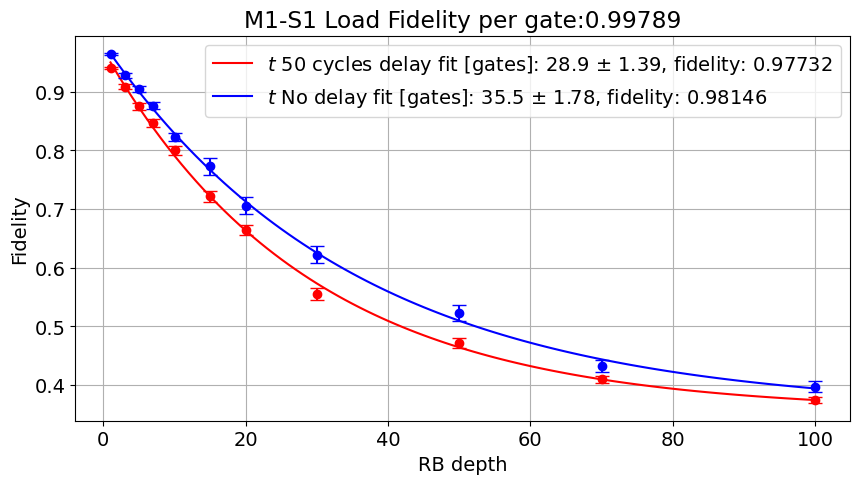

In [266]:

xx = np.linspace(1,100,100)
# file_list = np.arange(0,11,1)
file_list = np.arange(23,34,1)
name = '_MultiRBAM_sweep_depth.h5'

plt.figure(figsize=(10,5))
plt.subplot(111,  ylabel="Fidelity")

#for idx, prepulse_label in enumerate(prepulse_list_labels):

fids_list = []
xlist = []
ebars_list = []
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  
    
    avg_readout = RBAM_extract(temp_data)
    fids_list.append(np.average(avg_readout))
    ebars_list.append(np.std(avg_readout)/np.sqrt(len(avg_readout)))
    xlist.append(attrs['config']['expt']['depth_list'][0])
plt.errorbar(xlist, fids_list, yerr= ebars_list,fmt = 'o', capsize=5, color='r')

# fitting 
xpts = xlist
ypts = fids_list
fit,err = fitter.fitexp(xpts, ypts, fitparams=None)

alpha = np.exp(-1/fit[3])
r = 1-alpha-(1-alpha)/3
fidelity = 1-r

p = fit #data['fit_avgi']
pCov = err #data['fit_err_avgi']
captionStr = f'$t$ 50 cycles delay fit [gates]: {p[3]:.3} $\pm$ {np.sqrt(pCov[3][3]):.3}, fidelity: {fidelity:.5f}'
plt.plot(xx, fitter.expfunc(xx, *fit), label=captionStr, color='r')



#================================#

# file_list_reference = np.arange(51,64,1)
file_list_reference = np.arange(11,22,1)
name_reference = '_MultiRBAM_sweep_depth.h5'

fids_list_reference = []
xlist_reference = []
ebars_list_reference = []
for file_no in file_list_reference:
    full_name = str(file_no).zfill(5)+name_reference
    temp_data, attrs = prev_data(expt_path, full_name)  
    avg_readout_reference = RBAM_extract(temp_data)
    fids_list_reference.append(np.average(avg_readout_reference))
    ebars_list_reference.append(np.std(avg_readout_reference)/np.sqrt(len(avg_readout_reference)))
    xlist_reference.append(attrs['config']['expt']['depth_list'][0])


# fitting 
xpts_reference = xlist_reference
ypts_reference = fids_list_reference
fit_reference,err_reference = fitter.fitexp(xpts_reference, ypts_reference, fitparams=None)

alpha_reference = np.exp(-1/fit_reference[3])
r_reference = 1-alpha_reference-(1-alpha_reference)/3
fidelity_reference = 1-r_reference

p_reference = fit_reference #data['fit_avgi']
pCov_reference = err_reference #data['fit_err_avgi']
captionStr_reference = f'$t$ No delay fit [gates]: {p_reference[3]:.3} $\pm$ {np.sqrt(pCov_reference[3][3]):.3}, fidelity: {fidelity_reference:.5f}'


#================================#

plt.errorbar(xlist_reference, fids_list_reference, yerr= ebars_list_reference,fmt = 'o', capsize=5, color='b')
plt.plot(xx, fitter.expfunc(xx, *fit_reference), label=captionStr_reference, color='b')

M1_S1_fidelity = np.sqrt(fidelity/fidelity_reference)


plt.xlabel('RB depth')
plt.ylabel('Fidelity')
plt.title(f'M1-S1 Load Fidelity per gate:{M1_S1_fidelity:.5f}')
plt.legend()
plt.grid()
plt.show()

In [268]:
fids_list

[0.9403331976806937,
 0.908849254392531,
 0.8751177845092789,
 0.8469720212370483,
 0.8001851505472293,
 0.721627394406394,
 0.664710984206634,
 0.5554483494473048,
 0.471805419840369,
 0.40989273938665943,
 0.37463872497974443]

## S2 RB

### With Active Reset

In [430]:

temp_data, attrs = prev_data(expt_path, '00121_MultiRBAM.h5')
# temp_data, attrs = prev_data(expt_path, '00017_MultiRBAM_sweep_depth.h5')

avg_readout = []
mode_idx = 0
for i in range(len(temp_data['Idata'][mode_idx])):
    counting = 0
    
    raw_data, _= filter_data_BS(temp_data['Idata'][mode_idx][i][2], temp_data['Idata'][mode_idx][i][3], None, temp_data['thresholds'])
    # print(len(raw_data))
    
    
    for j in raw_data:
        if j<temp_data['thresholds']:
            counting += 1
    avg_readout.append(counting/len(raw_data))
#
# avg_readout = RB_extract(temp_data)
mean = np.average(avg_readout)
err = np.std(avg_readout)/np.sqrt(len(avg_readout))
print(mean, err)

0.7345797008174212 0.008206130724790978


In [512]:
def round_robin_pick(a):
    # Calculate the total number of elements
    total_elements = sum(len(lst) for lst in a)
    
    # Initialize indices for each list
    indices = [0] * len(a)
    
    # Output list
    b = []
    # List to track which sublist each element was picked from
    origins = []
    
    # Continue until all elements are picked
    pick_no = 0
    while len(b) < total_elements:
        # Find all sublists that have elements left to pick
        available = [i for i in range(len(a)) if indices[i] < len(a[i])]
        
        # Use round-robin approach to select the next list
        chosen_list = pick_no % len(a)
        
        # If the chosen list has elements left, pick the element
        if indices[chosen_list] < len(a[chosen_list]):
            # Pick the element from the chosen sublist and append to b
            b.append(a[chosen_list][indices[chosen_list]])
            # Record the origin of the picked element
            origins.append(chosen_list)
            # Update the index pointer for the chosen sublist
            indices[chosen_list] += 1
        
        pick_no += 1
    
    return b, origins

# Example usage
list1 = [1, 2, 3]
list2 = [4, 5]
list3 = [6, 7, 8, 9]
list4 = [10]
list5 = [11, 12, 13, 14, 15]
list6 = [16, 17]
list7 = [18, 19, 20]

lists = [list1, list2, list3, list4, list5, list6, list7]
result, origins = round_robin_pick(lists)

print("Picked elements:", result)
print("Origins:", origins)

Picked elements: [1, 4, 6, 10, 11, 16, 18, 2, 5, 7, 12, 17, 19, 3, 8, 13, 20, 9, 14, 15]
Origins: [0, 1, 2, 3, 4, 5, 6, 0, 1, 2, 4, 5, 6, 0, 2, 4, 6, 2, 4, 4]


C:\Users\26049\AppData\Local\Temp\ipykernel_11352\583243274.py:3: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  total_elements = sum(len(lst) for lst in a)


# Multimode RB 

## S1, S2

In [690]:
temp_data, attrs = prev_data(expt_path, '00122_MultiRBAM.h5')
# temp_data, attrs = prev_data(expt_path, '00017_MultiRBAM_sweep_depth.h5')








In [651]:
temp_data, attrs = prev_data(expt_path, '00131_MultiRBAM.h5')
mean_list, err_list = RBAM_extract(temp_data, mode_idxs = [0,1])
for mode_idx in [0,1]:
    print('Result for Mode ', mode_idx + 1, 'is', mean_list[mode_idx], err_list[mode_idx])

Result for Mode  1 is 0.7129018400980993 0.006243539852303561
Result for Mode  2 is 0.7191806077453495 0.0078297900833659


In [21]:
temp_data, attrs = prev_data(expt_path_old, '00072_MultiRBAM_sweep_depth.h5')
# RBAM_extract(temp_data, mode_idxs = [0,1])
attrs['config']['expt']

{'qubits': [0],
 'singleshot_reps': 10000,
 'span': 1000,
 'active_reset': True,
 'man_reset': True,
 'storage_reset': True,
 'rb_reps': 1000,
 'rounds': 1,
 'variations': 30,
 'IRB_gate_no': -1,
 'rb_active_reset': True,
 'rb_man_reset': True,
 'rb_storage_reset': True,
 'mode_list': [1, 2],
 'depth_list': [37, 37],
 'parity_meas': False,
 'preloaded_pulses': True,
 'use_arb_waveform': False,
 'rb_gate_list': ['5F1',
  '3F2',
  '5M1',
  '5M2',
  '1M1',
  '3M2',
  '1M1',
  '2M2',
  '2M1',
  '2M2',
  '2M1',
  '1M2',
  '6M1',
  '6M2',
  '4M1',
  '2M2',
  '2M1',
  '3M2',
  '2M1',
  '2M2',
  '1M1',
  '1M2',
  '3M1',
  '6M2',
  '5M1',
  '5M2',
  '2M1',
  '3M2',
  '6M1',
  '6M2',
  '2M1',
  '4M2',
  '4M1',
  '5M2',
  '2M1',
  '4M2',
  '6M1',
  '4M2',
  '4M1',
  '2M2',
  '6M1',
  '5M2',
  '5M1',
  '3M2',
  '1M1',
  '3M2',
  '3M1',
  '4M2',
  '4M1',
  '4M2',
  '6M1',
  '3M2',
  '4M1',
  '3M2',
  '2M1',
  '5M2',
  '4M1',
  '1M2',
  '1M1',
  '4M2',
  '1M1',
  '5M2',
  '4M1',
  '4M2',
  '4M1',
  

coherence limit reference:  0.9920936757214377
coherence limit M1-S1:  0.9963819985195834
coherence limit M1-S1 multiplexed:  0.9908982984189836
coherence limit M1-S2 multiplexed:  0.9954980480807758


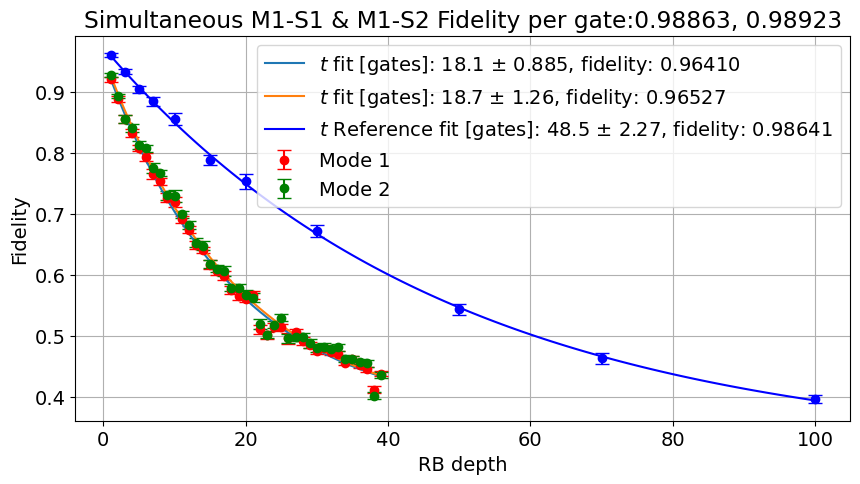

In [1300]:
xx = np.linspace(1,100,100)
file_list = np.arange(36,75,1)
# file_list = np.arange(145, 169, 1)
name = '_MultiRBAM_sweep_depth.h5'

plt.figure(figsize=(10,5))
plt.subplot(111,  ylabel="Fidelity")

#for idx, prepulse_label in enumerate(prepulse_list_labels):
mode_length = 2
fids_list = [[] for i in range(mode_length)]
xlist = []
ebars_list = [[] for i in range(mode_length)]
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  
    mean, err = RBAM_extract(temp_data, mode_idxs = [0,1])
    for i in range(mode_length):
        fids_list[i].append(mean[i])
        ebars_list[i].append(err[i])
    xlist.append(attrs['config']['expt']['depth_list'][0])
color_list = ['r','g']
for i in range(len(fids_list)):
    plt.errorbar(xlist, fids_list[i], yerr= ebars_list[i],fmt = 'o', capsize=5, label=f'Mode {i+1}', color=color_list[i])

# fitting 
xpts = xlist
fidelity_list = []
for i in range(len(fids_list)):
    ypts = fids_list[i]
    fit,err = fitter.fitexp(xpts, ypts, fitparams=None)

    p = fit #data['fit_avgi']
    pCov = err #data['fit_err_avgi']
    alpha = np.exp(-1/fit[3])
    r = 1-alpha-(1-alpha)/3
    fidelity = 1-r

    fidelity_list.append(fidelity)
    captionStr = f'$t$ fit [gates]: {p[3]:.3} $\pm$ {np.sqrt(pCov[3][3]):.3}, fidelity: {fidelity:.5f}'
    plt.plot(xpts, fitter.expfunc(xpts, *fit), label=captionStr)

    

#================================#

# file_list_reference = np.arange(51,64,1)
file_list_reference = np.arange(51,62,1)
name_reference = '_SingleRB_sweep_depth.h5'

fids_list_reference = []
xlist_reference = []
ebars_list_reference = []
for file_no in file_list_reference:
    full_name = str(file_no).zfill(5)+name_reference
    temp_data, attrs = prev_data(expt_path, full_name)  
    avg_readout_reference = RB_extract(temp_data, conf=False)
    fids_list_reference.append(np.average(avg_readout_reference))
    ebars_list_reference.append(np.std(avg_readout_reference)/np.sqrt(len(avg_readout_reference)))
    xlist_reference.append(attrs['config']['expt']['rb_depth'])


# fitting 
xpts_reference = xlist_reference
ypts_reference = fids_list_reference
fit_reference,err_reference = fitter.fitexp(xpts_reference, ypts_reference, fitparams=None)

alpha_reference = np.exp(-1/fit_reference[3])
r_reference = 1-alpha_reference-(1-alpha_reference)/3
fidelity_reference = 1-r_reference

p_reference = fit_reference #data['fit_avgi']
pCov_reference = err_reference #data['fit_err_avgi']
captionStr_reference = f'$t$ Reference fit [gates]: {p_reference[3]:.3} $\pm$ {np.sqrt(pCov_reference[3][3]):.3}, fidelity: {fidelity_reference:.5f}'


#================================#

plt.errorbar(xlist_reference, fids_list_reference, yerr= ebars_list_reference,fmt = 'o', capsize=5, color='b')
plt.plot(xx, fitter.expfunc(xx, *fit_reference), label=captionStr_reference, color='b')

M1_S1_fidelity = np.sqrt(fidelity_list[0]/fidelity_reference)
M1_S2_fidelity = np.sqrt(fidelity_list[1]/fidelity_reference)

#=======coherence limit========#
qm1 = 0.035*4+0.01+0.035*8+0.01*2+6*0.005*2+0.615287*2+0.01*2
ms1 = 0.005*6*2+0.919488*2+0.01*2
ms2 = 0.005*6*2+1.055448*2+0.01*2
# gate_length1 = 0.035*4+0.01+0.035*8+0.01*2+6*0.005*2+0.615287*2+0.01*2+0.005*6*2+0.919488*2+0.01*2
# gate_length2 = 0.035*4+0.01+0.035*8+0.01*2+6*0.005*2+0.615287*2+0.01*2+0.005*6*2+1.055448*2+0.01*2
# reference_gate = (0.035*4+0.01+0.035*8+0.01*2+6*0.005*2+0.615287*2+0.01*2)/2
# each_gate = (gate_length1+gate_length2)/2
T1q = 235  # f T1
T1M = 210
T1S1 = 358
T1S2 = 1254
coherence_limit1 = np.exp(-ms1/T1S1/2)*np.exp(-ms1/T1M/2)
coherence_limit1_waiting = coherence_limit1*np.exp(-(qm1+ms2)/T1S1)
coherence_limit2_waiting = np.exp(-ms2/T1S2/2)*np.exp(-ms2/T1M/2)*np.exp(-(qm1+ms1)/T1S2)
coherence_limit_reference = np.exp(-qm1/T1q/2)*np.exp(-qm1/T1M/2)
print('coherence limit reference: ',coherence_limit_reference)
print('coherence limit M1-S1: ',coherence_limit1**0.5)
print('coherence limit M1-S1 multiplexed: ',coherence_limit1_waiting**0.5)
print('coherence limit M1-S2 multiplexed: ',coherence_limit2_waiting**0.5)

# plt.plot(xx, [coherence_limit**i for i in xx], '--', label='Coherence limit', color='b')
# plt.plot(xx, [coherence_limit_reference**i for i in xx], '--', label='Reference limit', color='r')

#plt.show()
plt.xlabel('RB depth')
plt.ylabel('Fidelity')
plt.title(f'Simultaneous M1-S1 & M1-S2 Fidelity per gate:{M1_S1_fidelity:.5f}, {M1_S2_fidelity:.5f}')
plt.legend()
plt.grid()
plt.show()

In [ ]:
from experiments.MM_rb_base import *

def get_f0g1_time(spec_reps, spectator_mode_no, cfg): 
    '''computes total idling time for the spectator mode pulse sequence'''
    mm_base = MM_rb_base(cfg = cfg)

    # spector pulse 
    f0g1_str = [['qubit', 'ge', 'pi', 0], 
                ['man', 'M1', 'pi', 0],
                ]]
    spectator_pulse_str = mm_base.compound_storage_gate(input = True, storage_no = spectator_mode_no)
    for _ in range(spec_reps-1): 
        spectator_pulse_str += mm_base.compound_storage_gate(input = False, storage_no = spectator_mode_no) + mm_base.compound_storage_gate(input = True, storage_no = spectator_mode_no)

    qubit_spec_init_idling_time = mm_base.get_total_time(qubit_spec_init, gate_based = True)
    spec_idling_time = mm_base.get_total_time(spectator_pulse_str, gate_based = True)
    return spec_idling_time +  qubit_spec_init_idling_time

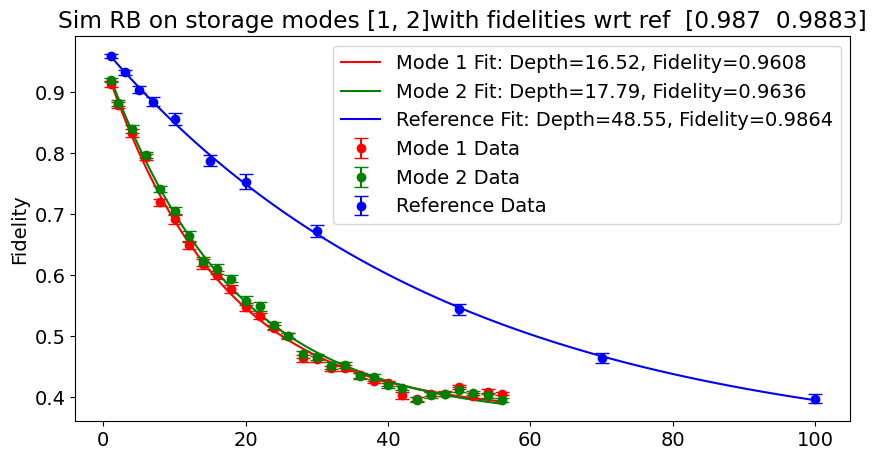

In [1349]:



# Example usage
file_list = np.arange(140, 169, 1)#np.arange(36, 75, 1)
name = '_MultiRBAM_sweep_depth.h5'
mode_list = [1,2]
mode_length = len(mode_list)
# expt_path = 'path_to_experiment_data'  # Replace with actual path

xlist, fids_list, ebars_list = compute_fidelity_list(file_list, name, mode_length, expt_path)
fidelity_list, fit_params_list = fit_fidelity(xlist, fids_list)

# Reference data
file_list_reference = np.arange(51, 62, 1)
name_reference = '_SingleRB_sweep_depth.h5'
xlist_ref, fids_list_ref, ebars_list_ref = compute_fidelity_list_RB(file_list_reference, name_reference, 1, expt_path)
fit_params_ref = fit_fidelity_reference(xlist_ref, fids_list_ref)
captionStr_ref = 'Reference'

# Plot both traces on the same plot
plot_fidelity(xlist, fids_list, ebars_list, fidelity_list, fit_params_list, xlist_ref, fids_list_ref, ebars_list_ref, fit_params_ref, captionStr_ref, mode_list)

In [1346]:
print(xlist)

[10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56]


In [1342]:
a = 48.55
1 - ((1 - np.exp(-1 / a)) - (1 - np.exp(-1 / a)) / 3)

0.9864089023755342

In [539]:
gate_length1 = 0.035*4+0.01+0.035*8+0.01*2+6*0.005*2+0.615287*2+0.01*2+0.005*6*2+0.919488*2+0.01*2
gate_length2 = 0.035*4+0.01+0.035*8+0.01*2+6*0.005*2+0.615287*2+0.01*2+0.005*6*2+1.055448*2+0.01*2
gate_length1+gate_length2

7.63102

## S1, S3

In [691]:
temp_data, attrs = prev_data(expt_path, '00139_MultiRBAM.h5')
mode_nos = [1,2,3]
measure_mode_nos = [1,2,3]
mean_ps_list, err_ps_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=True)# np.arange(len(mode_nos)))
mean_list, err_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=False)# np.arange(len(mode_nos)))
for mode_idx, mode_no in enumerate(measure_mode_nos):
    print('--------------------------------------------------')
    print('Raw Result for Mode ', mode_no, 'is', mean_list[mode_idx], err_list[mode_idx])
    print('Post Select Result for Mode ', mode_no, 'is', mean_ps_list[mode_idx], err_ps_list[mode_idx])

--------------------------------------------------
Raw Result for Mode  1 is 0.5432097066399664 0.007371439673786452
Post Select Result for Mode  1 is 0.6786216592483686 0.0067696908380035095
--------------------------------------------------
Raw Result for Mode  2 is 0.7196848935696566 0.004706316070322526
Post Select Result for Mode  2 is 0.9001720355886375 0.0019964289696242244
--------------------------------------------------
Raw Result for Mode  3 is 0.5312441120491757 0.006713899266898891
Post Select Result for Mode  3 is 0.662726144108324 0.007696911897143324


In [700]:
temp_data, attrs = prev_data(expt_path, '00139_MultiRBAM.h5')
mode_nos = [1,2,3]
measure_mode_nos = [1,2,3]
mean_ps_list, err_ps_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=True)# np.arange(len(mode_nos)))
mean_list, err_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=False)# np.arange(len(mode_nos)))
for mode_idx, mode_no in enumerate(measure_mode_nos):
    print('--------------------------------------------------')
    print('Raw Result for Mode ', mode_no, 'is', mean_list[mode_idx], err_list[mode_idx])
    print('Post Select Result for Mode ', mode_no, 'is', mean_ps_list[mode_idx], err_ps_list[mode_idx])

--------------------------------------------------
Raw Result for Mode  1 is 0.4552852528748778 0.0060745909799292805
Post Select Result for Mode  1 is 0.6183911542732072 0.006061995717640383
--------------------------------------------------
Raw Result for Mode  2 is 0.639433156576003 0.005045322588128788
Post Select Result for Mode  2 is 0.8791855349505896 0.0028863687271224996
--------------------------------------------------
Raw Result for Mode  3 is 0.43393304281854644 0.007220491869766644
Post Select Result for Mode  3 is 0.5896764604322035 0.007137878826293325


In [701]:
attrs['config']['expt']

{'qubits': [0],
 'singleshot_reps': 10000,
 'span': 1000,
 'active_reset': True,
 'man_reset': True,
 'storage_reset': True,
 'rb_reps': 1000,
 'rounds': 1,
 'variations': 30,
 'IRB_gate_no': -1,
 'rb_active_reset': True,
 'rb_man_reset': True,
 'rb_storage_reset': True,
 'rb_post_select': True,
 'postselection_delay': 2,
 'mode_list': [1, 3],
 'depth_list': [30, 30],
 'parity_meas': False,
 'preloaded_pulses': True,
 'use_arb_waveform': False,
 'measure_all_modes': True,
 'rb_gate_list': ['3F1',
  '4F3',
  '1M1',
  '3M3',
  '4M1',
  '1M3',
  '5M1',
  '3M3',
  '3M1',
  '4M3',
  '5M1',
  '4M3',
  '2M1',
  '3M3',
  '2M1',
  '2M3',
  '4M1',
  '4M3',
  '3M1',
  '5M3',
  '4M1',
  '3M3',
  '6M1',
  '1M3',
  '6M1',
  '5M3',
  '4M1',
  '3M3',
  '2M1',
  '1M3',
  '6M1',
  '2M3',
  '1M1',
  '5M3',
  '5M1',
  '4M3',
  '6M1',
  '5M3',
  '6M1',
  '3M3',
  '5M1',
  '4M3',
  '4M1',
  '5M3',
  '5M1',
  '4M3',
  '5M1',
  '5M3',
  '6M1',
  '1M3',
  '5M1',
  '4M3',
  '5M1',
  '4M3',
  '6M1',
  '4M3',
  '

In [703]:
#ref rb 
temp_data, attrs = prev_data(expt_path, '00142_MultiRBAM.h5')
mode_nos = [0,1,2,3]
measure_mode_nos = [0, 1,2,3]
mean_ps_list, err_ps_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=True)# np.arange(len(mode_nos)))
mean_list, err_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=False)# np.arange(len(mode_nos)))
for mode_idx, mode_no in enumerate(measure_mode_nos):
    print('--------------------------------------------------')
    print('Raw Result for Mode ', mode_no, 'is', mean_list[mode_idx], err_list[mode_idx])
    print('Post Select Result for Mode ', mode_no, 'is', mean_ps_list[mode_idx], err_ps_list[mode_idx])

--------------------------------------------------
Raw Result for Mode  0 is 0.4465346422150629 0.02149982472267848
Post Select Result for Mode  0 is 0.6509443701661759 0.016447072441792276
--------------------------------------------------
Raw Result for Mode  1 is 0.6416730185233223 0.0227627290066351
Post Select Result for Mode  1 is 0.940236941407025 0.0023824724657390923
--------------------------------------------------
Raw Result for Mode  2 is 0.646528636526325 0.022041043104058366
Post Select Result for Mode  2 is 0.9379043316203179 0.0031120589140423635
--------------------------------------------------
Raw Result for Mode  3 is 0.6387985717080756 0.022989567955889946
Post Select Result for Mode  3 is 0.9324399299329927 0.0024636811687409397


In [708]:
temp_data, attrs = prev_data(expt_path, '00145_MultiRBAM.h5')
mode_nos = [0,1,2,3]
measure_mode_nos = [0, 1,2,3]
mean_ps_list, err_ps_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=True)# np.arange(len(mode_nos)))
mean_list, err_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=False)# np.arange(len(mode_nos)))
for mode_idx, mode_no in enumerate(measure_mode_nos):
    print('--------------------------------------------------')
    print('Raw Result for Mode ', mode_no, 'is', mean_list[mode_idx], err_list[mode_idx])
    print('Post Select Result for Mode ', mode_no, 'is', mean_ps_list[mode_idx], err_ps_list[mode_idx])

--------------------------------------------------
Raw Result for Mode  0 is 0.7810422826685209 0.018393439916044876
Post Select Result for Mode  0 is 0.960256350254061 0.002103758841337416
--------------------------------------------------
Raw Result for Mode  1 is 0.7788352751357583 0.018241888990435724
Post Select Result for Mode  1 is 0.9620629182805515 0.0017320001533150944
--------------------------------------------------
Raw Result for Mode  2 is 0.7809281775749602 0.016139565799364645
Post Select Result for Mode  2 is 0.960690395026672 0.0017306256864969799
--------------------------------------------------
Raw Result for Mode  3 is 0.7748807753684087 0.018620335173899227
Post Select Result for Mode  3 is 0.9613384270805706 0.0016246108514422991


In [694]:
omega = 1/ 0.035 / 4
delta = 0.280 
rabi_drive_strength = omega**2 / (omega**2 + delta**2)
print('rabi_drive_strength: ', rabi_drive_strength)

rabi_drive_strength:  0.9984657176396462


In [664]:
temp_data, attrs = prev_data(expt_path, '00135_MultiRBAM.h5')
mode_nos = [1,3]
measure_mode_nos = [i+1 for i in range(7)]
mean_list, err_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)))# np.arange(len(mode_nos)))
for mode_idx, mode_no in enumerate(measure_mode_nos):
    print('Result for Mode ', mode_no, 'is', mean_list[mode_idx], err_list[mode_idx])

Result for Mode  1 is 0.5442637981169592 0.006190950232559013
Result for Mode  2 is 0.7213149591888749 0.005987144650295895
Result for Mode  3 is 0.52823650185195 0.0062760631202142024
Result for Mode  4 is 0.7180854612937139 0.005107652080576046
Result for Mode  5 is 0.7085005556382036 0.005131254367634914
Result for Mode  6 is 0.7132820689464843 0.005487805604536981
Result for Mode  7 is 0.7242554342225092 0.00496717298055875


In [663]:
temp_data, attrs = prev_data(expt_path, '00134_MultiRBAM.h5')
mode_nos = [1,3]
measure_mode_nos = [i+1 for i in range(7)]
mean_list, err_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)))# np.arange(len(mode_nos)))
for mode_idx, mode_no in enumerate(measure_mode_nos):
    print('Result for Mode ', mode_no, 'is', mean_list[mode_idx], err_list[mode_idx])

Result for Mode  1 is 0.6969902569062334 0.007043677589620121
Result for Mode  2 is 0.8311494293964843 0.004315644517038611
Result for Mode  3 is 0.6940911898068393 0.008743642922755748
Result for Mode  4 is 0.8305224434262508 0.004553875692014253
Result for Mode  5 is 0.8295385053090406 0.004393531683514779
Result for Mode  6 is 0.8220163849269919 0.004553977150022986
Result for Mode  7 is 0.832371401036429 0.00434948541764024


In [677]:
temp_data, attrs = prev_data(expt_path, '00137_MultiRBAM.h5')
measure_mode_nos = [1,2, 3] #[i+1 for i in range(7)]
mean_list, err_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), active_reset = False )# np.arange(len(mode_nos)))
for mode_idx, mode_no in enumerate(measure_mode_nos):
    print('Result for Mode ', mode_no, 'is', mean_list[mode_idx], err_list[mode_idx])

Result for Mode  1 is 0.5383333333333334 0.007420591969997082
Result for Mode  2 is 0.7272666666666666 0.005326022767367645
Result for Mode  3 is 0.5351 0.006914774841678586


In [678]:
str(-1)

'-1'

In [670]:
temp_data['Idata'].shape

(2, 30, 1, 1000)

coherence limit reference:  0.9920936757214377
coherence limit M1-S1:  0.9963819985195834
coherence limit M1-S1 multiplexed:  0.9903535731538234
coherence limit M1-S3 multiplexed:  0.9938308924044402


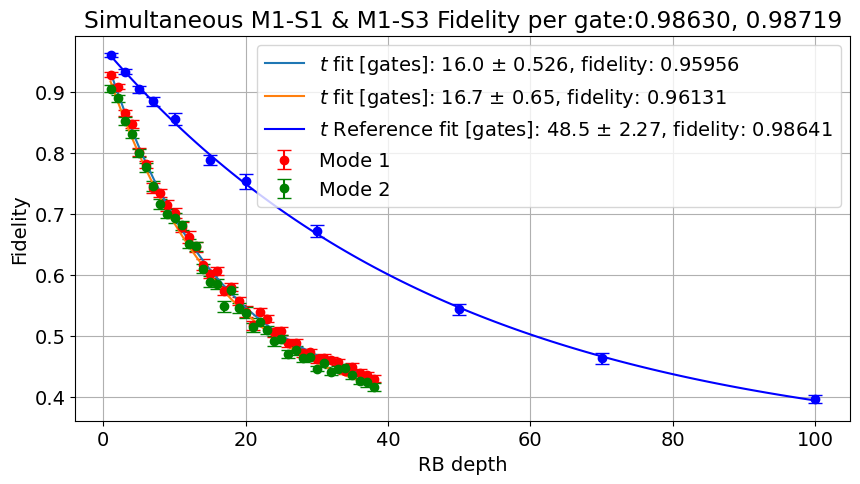

In [659]:
xx = np.linspace(1,100,100)
file_list = np.arange(75, 113 ,1)
name = '_MultiRBAM_sweep_depth.h5'

plt.figure(figsize=(10,5))
plt.subplot(111,  ylabel="Fidelity")

#for idx, prepulse_label in enumerate(prepulse_list_labels):
mode_length = 2
fids_list = [[] for i in range(mode_length)]
xlist = []
ebars_list = [[] for i in range(mode_length)]
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  
    mean, err = RBAM_extract(temp_data, mode_idxs = [0,1])
    for i in range(mode_length):
        fids_list[i].append(mean[i])
        ebars_list[i].append(err[i])
    xlist.append(attrs['config']['expt']['depth_list'][0])
color_list = ['r','g']
for i in range(len(fids_list)):
    plt.errorbar(xlist, fids_list[i], yerr= ebars_list[i],fmt = 'o', capsize=5, label=f'Mode {i+1}', color=color_list[i])

# fitting 
xpts = xlist
fidelity_list = []
for i in range(len(fids_list)):
    ypts = fids_list[i]
    fit,err = fitter.fitexp(xpts, ypts, fitparams=None)

    p = fit #data['fit_avgi']
    pCov = err #data['fit_err_avgi']
    alpha = np.exp(-1/fit[3])
    r = 1-alpha-(1-alpha)/3
    fidelity = 1-r

    fidelity_list.append(fidelity)
    captionStr = f'$t$ fit [gates]: {p[3]:.3} $\pm$ {np.sqrt(pCov[3][3]):.3}, fidelity: {fidelity:.5f}'
    plt.plot(xpts, fitter.expfunc(xpts, *fit), label=captionStr)

    

#================================#

# file_list_reference = np.arange(51,64,1)
file_list_reference = np.arange(51,62,1)
name_reference = '_SingleRB_sweep_depth.h5'

fids_list_reference = []
xlist_reference = []
ebars_list_reference = []
for file_no in file_list_reference:
    full_name = str(file_no).zfill(5)+name_reference
    temp_data, attrs = prev_data(expt_path, full_name)  
    avg_readout_reference = RB_extract(temp_data, conf=False)
    fids_list_reference.append(np.average(avg_readout_reference))
    ebars_list_reference.append(np.std(avg_readout_reference)/np.sqrt(len(avg_readout_reference)))
    xlist_reference.append(attrs['config']['expt']['rb_depth'])


# fitting 
xpts_reference = xlist_reference
ypts_reference = fids_list_reference
fit_reference,err_reference = fitter.fitexp(xpts_reference, ypts_reference, fitparams=None)

alpha_reference = np.exp(-1/fit_reference[3])
r_reference = 1-alpha_reference-(1-alpha_reference)/3
fidelity_reference = 1-r_reference

p_reference = fit_reference #data['fit_avgi']
pCov_reference = err_reference #data['fit_err_avgi']
captionStr_reference = f'$t$ Reference fit [gates]: {p_reference[3]:.3} $\pm$ {np.sqrt(pCov_reference[3][3]):.3}, fidelity: {fidelity_reference:.5f}'


#================================#

plt.errorbar(xlist_reference, fids_list_reference, yerr= ebars_list_reference,fmt = 'o', capsize=5, color='b')
plt.plot(xx, fitter.expfunc(xx, *fit_reference), label=captionStr_reference, color='b')

M1_S1_fidelity = np.sqrt(fidelity_list[0]/fidelity_reference)
M1_S2_fidelity = np.sqrt(fidelity_list[1]/fidelity_reference)

#=======coherence limit========#
qm1 = 0.035*4+0.01+0.035*8+0.01*2+6*0.005*2+0.615287*2+0.01*2
ms1 = 0.005*6*2+0.919488*2+0.01*2
ms2 = 0.005*6*2+1.252305*2+0.01*2
# gate_length1 = 0.035*4+0.01+0.035*8+0.01*2+6*0.005*2+0.615287*2+0.01*2+0.005*6*2+0.919488*2+0.01*2
# gate_length2 = 0.035*4+0.01+0.035*8+0.01*2+6*0.005*2+0.615287*2+0.01*2+0.005*6*2+1.055448*2+0.01*2
# reference_gate = (0.035*4+0.01+0.035*8+0.01*2+6*0.005*2+0.615287*2+0.01*2)/2
# each_gate = (gate_length1+gate_length2)/2
T1q = 235  # f T1
T1M = 210
T1S1 = 358
T1S2 = 799 #1254
coherence_limit1 = np.exp(-ms1/T1S1/2)*np.exp(-ms1/T1M/2)
coherence_limit1_waiting = coherence_limit1*np.exp(-(qm1+ms2)/T1S1)
coherence_limit2_waiting = np.exp(-ms2/T1S2/2)*np.exp(-ms2/T1M/2)*np.exp(-(qm1+ms1)/T1S2)
coherence_limit_reference = np.exp(-qm1/T1q/2)*np.exp(-qm1/T1M/2)
print('coherence limit reference: ',coherence_limit_reference)
print('coherence limit M1-S1: ',coherence_limit1**0.5)
print('coherence limit M1-S1 multiplexed: ',coherence_limit1_waiting**0.5)
print('coherence limit M1-S3 multiplexed: ',coherence_limit2_waiting**0.5)

# plt.plot(xx, [coherence_limit**i for i in xx], '--', label='Coherence limit', color='b')
# plt.plot(xx, [coherence_limit_reference**i for i in xx], '--', label='Reference limit', color='r')

#plt.show()
plt.xlabel('RB depth')
plt.ylabel('Fidelity')
plt.title(f'Simultaneous M1-S1 & M1-S3 Fidelity per gate:{M1_S1_fidelity:.5f}, {M1_S2_fidelity:.5f}')
plt.legend()
plt.grid()
plt.show()

In [ ]:
qm1+ms2+ms1+qm1

7.63102

## S2, S3

In [19]:
temp_data, attrs = prev_data(expt_path, '00771_MultiRBAM_sweep_depth.h5')
mode_nos = [4,6,7]
measure_mode_nos = mode_nos
mean_ps_list, err_ps_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=True)# np.arange(len(mode_nos)))
mean_list, err_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=False)# np.arange(len(mode_nos)))
for mode_idx, mode_no in enumerate(measure_mode_nos):
    print('--------------------------------------------------')
    print('Raw Result for Mode ', mode_no, 'is', mean_list[mode_idx], err_list[mode_idx])
    print('Post Select Result for Mode ', mode_no, 'is', mean_ps_list[mode_idx], err_ps_list[mode_idx])

--------------------------------------------------
Raw Result for Mode  4 is 0.8627937191553555 0.004920653699002345
Post Select Result for Mode  4 is 0.9096020589281666 0.0043978554561018455
--------------------------------------------------
Raw Result for Mode  6 is 0.8553583432479378 0.005268977835231433
Post Select Result for Mode  6 is 0.9041267780444586 0.004308892387034674
--------------------------------------------------
Raw Result for Mode  7 is 0.850297040613838 0.0059307301364786074
Post Select Result for Mode  7 is 0.8996451533205568 0.004972642246444357


## S1, ... , S7

In [24]:
temp_data, attrs = prev_data(expt_path_old, '00855_MultiRBAM_sweep_depth.h5')
temp_data


{'Idata': array([[[[-174.45779221, -256.8961039 , -255.01948052, ...,
            264.22077922,  251.25      , -303.10714286],
          [-305.19805195, -301.29545455, -264.3961039 , ...,
            214.46428571,  303.3961039 , -268.97727273],
          [-316.51948052, -280.33766234, -288.72077922, ...,
           -223.77597403, -276.6038961 , -291.96428571],
          [-230.36688312, -330.81493506, -204.17857143, ...,
           -221.45454545, -241.18181818, -219.4512987 ],
          [ 287.17857143,  335.19155844,  151.99025974, ...,
            191.52272727,  179.89935065,  283.96103896]],
 
         [[-266.13311688,  188.12987013,  189.45454545, ...,
           -167.59415584, -315.81168831, -225.18831169],
          [-414.76948052, -193.24350649, -318.14285714, ...,
           -372.35714286, -365.80194805, -202.86038961],
          [-264.72727273, -208.90909091, -260.63311688, ...,
           -125.47077922, -254.69480519, -206.4025974 ],
          [-321.52597403, -162.25649351,  16

In [107]:
temp_data, attrs = prev_data(expt_path, '00855_MultiRBAM_sweep_depth.h5')
mode_nos = [i+1 for i in range(7)]
measure_mode_nos = mode_nos
mean_ps_list, err_ps_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=True)# np.arange(len(mode_nos)))
mean_list, err_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=False)# np.arange(len(mode_nos)))
for mode_idx, mode_no in enumerate(measure_mode_nos):
    print('--------------------------------------------------')
    print('Raw Result for Mode ', mode_no, 'is', mean_list[mode_idx], err_list[mode_idx])
    print('Post Select Result for Mode ', mode_no, 'is', mean_ps_list[mode_idx], err_ps_list[mode_idx])

--------------------------------------------------
Raw Result for Mode  1 is 0.8240515250187467 0.0058174438554775155
Post Select Result for Mode  1 is 0.8747039618225283 0.005123717132099625
--------------------------------------------------
Raw Result for Mode  2 is 0.818537220901563 0.004283368567170443
Post Select Result for Mode  2 is 0.8665845004795723 0.0032662185319249273
--------------------------------------------------
Raw Result for Mode  3 is 0.8018746811214154 0.006169775639614914
Post Select Result for Mode  3 is 0.8504777896767184 0.00571968873805785
--------------------------------------------------
Raw Result for Mode  4 is 0.79478302770346 0.0054484717899057275
Post Select Result for Mode  4 is 0.8459702885241971 0.005001978362254289
--------------------------------------------------
Raw Result for Mode  5 is 0.7760656623227901 0.006840930550884937
Post Select Result for Mode  5 is 0.8218033249345766 0.005748072290285923
----------------------------------------------

In [25]:
for i in range(9): 
    f = 4.984 +0.174*i
    print(f)

4.984
5.158
5.332
5.506
5.68
5.854
6.0280000000000005
6.202
6.3759999999999994


f0g1_time:  1.8105733792693037
sim_rb_time:  31.344976305426314
[[0.8240515250187467, 0.7359249775642367, 0.6569671539929295, 0.5855780184739927, 0.5625971584826203, 0.510456611353595, 0.48006241737276395, 0.4545557201259701, 0.44846022268822544, 0.43184405756296507, 0.42146762383216757, 0.416828850333224, 0.4085724155023586, 0.40726319143254147, 0.40283351917757915, 0.4122765951579852, 0.4043616654300022, 0.40249816731927546, 0.41790344096138593, 0.4077577442702303, 0.4016794466447861, 0.3884151220711369, 0.4027535692846126, 0.40349790400999275], [0.818537220901563, 0.7179028544417605, 0.6397467615735836, 0.5765315572655081, 0.5302302756244789, 0.49915179601789794, 0.46760786886850425, 0.43715960208438814, 0.4311914948286855, 0.4186344098928788, 0.4170686606786529, 0.4048074546100299, 0.40223999176527375, 0.4004472319259226, 0.3897571438099841, 0.395398197129332, 0.3979775474391622, 0.3962855158435001, 0.4159847464210347, 0.40399364431582274, 0.3930317157535868, 0.3820806190544863, 0.

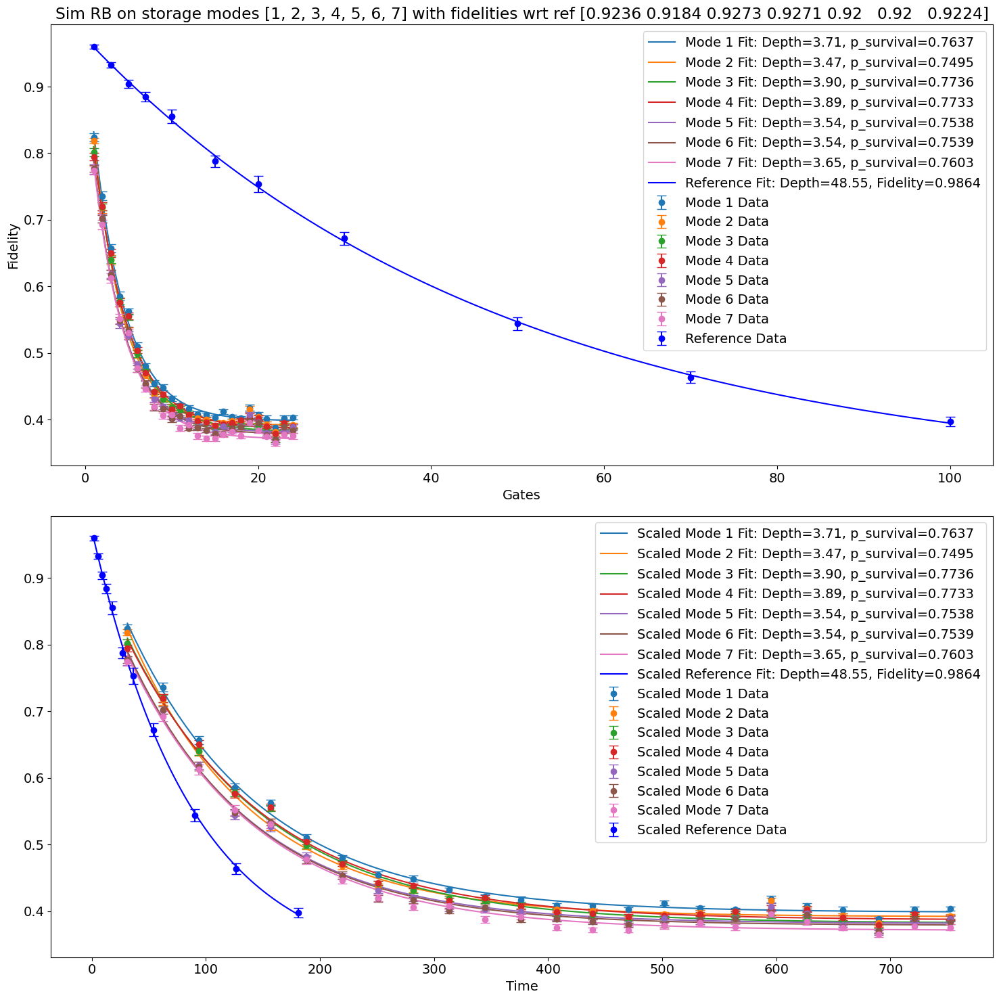

Fidelity with respect to reference: [0.9236295707378324, 0.9183777694768962, 0.9272556743083391, 0.9271320381424366, 0.9199770575052987, 0.9199880723547262, 0.9223628878087422]
                                           file_list              mode_list  \
0  [855, 856, 857, 858, 859, 860, 861, 862, 863, ...  [1, 2, 3, 4, 5, 6, 7]   

                                            fidelity  \
0  [0.9236295707378324, 0.9183777694768962, 0.927...   

                        name  
0  _MultiRBAM_sweep_depth.h5  


In [131]:
combinations = [[1,2,3,4,5,6,7]]
data = []

# open files and extract data
name = '_MultiRBAM_sweep_depth.h5'
max_idx = 100 #15
last_file_list = np.arange(855, 879,1)

comb = combinations[0]
mode_list = comb
mode_length = len(mode_list)
file_list = last_file_list

xlist, fids_list, ebars_list = compute_fidelity_list(prev_data, file_list, name, mode_length, expt_path)

fidelity_list, fit_params_list = fit_fidelity(xlist, fids_list)

# Reference data
file_list_reference = np.arange(51, 62, 1)
name_reference = '_SingleRB_sweep_depth.h5'
xlist_ref, fids_list_ref, ebars_list_ref = compute_fidelity_list_RB(prev_data, file_list_reference, name_reference, 1, expt_path)
fit_params_ref = fit_fidelity_reference(xlist_ref, fids_list_ref)
captionStr_ref = 'Reference'

# scale factors for plotting 
f0g1_time = get_f0g1_time(yaml_cfg)
print('f0g1_time: ', f0g1_time)

sim_rb_time = get_gate_time_RBAM(mode_list[0], mode_list[1:], yaml_cfg)
print('sim_rb_time: ', sim_rb_time)

# Plot both traces on the same plot
print(fids_list)
fids_wrt_ref = plot_fidelity(xlist, fids_list, ebars_list, fidelity_list, fit_params_list, xlist_ref, fids_list_ref, ebars_list_ref, fit_params_ref, captionStr_ref, 
                                mode_list, close_plt=False, scale_factor=sim_rb_time, scale_factor_ref=f0g1_time)

# Store the data in the list
#for i, fid in enumerate(fidelity_list):
data.append({
    'file_list': file_list,
    'mode_list': mode_list,
    'fidelity': fids_wrt_ref,
    'name': name
})
print('Fidelity with respect to reference:', fids_wrt_ref)
# except FileNotFoundError:
#     # If a file is not found, set fidelity to be empty
#     # for i in range(mode_length):
#     data.append({
#         'file_list': file_list,
#         'mode_list': mode_list,
#         'fidelity': [1,1,1],
#         #'mode': f'Mode {i+1}'
#     })

# Create a DataFrame from the data
df = pd.DataFrame(data)

# Display the DataFrame
print(df)
ex

In [132]:
# Variables from the active file
name = 'all_storage_rbam'
folder = saving_dataset_path  # Ensure this variable is defined in your script

# Ensure the folder exists
os.makedirs(folder, exist_ok=True)

# File path to save the DataFrame
file_path = os.path.join(folder, f"{name}.csv")

# Save the DataFrame to a CSV file
df.to_csv(file_path, index=False)

print(f"DataFrame saved to {file_path}")

DataFrame saved to h:\Shared drives\SLab\Multimode\experiment\240911\RAM_paper_results\datasets\all_storage_rbam.csv


In [102]:
alpha

0.7788007830714049

## All singles

In [139]:
### Plotting all pairs
mode_list = [1,2,3,4,5,6,7]
combinations = generate_mode_combinations(mode_list, 1, [])

# find file_lists
file_lists = []
start_file_no = 887
step_file_no = 23 
for comb in combinations:
    file_list = np.arange(start_file_no, start_file_no+step_file_no, 1)
    start_file_no += step_file_no
    file_lists.append(file_list)
file_lists

[array([887, 888, 889, 890, 891, 892, 893, 894, 895, 896, 897, 898, 899,
        900, 901, 902, 903, 904, 905, 906, 907, 908, 909]),
 array([910, 911, 912, 913, 914, 915, 916, 917, 918, 919, 920, 921, 922,
        923, 924, 925, 926, 927, 928, 929, 930, 931, 932]),
 array([933, 934, 935, 936, 937, 938, 939, 940, 941, 942, 943, 944, 945,
        946, 947, 948, 949, 950, 951, 952, 953, 954, 955]),
 array([956, 957, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968,
        969, 970, 971, 972, 973, 974, 975, 976, 977, 978]),
 array([ 979,  980,  981,  982,  983,  984,  985,  986,  987,  988,  989,
         990,  991,  992,  993,  994,  995,  996,  997,  998,  999, 1000,
        1001]),
 array([1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012,
        1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023,
        1024]),
 array([1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035,
        1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045

In [140]:
combinations

[[1], [2], [3], [4], [5], [6], [7]]

--------------------------------------------------
[1] [887 888 889 890 891 892 893 894 895 896 897 898 899 900 901 902 903 904
 905 906 907 908 909]
f0g1_time:  1.8105733792693037
sim_rb_time:  3.7295496380676805


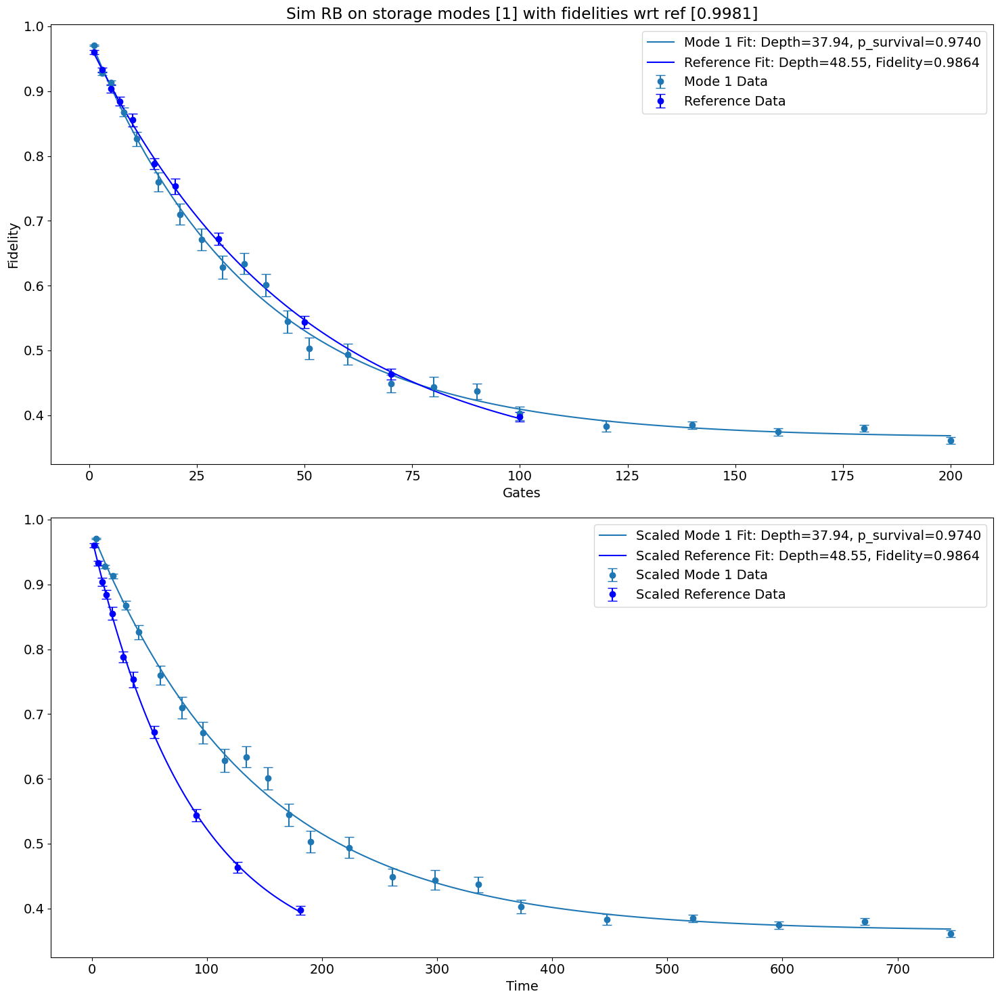

Fidelity with respect to reference: [0.9980840523820631]
--------------------------------------------------
[2] [910 911 912 913 914 915 916 917 918 919 920 921 922 923 924 925 926 927
 928 929 930 931 932]
f0g1_time:  1.8105733792693037
sim_rb_time:  4.001469388802523


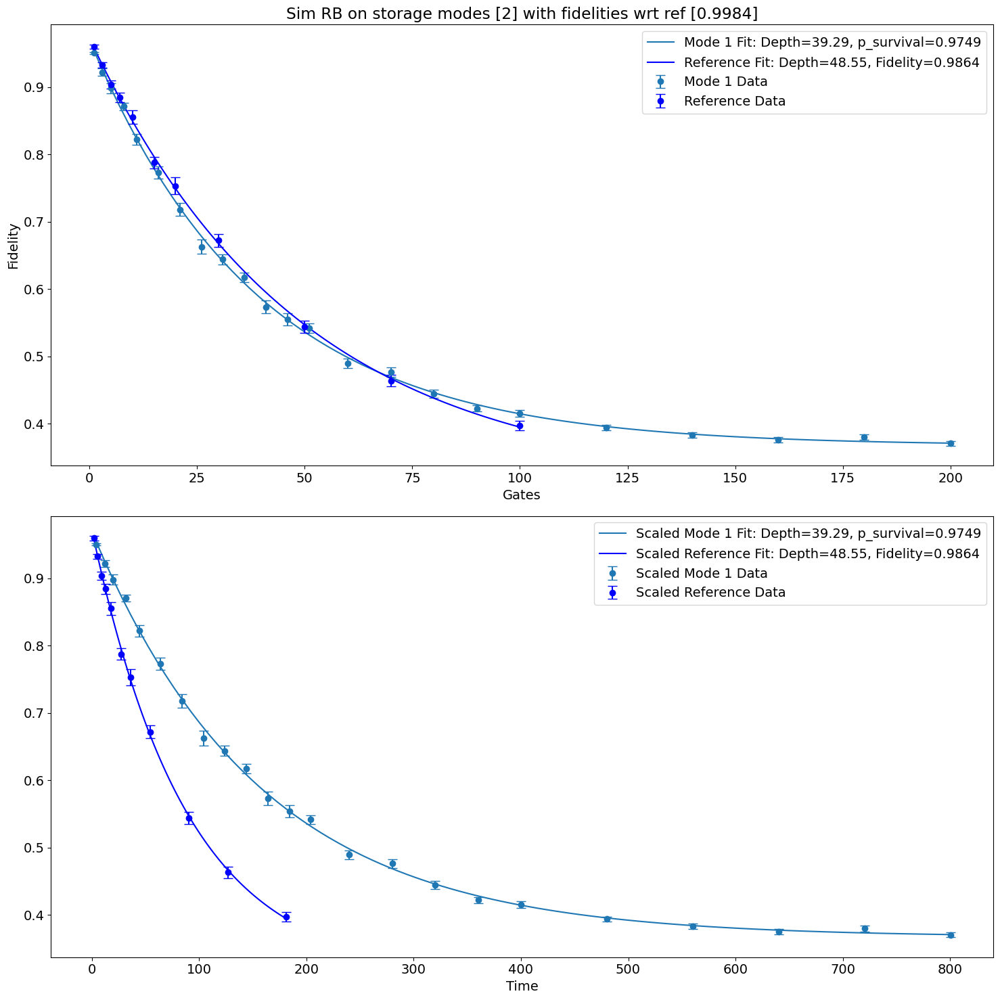

Fidelity with respect to reference: [0.9983855610023299]
--------------------------------------------------
[3] [933 934 935 936 937 938 939 940 941 942 943 944 945 946 947 948 949 950
 951 952 953 954 955]
f0g1_time:  1.8105733792693037
sim_rb_time:  4.395184240629267


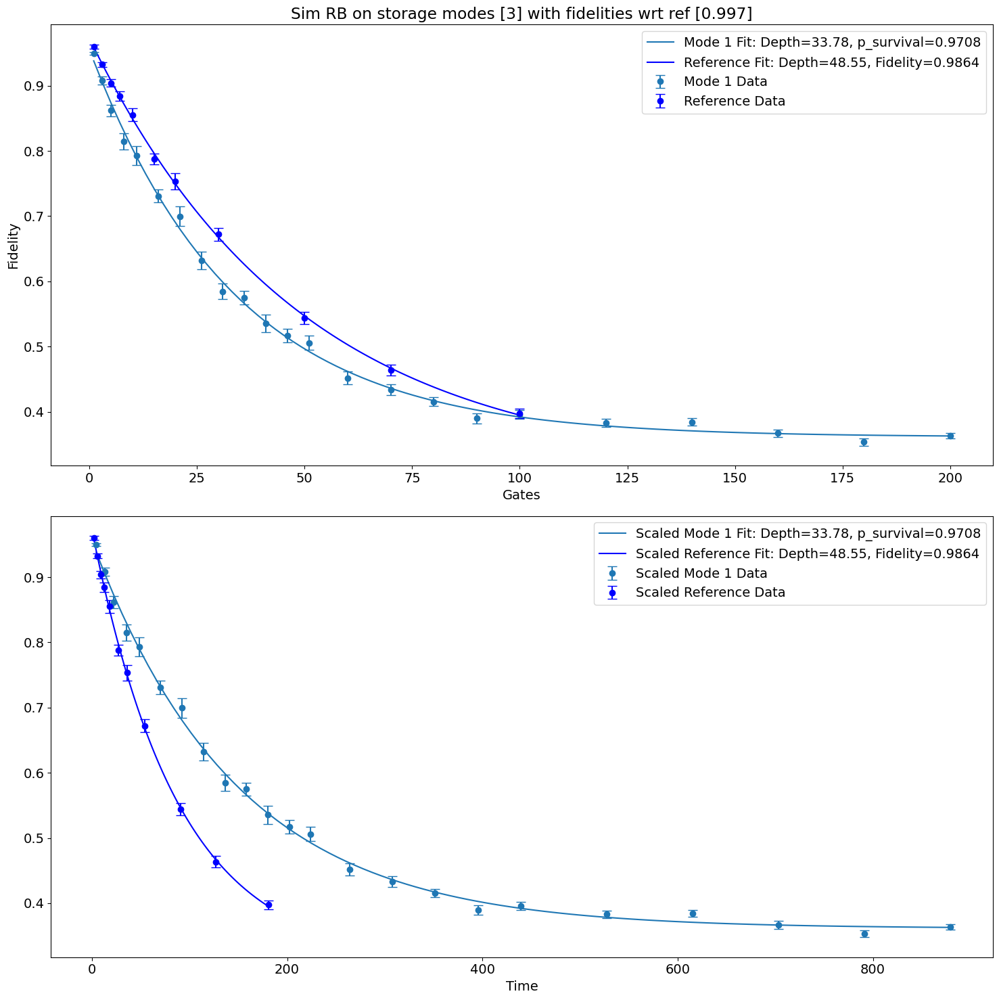

Fidelity with respect to reference: [0.9970063268742209]
--------------------------------------------------
[4] [956 957 958 959 960 961 962 963 964 965 966 967 968 969 970 971 972 973
 974 975 976 977 978]
f0g1_time:  1.8105733792693037
sim_rb_time:  4.260904707643799


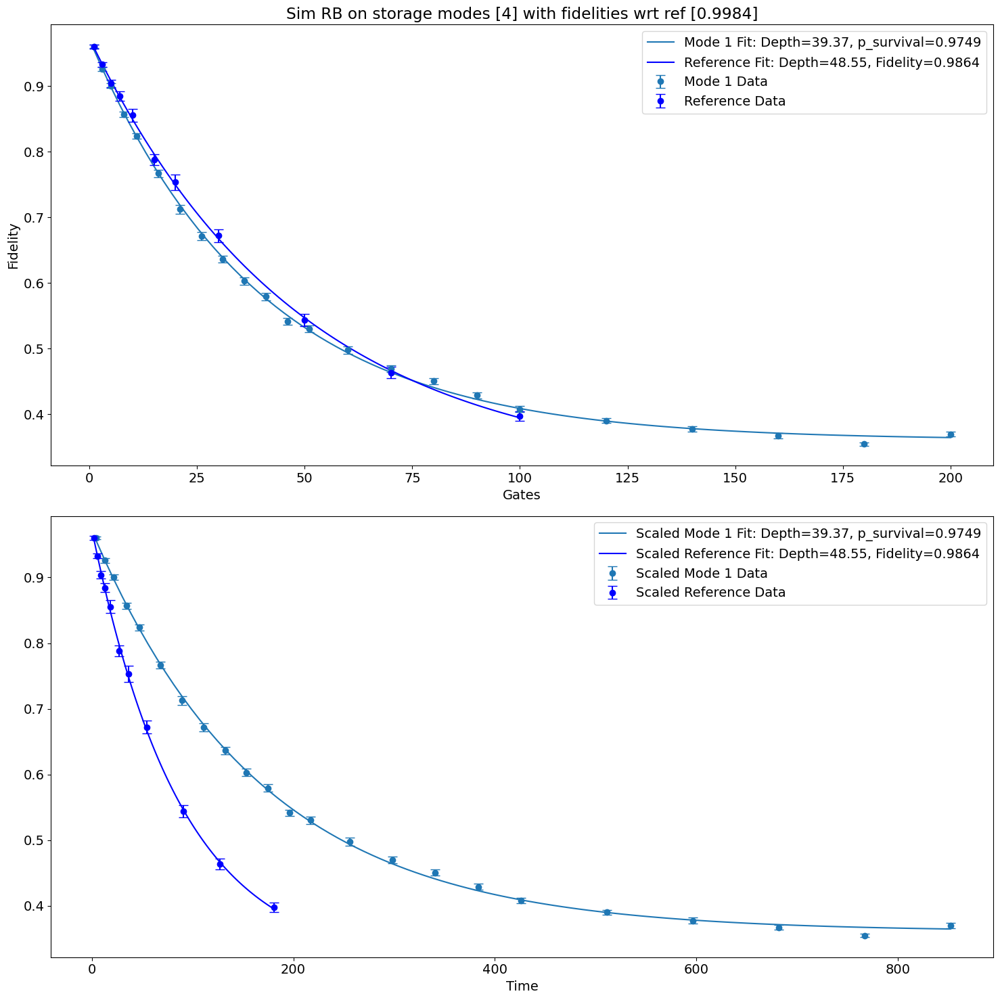

Fidelity with respect to reference: [0.9984012307107215]
--------------------------------------------------
[5] [ 979  980  981  982  983  984  985  986  987  988  989  990  991  992
  993  994  995  996  997  998  999 1000 1001]
f0g1_time:  1.8105733792693037
sim_rb_time:  5.590619569516832


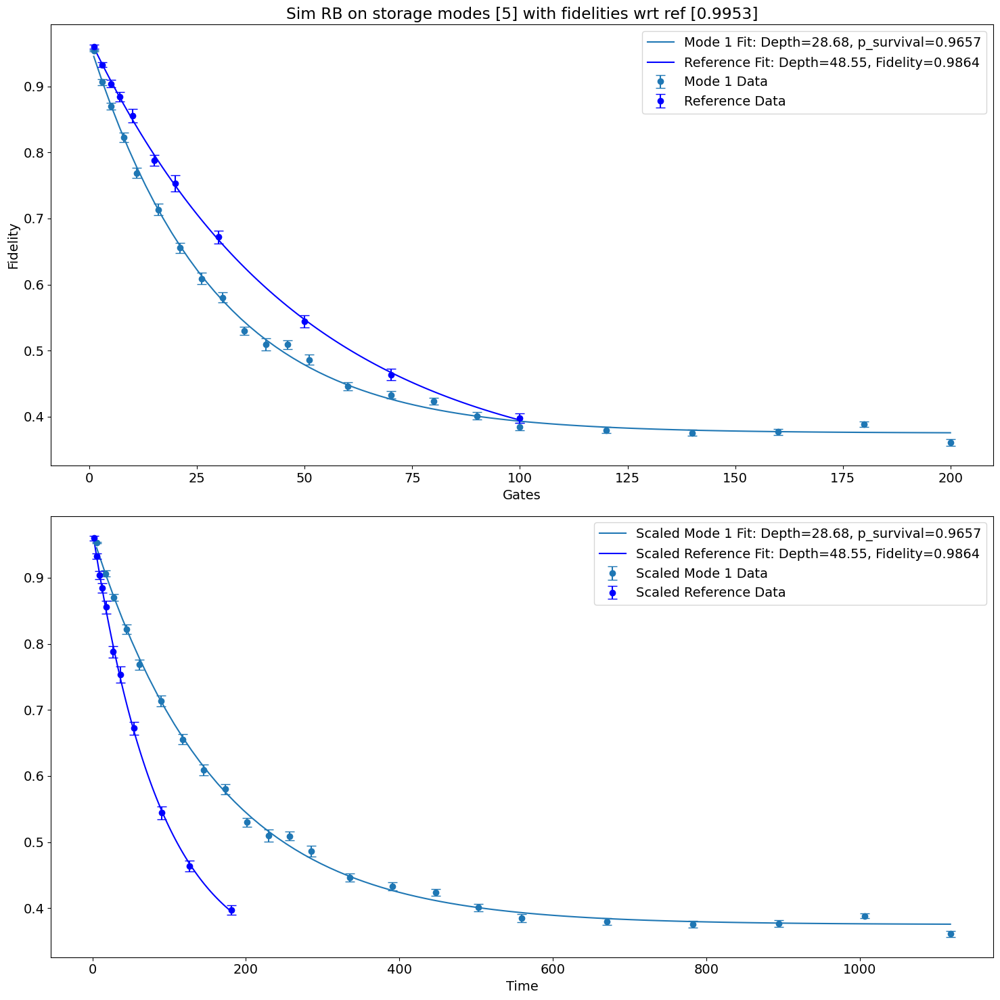

Fidelity with respect to reference: [0.9952651766823556]
--------------------------------------------------
[6] [1002 1003 1004 1005 1006 1007 1008 1009 1010 1011 1012 1013 1014 1015
 1016 1017 1018 1019 1020 1021 1022 1023 1024]
f0g1_time:  1.8105733792693037
sim_rb_time:  4.8936714036226725


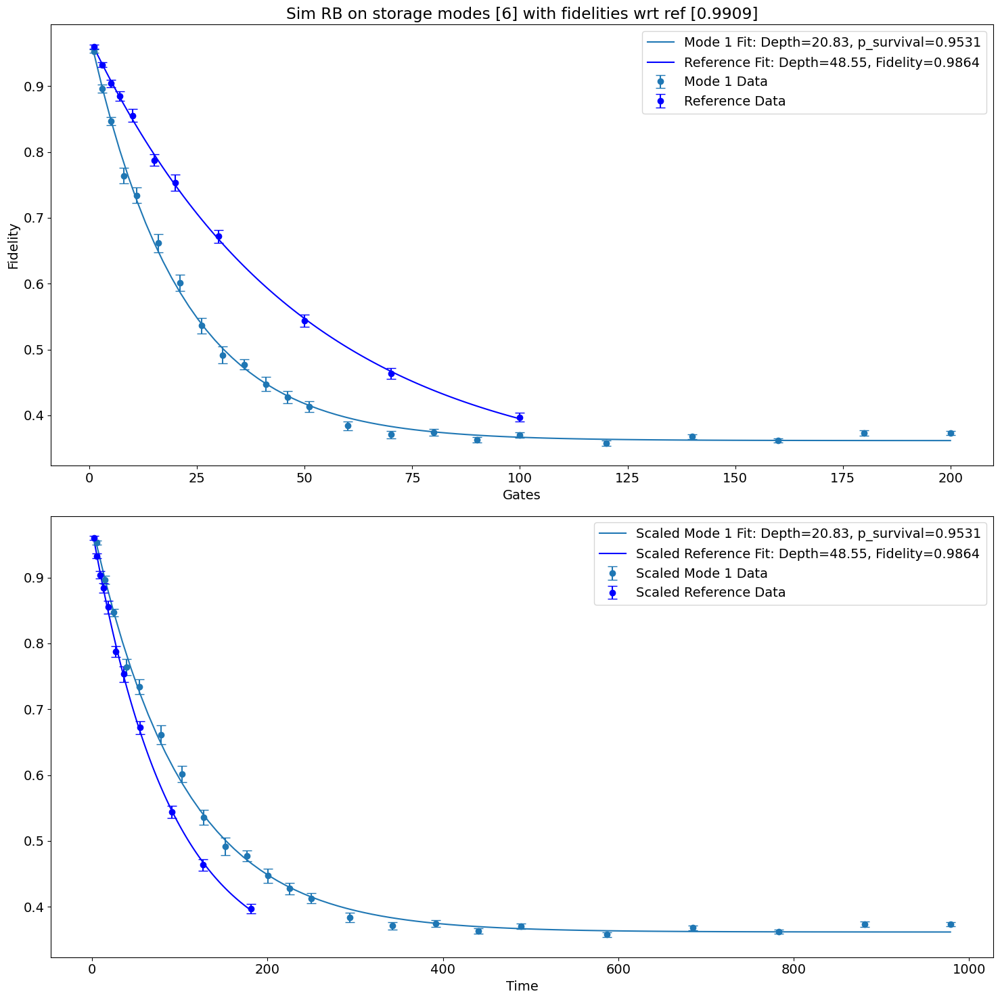

Fidelity with respect to reference: [0.9909442892049597]
--------------------------------------------------
[7] [1025 1026 1027 1028 1029 1030 1031 1032 1033 1034 1035 1036 1037 1038
 1039 1040 1041 1042 1043 1044 1045 1046 1047]
f0g1_time:  1.8105733792693037
sim_rb_time:  4.4735773571435455


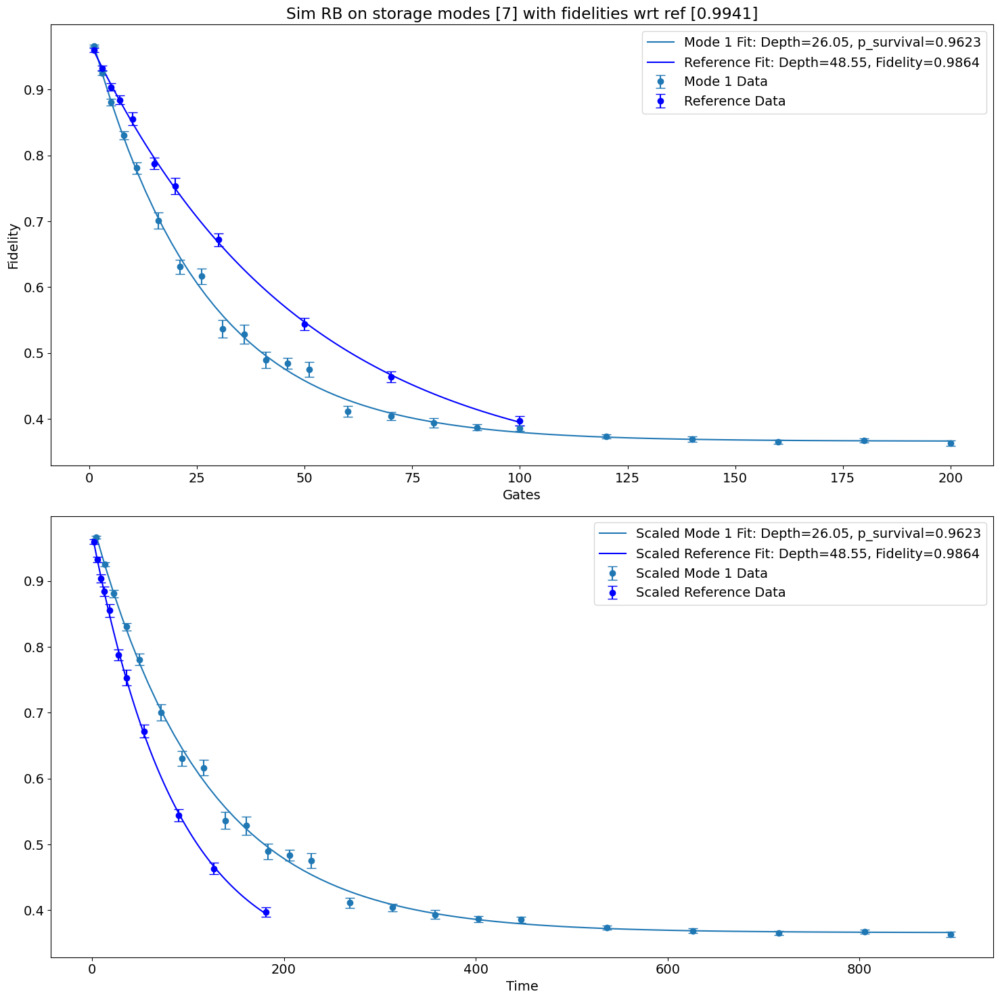

Fidelity with respect to reference: [0.9941037581308574]
                                           file_list mode_list  \
0  [887, 888, 889, 890, 891, 892, 893, 894, 895, ...       [1]   
1  [910, 911, 912, 913, 914, 915, 916, 917, 918, ...       [2]   
2  [933, 934, 935, 936, 937, 938, 939, 940, 941, ...       [3]   
3  [956, 957, 958, 959, 960, 961, 962, 963, 964, ...       [4]   
4  [979, 980, 981, 982, 983, 984, 985, 986, 987, ...       [5]   
5  [1002, 1003, 1004, 1005, 1006, 1007, 1008, 100...       [6]   
6  [1025, 1026, 1027, 1028, 1029, 1030, 1031, 103...       [7]   

               fidelity                       name  
0  [0.9980840523820631]  _MultiRBAM_sweep_depth.h5  
1  [0.9983855610023299]  _MultiRBAM_sweep_depth.h5  
2  [0.9970063268742209]  _MultiRBAM_sweep_depth.h5  
3  [0.9984012307107215]  _MultiRBAM_sweep_depth.h5  
4  [0.9952651766823556]  _MultiRBAM_sweep_depth.h5  
5  [0.9909442892049597]  _MultiRBAM_sweep_depth.h5  
6  [0.9941037581308574]  _MultiRBAM_sweep_d

In [143]:
# Initialize an empty list to store the data
data = []

# open files and extract data
name = '_MultiRBAM_sweep_depth.h5'
max_idx = 100 #15

for idx, comb in enumerate(combinations):
    print('--------------------------------------------------')
    file_list = file_lists[idx]
    print(comb, file_list)

    mode_list = comb
    mode_length = len(mode_list)
    # expt_path = 'path_to_experiment_data'  # Replace with actual path

    if idx> max_idx: 
        data.append({
                'file_list': file_list,
                'mode_list': mode_list,
                'fidelity': [1],
                'name': name
               # 'mode': f'Mode {i+1}'
            })
        continue


    try: 
        xlist, fids_list, ebars_list = compute_fidelity_list(prev_data, file_list, name, mode_length, expt_path)
        fidelity_list, fit_params_list = fit_fidelity(xlist, fids_list)

        # Reference data
        file_list_reference = np.arange(51, 62, 1)
        name_reference = '_SingleRB_sweep_depth.h5'
        xlist_ref, fids_list_ref, ebars_list_ref = compute_fidelity_list_RB(prev_data, file_list_reference, name_reference, 1, expt_path)
        fit_params_ref = fit_fidelity_reference(xlist_ref, fids_list_ref)
        captionStr_ref = 'Reference'

        # scale factors for plotting
        f0g1_time = get_f0g1_time(yaml_cfg)
        print('f0g1_time: ', f0g1_time)

        sim_rb_time = get_gate_time_RBAM(mode_list[0], mode_list[1:], yaml_cfg)
        print('sim_rb_time: ', sim_rb_time)

        # Plot both traces on the same plot
        fids_wrt_ref = plot_fidelity(xlist, fids_list, ebars_list, fidelity_list, fit_params_list, xlist_ref, fids_list_ref, ebars_list_ref, fit_params_ref, captionStr_ref, 
                                     mode_list, close_plt=False, scale_factor=sim_rb_time, scale_factor_ref=f0g1_time)
        
        # Store the data in the list
        #for i, fid in enumerate(fidelity_list):
        data.append({
            'file_list': file_list,
            'mode_list': mode_list,
            'fidelity': fids_wrt_ref,
            'name': name
        })
        print('Fidelity with respect to reference:', fids_wrt_ref)
    except FileNotFoundError:
        # If a file is not found, set fidelity to be empty
        # for i in range(mode_length):
        data.append({
            'file_list': file_list,
            'mode_list': mode_list,
            'fidelity': [1],
            'name': name
            #'mode': f'Mode {i+1}'
        })

# Create a DataFrame from the data
df = pd.DataFrame(data)

# Display the DataFrame
print(df)

In [144]:
# Variables from the active file
name = 'singles_rbam'
folder = saving_dataset_path  # Ensure this variable is defined in your script

# Ensure the folder exists
os.makedirs(folder, exist_ok=True)

# File path to save the DataFrame
file_path = os.path.join(folder, f"{name}.csv")

# Save the DataFrame to a CSV file
df.to_csv(file_path, index=False)

print(f"DataFrame saved to {file_path}")

DataFrame saved to h:\Shared drives\SLab\Multimode\experiment\240911\RAM_paper_results\datasets\singles_rbam.csv


## All pairs 

In [20]:
combinations = generate_mode_combinations([1,2,3,4], 2, [[1,2], [1,3]])
for comb in combinations:
    print(comb)

[1, 4]
[2, 3]
[2, 4]
[3, 4]


### Plotting all pairs

In [112]:
mode_list = [1,2,3,4,5,6,7]
combinations = generate_mode_combinations(mode_list, 2, [])

# find file_lists
file_lists = []
start_file_no = 140
step_file_no = 30 
for comb in combinations:
    file_list = np.arange(start_file_no, start_file_no+step_file_no, 1)
    start_file_no += step_file_no
    file_lists.append(file_list)

#### Debug Individual 

mode_list:  [1, 3]
f0g1_time:  1.8105733792693037
sim_rb_time:  8.124733878696947
Mode list: [1, 3]
file_list:  [170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187
 188 189 190 191 192 193 194 195 196 197 198 199]


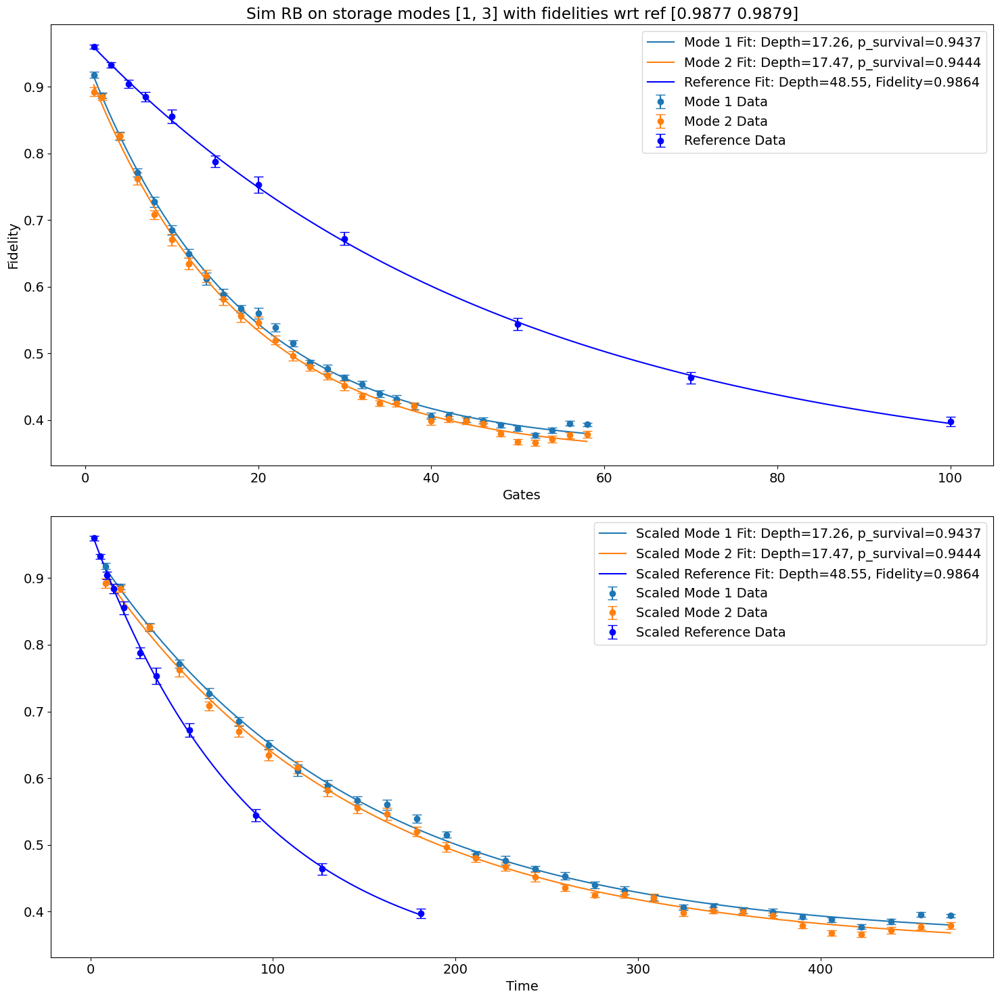

fidelities wrt ref:  [0.9877078663399715, 0.9879308243463806]
mode_list:  [1, 7]
f0g1_time:  1.8105733792693037
sim_rb_time:  8.203126995211226
Mode list: [1, 7]
file_list:  [290 291 292 293 294 295 296 297 298 299 300 301 302 303 304 305 306 307
 308 309 310 311 312 313 314 315 316 317 318 319]


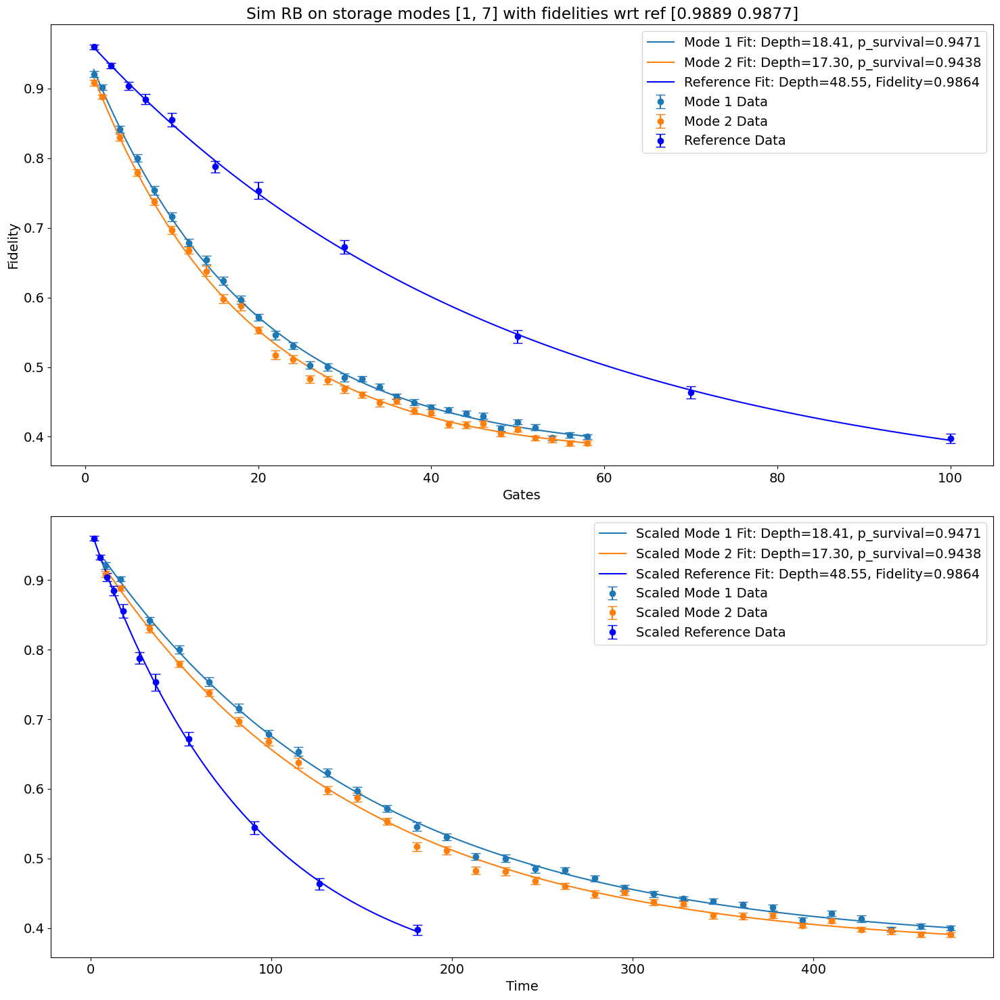

fidelities wrt ref:  [0.9888810543315425, 0.9877483022696049]
mode_list:  [2, 5]
f0g1_time:  1.8105733792693037
sim_rb_time:  9.592088958319355
Mode list: [2, 5]
file_list:  [380 381 382 383 384 385 386 387 388 389 390 391 392 393 394 395 396 397
 398 399 400 401 402 403 404 405 406 407 408 409]


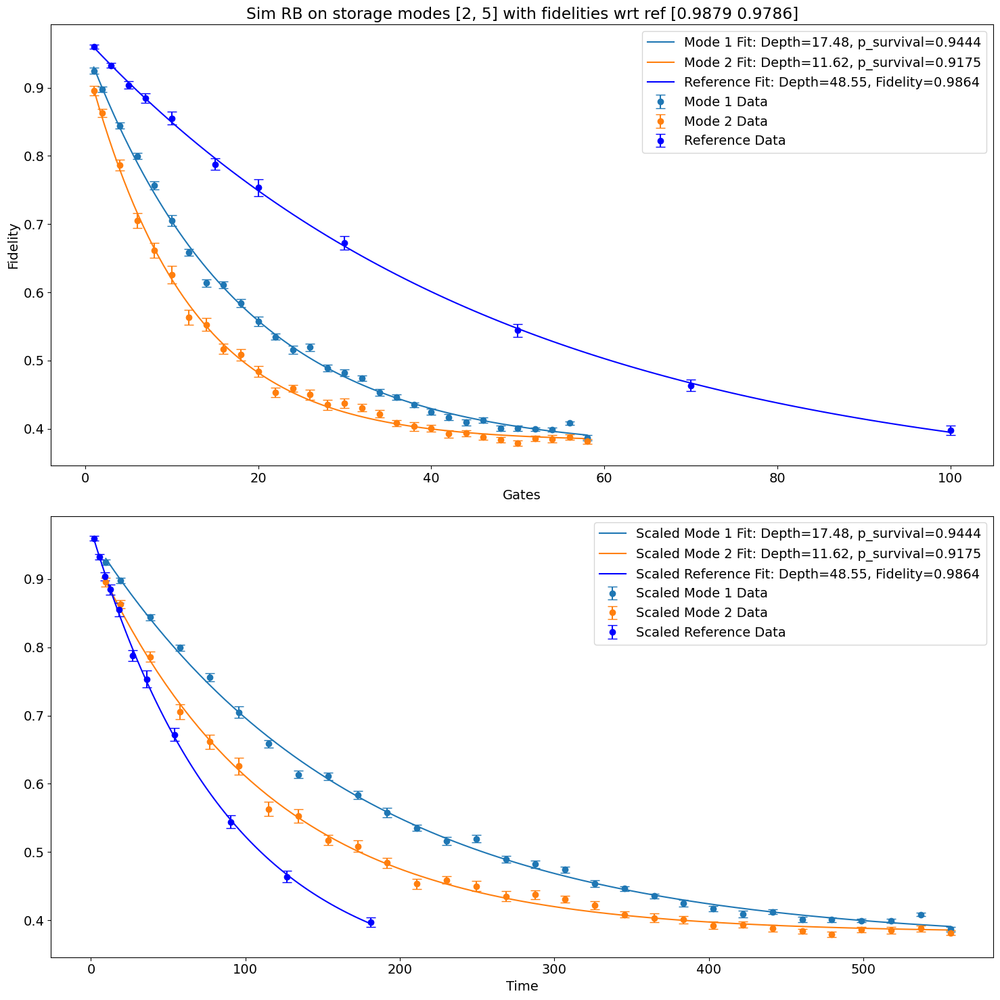

fidelities wrt ref:  [0.9879420379501458, 0.9786411992267432]
mode_list:  [3, 6]
f0g1_time:  1.8105733792693037
sim_rb_time:  9.288855644251939
Mode list: [3, 6]
file_list:  [530 531 532 533 534 535 536 537 538 539 540 541 542 543 544 545 546 547
 548 549 550 551 552 553 554 555 556 557 558 559]


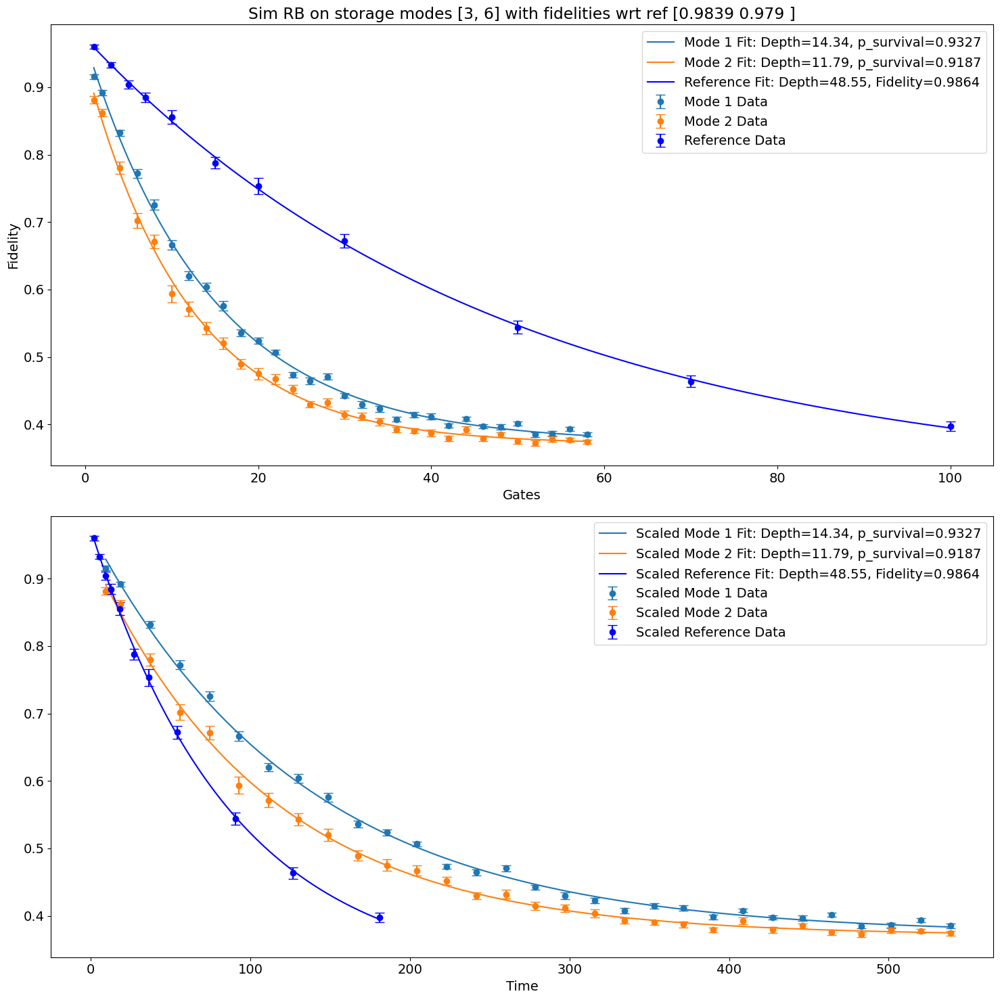

fidelities wrt ref:  [0.983893763092211, 0.9790417715749447]


In [116]:
idxs = [1, 5, 8, 13]
for idx in idxs:
    comb = combinations[idx]
    file_list = file_lists[idx]
    mode_list = comb
    mode_length = len(mode_list)
    print('mode_list: ', mode_list)

    f0g1_time = get_f0g1_time(yaml_cfg)
    print('f0g1_time: ', f0g1_time)
    sim_rb_time = get_gate_time_RBAM(mode_list[0], [mode_list[1]], yaml_cfg)
    print('sim_rb_time: ', sim_rb_time)

    xlist, fids_list, ebars_list = compute_fidelity_list(prev_data, file_list, name, mode_length, expt_path)
    fidelity_list, fit_params_list = fit_fidelity(xlist, fids_list)

    # Reference data
    file_list_reference = np.arange(51, 62, 1)
    name_reference = '_SingleRB_sweep_depth.h5'
    xlist_ref, fids_list_ref, ebars_list_ref = compute_fidelity_list_RB(prev_data, file_list_reference, name_reference, 1, expt_path)
    fit_params_ref = fit_fidelity_reference(xlist_ref, fids_list_ref)
    captionStr_ref = 'Reference'

    # Print out mode list, fidelity list, and fit parameters
    print('Mode list:', mode_list)
    print('file_list: ', file_list)
    # Plot both traces on the same plot
    fids_wrt_ref = plot_fidelity(xlist, fids_list, ebars_list, fidelity_list, fit_params_list, xlist_ref, fids_list_ref, ebars_list_ref, fit_params_ref, captionStr_ref, 
                                    mode_list, close_plt=False, scale_factor=sim_rb_time, scale_factor_ref=f0g1_time)
    # print fidelity wrt ref
    print('fidelities wrt ref: ', fids_wrt_ref)



In [1394]:
from experiments.MM_rb_base import *


get_f0g1_time(yaml_cfg)


1.8105733792693037

In [1447]:
6+5+4

15

#### Plot all

In [117]:
# Initialize an empty list to store the data
data = []

# open files and extract data
name = '_MultiRBAM_sweep_depth.h5'
max_idx = 100 #15

for idx, comb in enumerate(combinations):
    print('--------------------------------------------------')
    file_list = file_lists[idx]
    print(comb, file_list)

    mode_list = comb
    mode_length = len(mode_list)
    # expt_path = 'path_to_experiment_data'  # Replace with actual path

    if idx> max_idx: 
        data.append({
                'file_list': file_list,
                'mode_list': mode_list,
                'fidelity': [1,1],
               # 'mode': f'Mode {i+1}'
            })
        continue


    try: 
        xlist, fids_list, ebars_list = compute_fidelity_list(prev_data, file_list, name, mode_length, expt_path)
        fidelity_list, fit_params_list = fit_fidelity(xlist, fids_list)

        # Reference data
        file_list_reference = np.arange(51, 62, 1)
        name_reference = '_SingleRB_sweep_depth.h5'
        xlist_ref, fids_list_ref, ebars_list_ref = compute_fidelity_list_RB(prev_data, file_list_reference, name_reference, 1, expt_path)
        fit_params_ref = fit_fidelity_reference(xlist_ref, fids_list_ref)
        captionStr_ref = 'Reference'

        # Plot both traces on the same plot
        fids_wrt_ref = plot_fidelity(xlist, fids_list, ebars_list, fidelity_list, fit_params_list, xlist_ref, fids_list_ref, ebars_list_ref, fit_params_ref, captionStr_ref, 
                                     mode_list, close_plt=True, scale_factor=1, scale_factor_ref=1)
        
        # Store the data in the list
        #for i, fid in enumerate(fidelity_list):
        data.append({
            'file_list': file_list,
            'mode_list': mode_list,
            'fidelity': fids_wrt_ref,
        })
        print('Fidelity with respect to reference:', fids_wrt_ref)
    except FileNotFoundError:
        # If a file is not found, set fidelity to be empty
        # for i in range(mode_length):
        data.append({
            'file_list': file_list,
            'mode_list': mode_list,
            'fidelity': [1,1],
            #'mode': f'Mode {i+1}'
        })

# Create a DataFrame from the data
df = pd.DataFrame(data)

# Display the DataFrame
print(df)

--------------------------------------------------
[1, 2] [140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157
 158 159 160 161 162 163 164 165 166 167 168 169]
Fidelity with respect to reference: [0.9867574297150171, 0.988183812191005]
--------------------------------------------------
[1, 3] [170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187
 188 189 190 191 192 193 194 195 196 197 198 199]
Fidelity with respect to reference: [0.9877078663399715, 0.9879308243463806]
--------------------------------------------------
[1, 4] [200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217
 218 219 220 221 222 223 224 225 226 227 228 229]
Fidelity with respect to reference: [0.9859804459275431, 0.9889564720199499]
--------------------------------------------------
[1, 5] [230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247
 248 249 250 251 252 253 254 255 256 257 258 259]
Fidelity with respect to reference: [0.9785896

In [118]:
df

,file_list,mode_list,fidelity
0,"[140, 141, 142, 143, 144, 145, 146, 147, 148, ...","[1, 2]","[0.9867574297150171, 0.988183812191005]"
1,"[170, 171, 172, 173, 174, 175, 176, 177, 178, ...","[1, 3]","[0.9877078663399715, 0.9879308243463806]"
2,"[200, 201, 202, 203, 204, 205, 206, 207, 208, ...","[1, 4]","[0.9859804459275431, 0.9889564720199499]"
3,"[230, 231, 232, 233, 234, 235, 236, 237, 238, ...","[1, 5]","[0.9785896381474187, 0.9767065673408569]"
4,"[260, 261, 262, 263, 264, 265, 266, 267, 268, ...","[1, 6]","[0.9801591930045422, 0.9791757064282873]"
5,"[290, 291, 292, 293, 294, 295, 296, 297, 298, ...","[1, 7]","[0.9888810543315425, 0.9877483022696049]"
6,"[320, 321, 322, 323, 324, 325, 326, 327, 328, ...","[2, 3]","[0.982614333277681, 0.9830095407868106]"
7,"[350, 351, 352, 353, 354, 355, 356, 357, 358, ...","[2, 4]","[0.9896760110807408, 0.988630499060335]"
8,"[380, 381, 382, 383, 384, 385, 386, 387, 388, ...","[2, 5]","[0.9879420379501458, 0.9786411992267432]"
9,"[410, 411, 412, 413, 414, 415, 416, 417, 418, ...","[2, 6]","[0.9847980440871712, 0.9765891764299545]"


In [ ]:
df

In [119]:
# Fill the matrix with fidelity values
mode_list = [1,2,3,4,5,6,7]
matrix = np.zeros((len(mode_list), len(mode_list)))
for idx, comb in enumerate(combinations):
    print(comb)
    # try:
    fidelity_values = df['fidelity'].values[idx]
    print(fidelity_values)
    if len(fidelity_values) >= 2:
        matrix[comb[0] - 1, comb[1] - 1] = fidelity_values[0]
        matrix[comb[1] - 1, comb[0] - 1] = fidelity_values[1]
    #     else:
    #         print(f"Not enough fidelity values for combination {comb}")
    # except IndexError:
    #     print(f"Combination {comb} not found in DataFrame")

for i in range(len(matrix)):
    matrix[i, i] = 1

[1, 2]
[0.9867574297150171, 0.988183812191005]
[1, 3]
[0.9877078663399715, 0.9879308243463806]
[1, 4]
[0.9859804459275431, 0.9889564720199499]
[1, 5]
[0.9785896381474187, 0.9767065673408569]
[1, 6]
[0.9801591930045422, 0.9791757064282873]
[1, 7]
[0.9888810543315425, 0.9877483022696049]
[2, 3]
[0.982614333277681, 0.9830095407868106]
[2, 4]
[0.9896760110807408, 0.988630499060335]
[2, 5]
[0.9879420379501458, 0.9786411992267432]
[2, 6]
[0.9847980440871712, 0.9765891764299545]
[2, 7]
[0.9870576483778674, 0.9848936515562952]
[3, 4]
[0.9872657706650609, 0.9881124244860268]
[3, 5]
[0.9835319492650224, 0.9794014015890562]
[3, 6]
[0.983893763092211, 0.9790417715749447]
[3, 7]
[0.9873245009856192, 0.9882135146198197]
[4, 5]
[0.989414116821054, 0.987841187043467]
[4, 6]
[0.9710783350418206, 0.9708263433173712]
[4, 7]
[0.9866732358864794, 0.9833735253742022]
[5, 6]
[0.9834427637466935, 0.9837832449283609]
[5, 7]
[0.9751525141713376, 0.9796678434943049]
[6, 7]
[0.9749616672424388, 0.9754940270324715

In [120]:
matrix

array([[1.        , 0.98675743, 0.98770787, 0.98598045, 0.97858964,
        0.98015919, 0.98888105],
       [0.98818381, 1.        , 0.98261433, 0.98967601, 0.98794204,
        0.98479804, 0.98705765],
       [0.98793082, 0.98300954, 1.        , 0.98726577, 0.98353195,
        0.98389376, 0.9873245 ],
       [0.98895647, 0.9886305 , 0.98811242, 1.        , 0.98941412,
        0.97107834, 0.98667324],
       [0.97670657, 0.9786412 , 0.9794014 , 0.98784119, 1.        ,
        0.98344276, 0.97515251],
       [0.97917571, 0.97658918, 0.97904177, 0.97082634, 0.98378324,
        1.        , 0.97496167],
       [0.9877483 , 0.98489365, 0.98821351, 0.98337353, 0.97966784,
        0.97549403, 1.        ]])

In [122]:
infidelity_matrix = 1 - matrix

Text(0.5, 53.7222222222222, 'Mode we paired it with ')

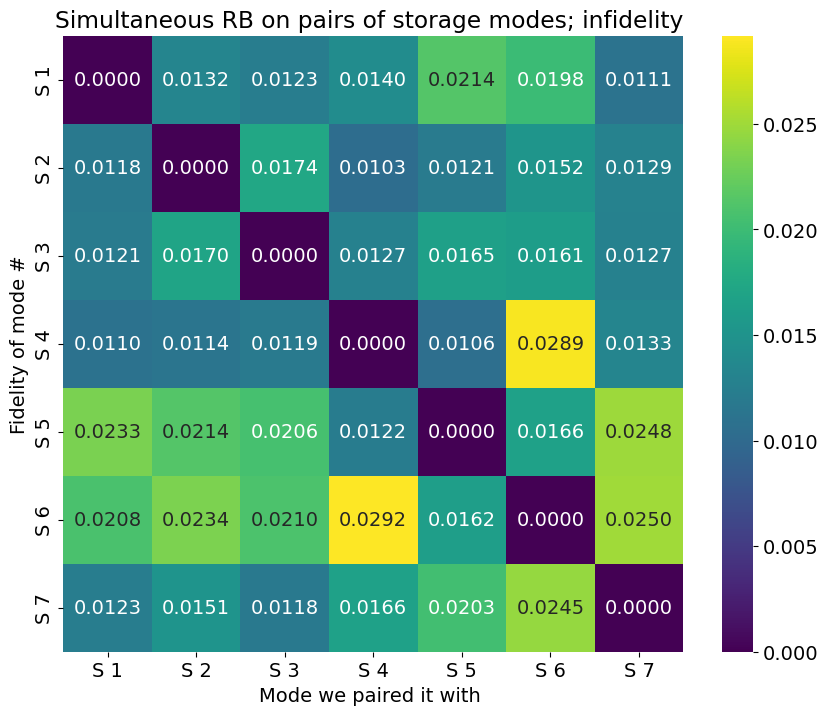

In [125]:
plt.figure(figsize=(10, 8))
labels = [f'S {i+1}' for i in range(len(mode_list))]
sns.heatmap(infidelity_matrix, annot=True, fmt=".4f", cmap="viridis", cbar=True, xticklabels=labels, yticklabels=labels)
plt.title('Simultaneous RB on pairs of storage modes; infidelity ')
plt.ylabel('Fidelity of mode #')
plt.xlabel('Mode we paired it with ')

##### Saving the data

In [126]:
# Variables from the active file
name = 'all_pairs_rbam'
folder = saving_dataset_path  # Ensure this variable is defined in your script

# Ensure the folder exists
os.makedirs(folder, exist_ok=True)

# File path to save the DataFrame
file_path = os.path.join(folder, f"{name}.csv")

# Save the DataFrame to a CSV file
df.to_csv(file_path, index=False)

print(f"DataFrame saved to {file_path}")


DataFrame saved to h:\Shared drives\SLab\Multimode\experiment\240911\RAM_paper_results\datasets\all_pairs_rbam.csv


### Plotting all singles and doubles together

In [150]:
import ast

In [157]:
folder = saving_dataset_path  # Ensure this variable is defined in your script

# Ensure the folder exists
os.makedirs(folder, exist_ok=True)

# File path to save the DataFrame
singles_name = 'singles_rbam'
pairs_name = 'all_pairs_rbam'


singles_df = pd.read_csv(os.path.join(folder, f"{singles_name}.csv"))
pairs_df = pd.read_csv(os.path.join(folder, f"{pairs_name}.csv"))

# fill the matrix 
mode_list = [1,2,3,4,5,6,7]
matrix = np.zeros((len(mode_list), len(mode_list)))
combinations = generate_mode_combinations(mode_list, 2, [])

for idx, comb in enumerate(combinations):
    print(comb)
    # try:
    fidelity_values = ast.literal_eval(pairs_df['fidelity'].values[idx])
    print(fidelity_values)
    if len(fidelity_values) >= 2:
        matrix[comb[0] - 1, comb[1] - 1] = fidelity_values[0]
        matrix[comb[1] - 1, comb[0] - 1] = fidelity_values[1]
    #     else:
    #         print(f"Not enough fidelity values for combination {comb}")
    # except IndexError:
    #     print(f"Combination {comb} not found in DataFrame")

# for diagonals 
for i in range(len(matrix)):
    matrix[i, i] = ast.literal_eval(singles_df['fidelity'].values[i])[0]




[1, 2]
[0.9867574297150171, 0.988183812191005]
[1, 3]
[0.9877078663399715, 0.9879308243463806]
[1, 4]
[0.9859804459275431, 0.9889564720199499]
[1, 5]
[0.9785896381474187, 0.9767065673408569]
[1, 6]
[0.9801591930045422, 0.9791757064282873]
[1, 7]
[0.9888810543315425, 0.9877483022696049]
[2, 3]
[0.982614333277681, 0.9830095407868106]
[2, 4]
[0.9896760110807408, 0.988630499060335]
[2, 5]
[0.9879420379501458, 0.9786411992267432]
[2, 6]
[0.9847980440871712, 0.9765891764299545]
[2, 7]
[0.9870576483778674, 0.9848936515562952]
[3, 4]
[0.9872657706650609, 0.9881124244860268]
[3, 5]
[0.9835319492650224, 0.9794014015890562]
[3, 6]
[0.983893763092211, 0.9790417715749447]
[3, 7]
[0.9873245009856192, 0.9882135146198197]
[4, 5]
[0.989414116821054, 0.987841187043467]
[4, 6]
[0.9710783350418206, 0.9708263433173712]
[4, 7]
[0.9866732358864794, 0.9833735253742022]
[5, 6]
[0.9834427637466935, 0.9837832449283609]
[5, 7]
[0.9751525141713376, 0.9796678434943049]
[6, 7]
[0.9749616672424388, 0.9754940270324715

In [155]:
singles_df['fidelity'].values[i]

'[0.9980840523820631]'

In [162]:
infidelity_matrix = (1 - matrix) * 100

In [163]:
infidelity_matrix

array([[0.19159476, 1.32425703, 1.22921337, 1.40195541, 2.14103619,
        1.9840807 , 1.11189457],
       [1.18161878, 0.1614439 , 1.73856667, 1.03239889, 1.2057962 ,
        1.52019559, 1.29423516],
       [1.20691757, 1.69904592, 0.29936731, 1.27342293, 1.64680507,
        1.61062369, 1.2675499 ],
       [1.1043528 , 1.13695009, 1.18875755, 0.15987693, 1.05858832,
        2.8921665 , 1.33267641],
       [2.32934327, 2.13588008, 2.05985984, 1.2158813 , 0.47348233,
        1.65572363, 2.48474858],
       [2.08242936, 2.34108236, 2.09582284, 2.91736567, 1.62167551,
        0.90557108, 2.50383328],
       [1.22516977, 1.51063484, 1.17864854, 1.66264746, 2.03321565,
        2.4505973 , 0.58962419]])

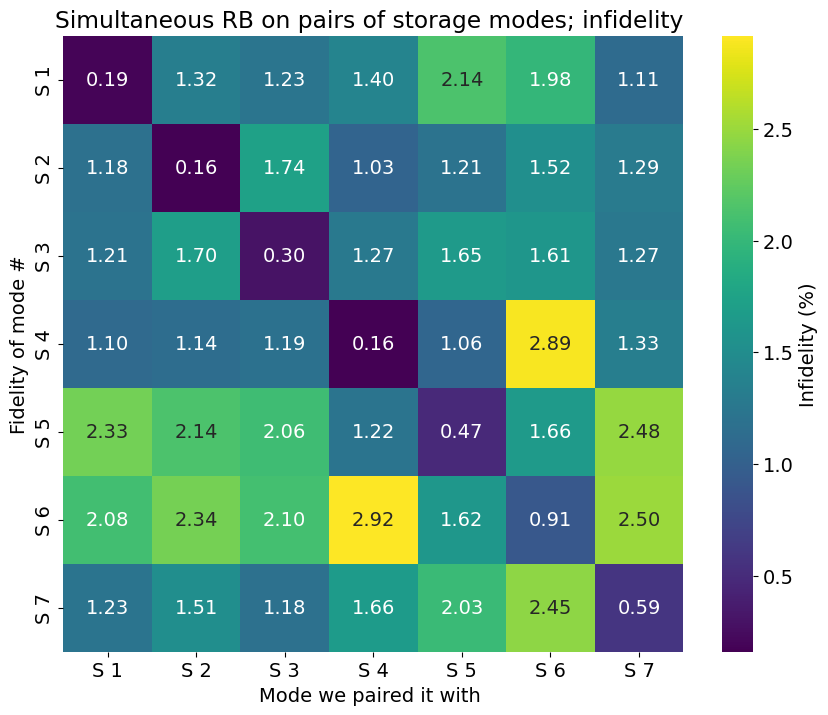

In [165]:


# Assuming mode_list and infidelity_matrix are already defined
# Example definitions (replace with actual data)

plt.figure(figsize=(10, 8))
labels = [f'S {i+1}' for i in range(len(mode_list))]
sns.heatmap(infidelity_matrix, annot=True, fmt=".2f", cmap="viridis", cbar=True, xticklabels=labels, yticklabels=labels, cbar_kws={'label': 'Infidelity (%)'})
plt.title('Simultaneous RB on pairs of storage modes; infidelity ')
plt.ylabel('Fidelity of mode #')
plt.xlabel('Mode we paired it with ')
plt.show()

In [149]:
combinations

[[1, 2],
 [1, 3],
 [1, 4],
 [1, 5],
 [1, 6],
 [1, 7],
 [2, 3],
 [2, 4],
 [2, 5],
 [2, 6],
 [2, 7],
 [3, 4],
 [3, 5],
 [3, 6],
 [3, 7],
 [4, 5],
 [4, 6],
 [4, 7],
 [5, 6],
 [5, 7],
 [6, 7]]

In [147]:
pairs_df

,file_list,mode_list,fidelity
0,[140 141 142 143 144 145 146 147 148 149 150 1...,"[1, 2]","[0.9867574297150171, 0.988183812191005]"
1,[170 171 172 173 174 175 176 177 178 179 180 1...,"[1, 3]","[0.9877078663399715, 0.9879308243463806]"
2,[200 201 202 203 204 205 206 207 208 209 210 2...,"[1, 4]","[0.9859804459275431, 0.9889564720199499]"
3,[230 231 232 233 234 235 236 237 238 239 240 2...,"[1, 5]","[0.9785896381474187, 0.9767065673408569]"
4,[260 261 262 263 264 265 266 267 268 269 270 2...,"[1, 6]","[0.9801591930045422, 0.9791757064282873]"
5,[290 291 292 293 294 295 296 297 298 299 300 3...,"[1, 7]","[0.9888810543315425, 0.9877483022696049]"
6,[320 321 322 323 324 325 326 327 328 329 330 3...,"[2, 3]","[0.982614333277681, 0.9830095407868106]"
7,[350 351 352 353 354 355 356 357 358 359 360 3...,"[2, 4]","[0.9896760110807408, 0.988630499060335]"
8,[380 381 382 383 384 385 386 387 388 389 390 3...,"[2, 5]","[0.9879420379501458, 0.9786411992267432]"
9,[410 411 412 413 414 415 416 417 418 419 420 4...,"[2, 6]","[0.9847980440871712, 0.9765891764299545]"


## Three threes 

In [133]:
combinations = [[4, 5, 7], [1, 2, 6], [1, 2, 3]]
# find file_lists
file_lists = []
start_file_no = 770
step_file_no = 30 
for comb in combinations:
    file_list = np.arange(start_file_no, start_file_no+step_file_no, 1)
    start_file_no += step_file_no
    file_lists.append(file_list)

In [134]:
file_lists

[array([770, 771, 772, 773, 774, 775, 776, 777, 778, 779, 780, 781, 782,
        783, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795,
        796, 797, 798, 799]),
 array([800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812,
        813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825,
        826, 827, 828, 829]),
 array([830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842,
        843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855,
        856, 857, 858, 859])]

--------------------------------------------------
[4, 5, 7] [770 771 772 773 774 775 776 777 778 779 780 781 782 783 784 785 786 787
 788 789 790 791 792 793 794 795 796 797 798 799]
f0g1_time:  1.8105733792693037
sim_rb_time:  14.325101634304174
[[0.9011578382202992, 0.8627937191553555, 0.7862245667059649, 0.7143271509607589, 0.6632218902474739, 0.6143176968092902, 0.5760544623225258, 0.5401990296298778, 0.514818262240295, 0.49577259730182877, 0.47423253389030706, 0.4665506703476686, 0.43965219705399683, 0.4378154055598433, 0.4148476913732877, 0.4146461249152452, 0.41486617069585296, 0.41521116755774035, 0.4046170185016955, 0.41429711393436847, 0.3987927284884845, 0.3915364953615114, 0.3929786884276268, 0.39518216227149366, 0.39160739429774577, 0.3860323188154596, 0.3922666889638265, 0.3907876989053531, 0.3894355057052742, 0.3925014317175064], [0.895769932972708, 0.8553583432479378, 0.7696611324043442, 0.7033222936693836, 0.6543084540793969, 0.5968689251254843, 0.5676806601762525, 0.

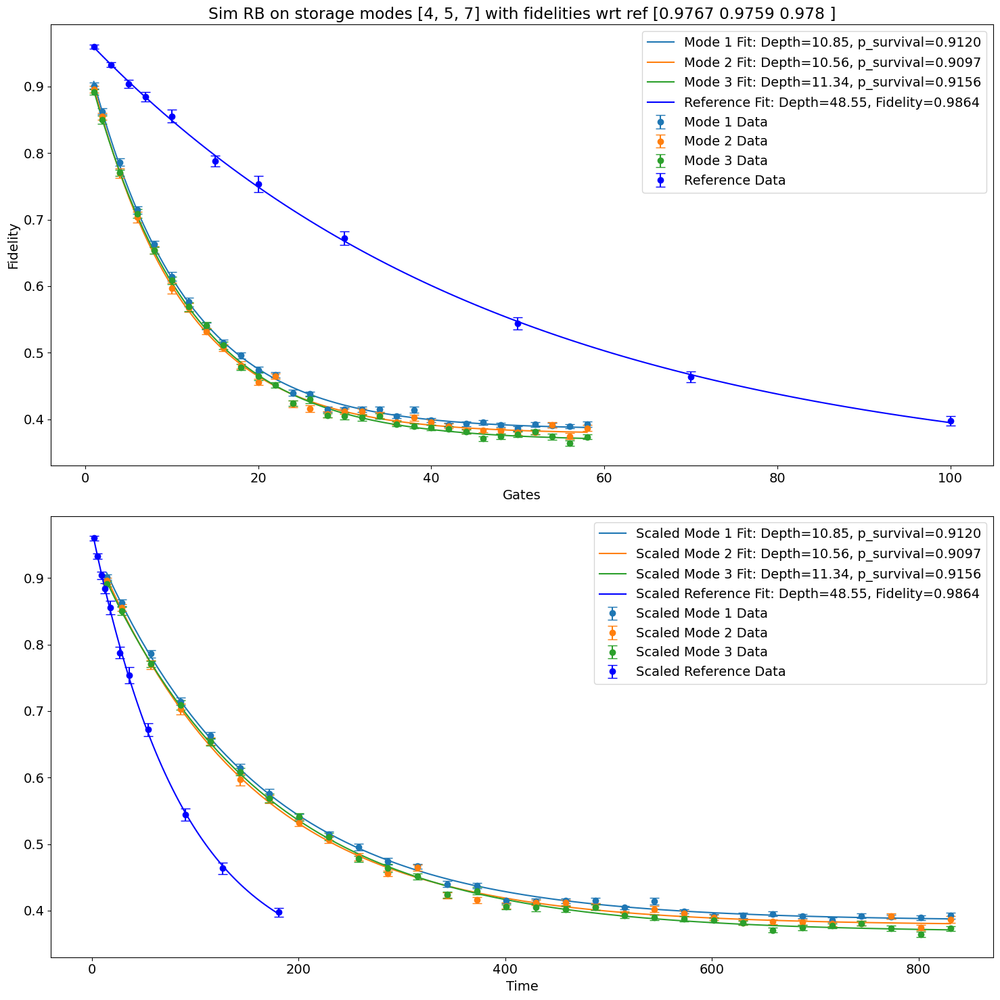

Fidelity with respect to reference: [0.9767171892686334, 0.9759164302131751, 0.9779806447263307]
--------------------------------------------------
[1, 2, 6] [800 801 802 803 804 805 806 807 808 809 810 811 812 813 814 815 816 817
 818 819 820 821 822 823 824 825 826 827 828 829]
f0g1_time:  1.8105733792693037
sim_rb_time:  12.624690430492876
[[0.8938027670739059, 0.851969033513176, 0.7486660096983032, 0.6770943490691, 0.6184795734877806, 0.5750544354457188, 0.5158017556811548, 0.5009573920661211, 0.4698235237274004, 0.4392142323086148, 0.4392318841829506, 0.42142082010151793, 0.42887451444092817, 0.4077220905133089, 0.40946919571128704, 0.39606121721104676, 0.3915659316371877, 0.40061528692095644, 0.40242614763330153, 0.39480973518630375, 0.39344343350547756, 0.38919420152584966, 0.39077764204834514, 0.3899320719242618, 0.38824867272322616, 0.3882559178448031, 0.39134382503629267, 0.3902473397794752, 0.39009915615209256, 0.3933253495251792], [0.8960255200475467, 0.8663536926028547, 0.

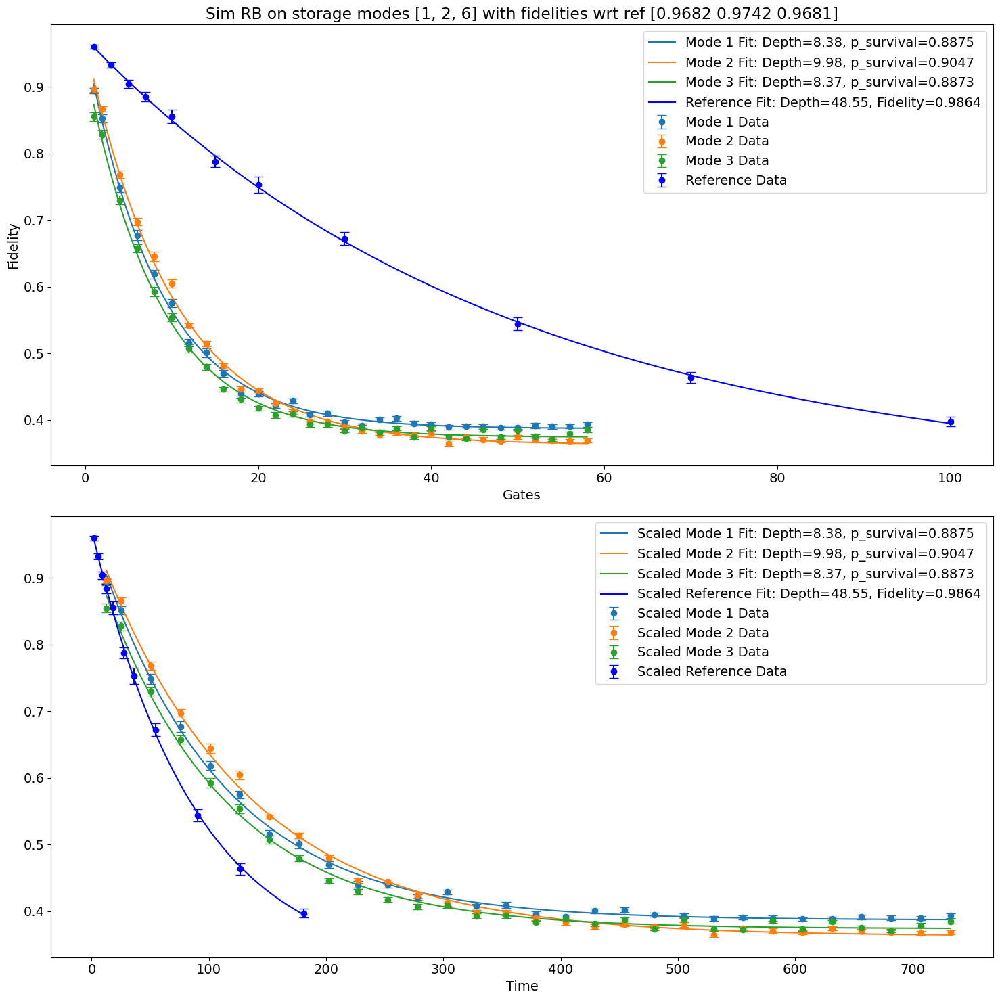

Fidelity with respect to reference: [0.9681662047036563, 0.9741728362785294, 0.9680951409504599]
--------------------------------------------------
[1, 2, 3] [830 831 832 833 834 835 836 837 838 839 840 841 842 843 844 845 846 847
 848 849 850 851 852 853 854 855 856 857 858 859]
f0g1_time:  1.8105733792693037
sim_rb_time:  12.12620326749947
[[0.8978764372322239, 0.8386560000584322, 0.753914723361979, 0.6746426418413253, 0.6132108178444582, 0.5798380940153477, 0.5255096276350059, 0.49467849475566095, 0.46224753261241197, 0.4545065187378114, 0.4428976082913922, 0.42414180062060186, 0.419864487281379, 0.40784724711032083, 0.41063416211566345, 0.38993040424641495, 0.39539984536755785, 0.38481697882660604, 0.3951971214326867, 0.37857439121924286, 0.38867687152606734, 0.37556879329738546, 0.3747947027987744, 0.3791450254116527, 0.3759646463637776, 0.8240515250187467, 0.7359249775642367, 0.6569671539929295, 0.5855780184739927, 0.5625971584826203], [0.8990739147793378, 0.8401473601064585, 0.7

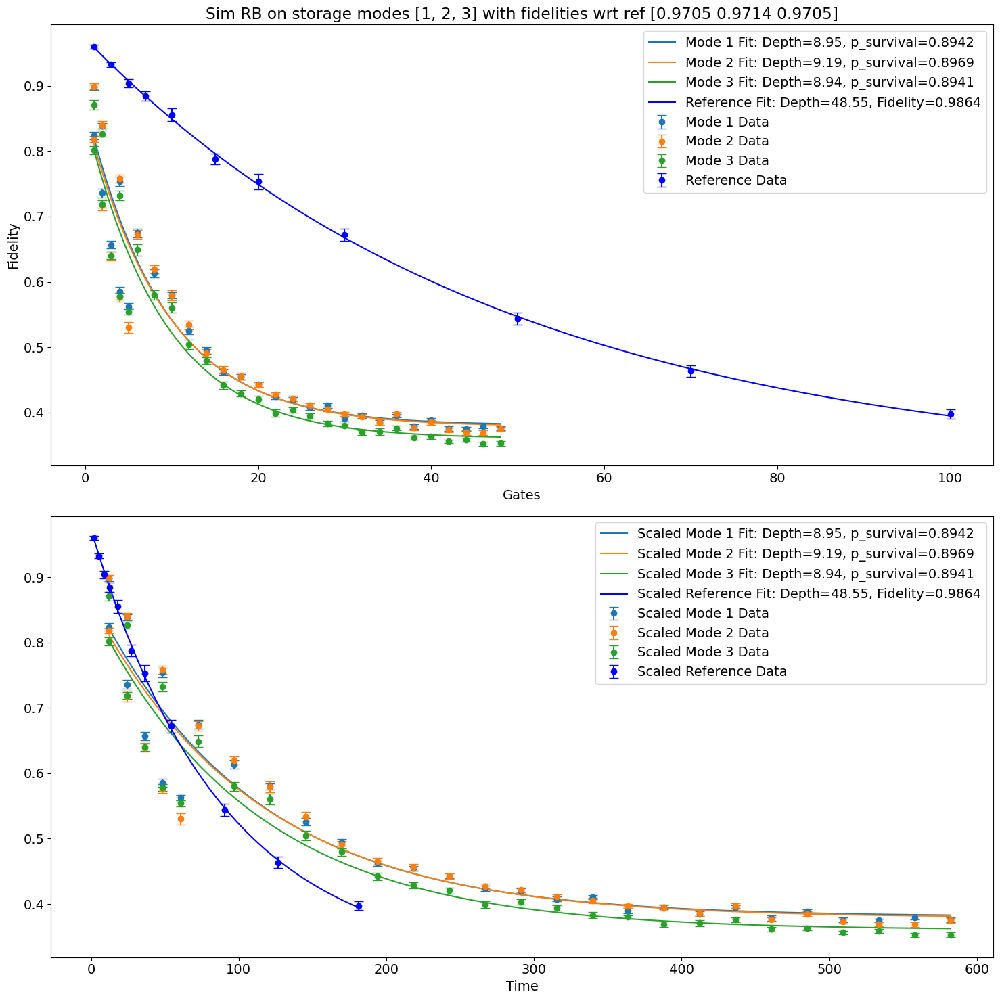

Fidelity with respect to reference: [0.9705159156053844, 0.9714393276376964, 0.9704814449185584]
                                           file_list  mode_list  \
0  [770, 771, 772, 773, 774, 775, 776, 777, 778, ...  [4, 5, 7]   
1  [800, 801, 802, 803, 804, 805, 806, 807, 808, ...  [1, 2, 6]   
2  [830, 831, 832, 833, 834, 835, 836, 837, 838, ...  [1, 2, 3]   

                                            fidelity  
0  [0.9767171892686334, 0.9759164302131751, 0.977...  
1  [0.9681662047036563, 0.9741728362785294, 0.968...  
2  [0.9705159156053844, 0.9714393276376964, 0.970...  


In [135]:
# Initialize an empty list to store the data
data = []

# open files and extract data
name = '_MultiRBAM_sweep_depth.h5'
max_idx = 100 #15
last_file_list = np.arange(830, 855,1)

for idx, comb in enumerate(combinations):
    print('--------------------------------------------------')
    file_list = file_lists[idx]
    print(comb, file_list)

    mode_list = comb
    mode_length = len(mode_list)
    # expt_path = 'path_to_experiment_data'  # Replace with actual path

    if idx> max_idx: 
        data.append({
                'file_list': file_list,
                'mode_list': mode_list,
                'fidelity': [1,1],
               # 'mode': f'Mode {i+1}'
            })
        continue


    try: 
        xlist, fids_list, ebars_list = compute_fidelity_list(prev_data, file_list, name, mode_length, expt_path)
    except FileNotFoundError:
        file_list = last_file_list
        xlist, fids_list, ebars_list = compute_fidelity_list(prev_data, file_list, name, mode_length, expt_path)
        
    fidelity_list, fit_params_list = fit_fidelity(xlist, fids_list)

    # Reference data
    file_list_reference = np.arange(51, 62, 1)
    name_reference = '_SingleRB_sweep_depth.h5'
    xlist_ref, fids_list_ref, ebars_list_ref = compute_fidelity_list_RB(prev_data, file_list_reference, name_reference, 1, expt_path)
    fit_params_ref = fit_fidelity_reference(xlist_ref, fids_list_ref)
    captionStr_ref = 'Reference'

    # scale factors for plotting 
    f0g1_time = get_f0g1_time(yaml_cfg)
    print('f0g1_time: ', f0g1_time)

    sim_rb_time = get_gate_time_RBAM(mode_list[0], mode_list[1:], yaml_cfg)
    print('sim_rb_time: ', sim_rb_time)

    # Plot both traces on the same plot
    print(fids_list)
    fids_wrt_ref = plot_fidelity(xlist, fids_list, ebars_list, fidelity_list, fit_params_list, xlist_ref, fids_list_ref, ebars_list_ref, fit_params_ref, captionStr_ref, 
                                    mode_list, close_plt=False, scale_factor=sim_rb_time, scale_factor_ref=f0g1_time)
    
    # Store the data in the list
    #for i, fid in enumerate(fidelity_list):
    data.append({
        'file_list': file_list,
        'mode_list': mode_list,
        'fidelity': fids_wrt_ref,
    })
    print('Fidelity with respect to reference:', fids_wrt_ref)
    # except FileNotFoundError:
    #     # If a file is not found, set fidelity to be empty
    #     # for i in range(mode_length):
    #     data.append({
    #         'file_list': file_list,
    #         'mode_list': mode_list,
    #         'fidelity': [1,1,1],
    #         #'mode': f'Mode {i+1}'
    #     })

# Create a DataFrame from the data
df = pd.DataFrame(data)

# Display the DataFrame
print(df)

##### Saving the data

In [137]:
# Variables from the active file
name = 'threes_rbam'
folder = saving_dataset_path  # Ensure this variable is defined in your script

# Ensure the folder exists
os.makedirs(folder, exist_ok=True)

# File path to save the DataFrame
file_path = os.path.join(folder, f"{name}.csv")

# Save the DataFrame to a CSV file
df.to_csv(file_path, index=False)

print(f"DataFrame saved to {file_path}")


DataFrame saved to h:\Shared drives\SLab\Multimode\experiment\240911\RAM_paper_results\datasets\threes_rbam.csv


In [49]:
idx = 0
file_list = file_lists[idx]
mode_length = len(combinations[idx])
xlist, fids_list, ebars_list = compute_fidelity_list(prev_data, file_list, name, mode_length, expt_path)
fidelity_list, fit_params_list = fit_fidelity(xlist, fids_list)


In [56]:
fidelity_list

[0.9413227236923497, 0.9397910132742904, 0.9437420453464702]

In [63]:
sim_rb_times = []
mode_list = [4,5,6]
for i in range(mode_length):
    sim_rb_times += [get_gate_time_RBAM(mode_list[i], mode_list[:i]+mode_list[i+1:], yaml_cfg)]
    print('sim_rb_timss: ', sim_rb_times)
sim_rb_time = np.mean(sim_rb_times)
print('sim_rb_time: ', sim_rb_time)

sim_rb_timss:  [14.745195680783302]
sim_rb_timss:  [14.745195680783302, 14.745195680783304]
sim_rb_timss:  [14.745195680783302, 14.745195680783304, 14.745195680783304]
sim_rb_time:  14.745195680783304


In [ ]:

for idx in idxs:
    comb = combinations[idx]
    file_list = file_lists[idx]
    mode_list = comb

    f0g1_time = get_f0g1_time(yaml_cfg)
    print('f0g1_time: ', f0g1_time)
    sim_rb_time = get_gate_time_RBAM(mode_list[0], mode_list[1], yaml_cfg)
    print('sim_rb_time: ', sim_rb_time)

    xlist, fids_list, ebars_list = compute_fidelity_list(prev_data, file_list, name, mode_length, expt_path)
    fidelity_list, fit_params_list = fit_fidelity(xlist, fids_list)

    # Reference data
    file_list_reference = np.arange(51, 62, 1)
    name_reference = '_SingleRB_sweep_depth.h5'
    xlist_ref, fids_list_ref, ebars_list_ref = compute_fidelity_list_RB(prev_data, file_list_reference, name_reference, 1, expt_path)
    fit_params_ref = fit_fidelity_reference(xlist_ref, fids_list_ref)
    captionStr_ref = 'Reference'

    # Print out mode list, fidelity list, and fit parameters
    print('Mode list:', mode_list)
    print('file_list: ', file_list)
    # Plot both traces on the same plot
    fids_wrt_ref = plot_fidelity(xlist, fids_list, ebars_list, fidelity_list, fit_params_list, xlist_ref, fids_list_ref, ebars_list_ref, fit_params_ref, captionStr_ref, 
                                    mode_list, close_plt=False, scale_factor=sim_rb_time, scale_factor_ref=f0g1_time)
    # print fidelity wrt ref
    print('fidelities wrt ref: ', fids_wrt_ref)

In [59]:
target_mode_no = 4
spectator_mode_nos = [5, 7]
for mode_no in [target_mode_no] + spectator_mode_nos:
    print('--------------------------------------------------')
    print(mode_no)

--------------------------------------------------
4
--------------------------------------------------
5
--------------------------------------------------
7


In [13]:
combinations = generate_mode_combinations([1,2,3,4,5,6,7], 3, [])
# Number of combinations to select
n = 3

# Randomly select n combinations
selected_combinations = random.sample(combinations, n)

# Print the selected combinations
print(selected_combinations)

[[3, 4, 5], [1, 3, 7], [1, 2, 3]]


matrix = np.zeros((7,7))
for comb in combin

In [ ]:
# Example usage
file_list = np.arange(140, 169, 1)#np.arange(36, 75, 1)
name = '_MultiRBAM_sweep_depth.h5'
mode_list = [1,2]
mode_length = len(mode_list)
# expt_path = 'path_to_experiment_data'  # Replace with actual path

xlist, fids_list, ebars_list = compute_fidelity_list(file_list, name, mode_length, expt_path)
fidelity_list, fit_params_list = fit_fidelity(xlist, fids_list)

# Reference data
file_list_reference = np.arange(51, 62, 1)
name_reference = '_SingleRB_sweep_depth.h5'
xlist_ref, fids_list_ref, ebars_list_ref = compute_fidelity_list_RB(file_list_reference, name_reference, 1, expt_path)
fit_params_ref = fit_fidelity_reference(xlist_ref, fids_list_ref)
captionStr_ref = 'Reference'

# Plot both traces on the same plot
plot_fidelity(xlist, fids_list, ebars_list, fidelity_list, fit_params_list, xlist_ref, fids_list_ref, ebars_list_ref, fit_params_ref, captionStr_ref, mode_list)

### Checking Depth = 10

In [1278]:
# Custom labels
num_modes = 7 
labels = [f'Storage {i}' for i in range(1, num_modes)]

def plot_depth(post_selected_fidelity, raw_fidelity, labels): 
    # Plot the heatmaps
    plt.figure(figsize=(12, 6))

    # Post-selected fidelity heatmap
    post_selected_fidelity = post_selected_fidelity[1:, 1:]
    raw_fidelity = raw_fidelity[1:, 1:]
    plt.subplot(1, 2, 1)
    sns.heatmap(post_selected_fidelity, annot=True, fmt=".2f", cmap="viridis", cbar=True, xticklabels=labels, yticklabels=labels)
    plt.title('Post-Selected Fidelity')
    plt.ylabel('Fidelity of mode #')
    plt.xlabel('Mode we paired it with ')

    # Raw fidelity heatmap
    plt.subplot(1, 2, 2)
    sns.heatmap(raw_fidelity, annot=True, fmt=".2f", cmap="viridis", cbar=True, xticklabels=labels, yticklabels=labels)
    plt.title('Raw Fidelity')
    plt.ylabel('Fidelity of mode ')
    plt.xlabel('Mode we paired it with (mode #)')
    # super title 
    plt.suptitle('Depth 10 Pairwise MultiRBAM')

    plt.tight_layout()
    plt.show()

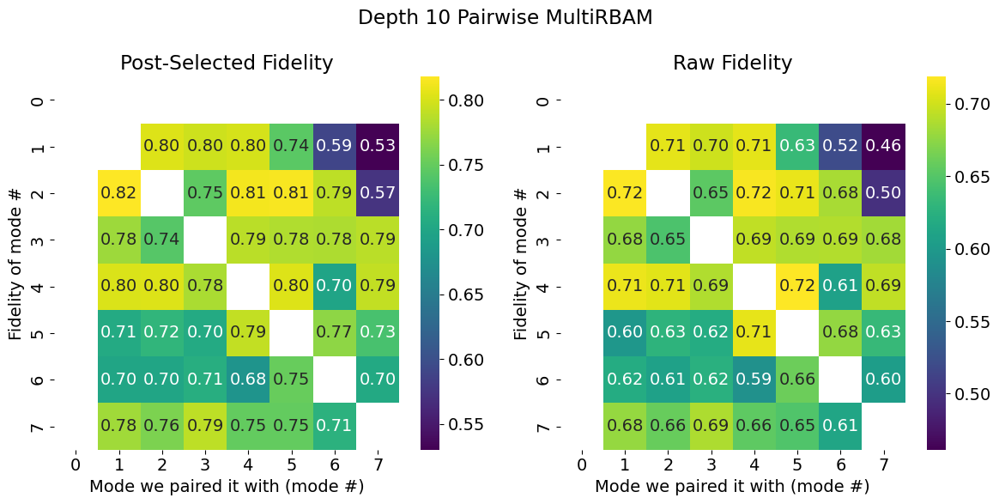

In [1269]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


full_mode_list = [1, 2, 3, 4, 5, 6, 7]
# Initialize matrices to store fidelity values
num_modes = max(full_mode_list) + 1  # Assuming mode indices start from 0
post_selected_fidelity = np.full((num_modes, num_modes), np.nan)
raw_fidelity = np.full((num_modes, num_modes), np.nan)


num_modes_sim_rb = 2
all_combinations = generate_mode_combinations(full_mode_list, num_modes_sim_rb, skip_combos= [])
file_no = 114
name = '_MultiRBAM_sweep_depth.h5'

for combo in all_combinations:
    full_name = str(file_no).zfill(5) + name
    try:
        temp_data, attrs = prev_data(expt_path, full_name)
    except FileNotFoundError:
        file_no += 1
        continue

    measure_mode_nos = combo
    mean_ps_list, err_ps_list = RBAM_extract(temp_data, mode_idxs=np.arange(len(measure_mode_nos)), post_select=True)
    mean_list, err_list = RBAM_extract(temp_data, mode_idxs=np.arange(len(measure_mode_nos)), post_select=False)
    
    # Store the fidelity values in the matrices using mode numbers
    x, y = combo
    post_selected_fidelity[x, y] = mean_ps_list[0]
    post_selected_fidelity[y, x] = mean_ps_list[1]
    raw_fidelity[x, y] = mean_list[0]
    raw_fidelity[y, x] = mean_list[1]
    
    file_no += 1

plot_depth(post_selected_fidelity, raw_fidelity)


In [1270]:
file_list = np.arange(135,140,1)
combos = generate_mode_combinations([1,2,5,6,7], 2, skip_combos= [[1,2], [1,5], [5,6], [5,7], [6,7]])
name = '_MultiRBAM_sweep_depth.h5'
update_matrix = True

for idx, file_no in enumerate(file_list):
    mode1, mode2 = combos[idx]
    print('Mode1:', mode1, 'Mode2:', mode2)
    full_name = str(file_no).zfill(5) + name
    temp_data, attrs = prev_data(expt_path, full_name)
    measure_mode_nos = combos[idx]
    mean_ps_list, err_ps_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=True)# np.arange(len(mode_nos)))
    mean_list, err_list = RBAM_extract(temp_data, mode_idxs = np.arange(len(measure_mode_nos)), post_select=False)# np.arange(len(mode_nos)))
    for mode_idx, mode_no in enumerate(measure_mode_nos):
        print('--------------------------------------------------')
        print('Raw Result for Mode ', mode_no, 'is', mean_list[mode_idx], err_list[mode_idx])
        print('Post Select Result for Mode ', mode_no, 'is', mean_ps_list[mode_idx], err_ps_list[mode_idx])
    if update_matrix: 
        post_selected_fidelity[mode1, mode2] = mean_ps_list[0]
        post_selected_fidelity[mode2, mode1] = mean_ps_list[1]
        raw_fidelity[mode1, mode2] = mean_list[0]
        raw_fidelity[mode2, mode1] = mean_list[1]

Mode1: 1 Mode2: 6
--------------------------------------------------
Raw Result for Mode  1 is 0.6205430471103879 0.011280365913946449
Post Select Result for Mode  1 is 0.7121588654035825 0.011251547316657924
--------------------------------------------------
Raw Result for Mode  6 is 0.615244804705087 0.00884965604790119
Post Select Result for Mode  6 is 0.7022018892114293 0.009205463497148748
Mode1: 1 Mode2: 7
--------------------------------------------------
Raw Result for Mode  1 is 0.6942294704391193 0.005173949715415222
Post Select Result for Mode  1 is 0.8067247327664785 0.004206539509994908
--------------------------------------------------
Raw Result for Mode  7 is 0.6732011393590404 0.007285451390832134
Post Select Result for Mode  7 is 0.7806909011315292 0.007128325155669589
Mode1: 2 Mode2: 5
--------------------------------------------------
Raw Result for Mode  2 is 0.6925016991048268 0.004745121878330529
Post Select Result for Mode  2 is 0.8030191063123835 0.003543159106

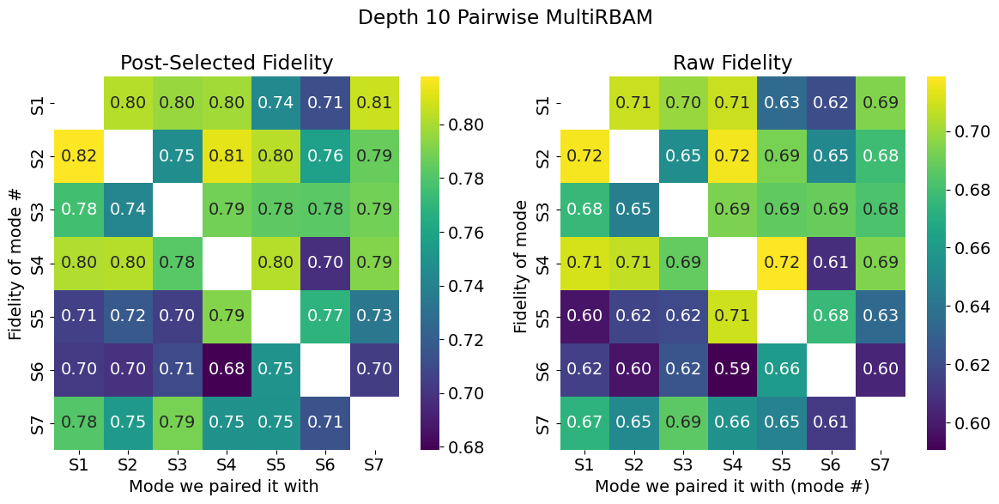

In [1279]:
plot_depth(post_selected_fidelity, raw_fidelity, labels = [f'S{i}' for i in [1,2,3,4,5,6,7]])

# Prepulse Time 

In [102]:
from experiments.MM_base import MM_base
mm_base = MM_base(cfg = yaml_cfg)

man_idx = 1
# parity_str = [['qubit', 'ge', 'hpi'], # Starting parity meas
#                 ['qubit', 'ge', 'parity_M' + str(man_idx)], 
#                 ['qubit', 'ge', 'hpi']]

half_f0g1_str = [ ['qubit', 'ge', 'hpi', 0],
                     ['qubit', 'ef_new', 'pi',0],
                    ['man', 'M1' , 'pi',0 ],
                  ['storage', 'M1-S2', 'pi',0],
                  # ['storage', 'M1-S1', 'pi',180],
                  #   ['buffer', 'M1-S6', 'pi',180],
                  #   ['man', 'M1' , 'pi',180 ],
                  #   ['qubit', 'ef_new', 'pi',180],
                  #   ['qubit', 'ge', 'hpi',180]             
                 ]

# half_f0g1_str = [                ['qubit', 'ge', 'hpi'], 
#                  ['qubit', 'ef', 'pi']]

# rev_half_f0g1_str = [['man', 'M1', 'pi'],
#                      ['qubit', 'ef', 'pi'],
#                      ['qubit', 'ge', 'hpi']]

strr = [['storage', 'M1-S1', 'pi'], ['man', 'M1' , 'pi']]
    
creator = mm_base.get_prepulse_creator(half_f0g1_str)
creator.pulse

array([[3568.1751638611518, 3425.5537944060666, 2007.09, 520.93],
       [5195, 3000, 15000, 5000],
       [0, 0.15377089082752435, 0.6152866896346518, 1.0554480047666095],
       [0, 0, 0, 0],
       [2, 2, 0, 1],
       ['g', 'f', 'flat_top', 'flat_top'],
       [0.035, 0.005, 0.005, 0.005]], dtype=object)

In [105]:
np.sum([0, 0.15377089082752435, 0.6152866896346518, 1.0554480047666095]) + (3*6*0.005) + (4*0.035) + (4*0.01)

2.0945055852287857

In [44]:
test_pulse = [[3568.1751638611518, 3425.5537944060666, 2007.09],
 [10819, 8327, 15000],
 [0, 0, 0.6152866896346518],
 [0, 0, 0],
 [2, 2, 0],
 ['g', 'g', 'flat_top'],
 [0.035, 0.035, 0.005]]

def total_time(self, test_pulse):
    t = 0 
    for i in range(len(test_pulse[0])):
        if test_pulse[5][i] == 'g':
            t += test_pulse[-1][i] * 4
        elif test_pulse[5][i] == 'flat_top':
            t += test_pulse[-1][i] * 6 + test_pulse[2][i]
        t+= 0.01 # 10ns delay
    return t 

total_time(None, test_pulse)


0.9552866896346519

test_pulse = [3568.1751638611518, 3425.5537944060666, 2007.09],
 [10819, 8327, 15000],
 [0, 0, 0.6152866896346518],
 [0, 0, 0],
 [2, 2, 0],
 ['g', 'g', 'flat_top'],
 [0.035, 0.035, 0.005]